# MadMiner physics tutorial (part 2A)

Johann Brehmer, Felix Kling, Irina Espejo, and Kyle Cranmer 2018-2019

In this second part of the tutorial, we'll generate events and extract the observables and weights from them. You have two options: In this notebook we'll do this at parton level, in the alternative part 2b we use Delphes.

## 0. Preparations

Before you execute this notebook, make sure you have a running installation of MadGraph.

In [8]:
import os
import logging
import numpy as np

from madminer.core import MadMiner
from madminer.lhe import LHEReader
from madminer.sampling import combine_and_shuffle
from madminer.plotting import plot_distributions
from particle import Particle

In [9]:
# MadMiner output
logging.basicConfig(
    format="%(asctime)-5.5s %(name)-20.20s %(levelname)-7.7s %(message)s",
    datefmt="%H:%M",
    level=logging.DEBUG,
)

# Output of all other modules (e.g. matplotlib)
for key in logging.Logger.manager.loggerDict:
    if "madminer" not in key:
        logging.getLogger(key).setLevel(logging.WARNING)

Please enter here the environment variable pointing to your MG5 installation folder.

In [10]:
#mg_dir = os.getenv("MG_FOLDER_PATH")
mg_dir="/nfs/dust/cms/user/zimermma/madminer/MG5_aMC_v2_9_4"

## 1. Generate events

Let's load our setup:

In [11]:
miner = MadMiner()
miner.load("data/setup.h5")

12:35 madminer.utils.inter ERROR   HDF5 file does not contain nuisance parameters information
12:35 madminer.utils.inter ERROR   HDF5 file does not contain finite difference information
12:35 madminer.utils.inter ERROR   HDF5 file does not contain observables information
12:35 madminer.utils.inter ERROR   HDF5 file does not contain sample summary information
12:35 madminer.utils.inter ERROR   HDF5 file does not contain sample information
12:35 madminer.utils.inter ERROR   HDF5 file does not contain systematic information
12:35 madminer.core.madmin INFO    Found 2 parameters:
12:35 madminer.core.madmin INFO       CWL2 (LHA: dim6 2, Power: 2, Range: (-20.0, 20.0))
12:35 madminer.core.madmin INFO       CPWL2 (LHA: dim6 5, Power: 2, Range: (-20.0, 20.0))
12:35 madminer.core.madmin INFO    Found 6 benchmarks:
12:35 madminer.core.madmin INFO       sm: CWL2 = 0.00e+00, CPWL2 = 0.00e+00
12:35 madminer.core.madmin INFO       w: CWL2 = 15.20, CPWL2 = 0.10
12:35 madminer.core.madmin INFO       ne

In a next step, MadMiner starts MadGraph to generate events and calculate the weights. You can use `run()` or `run_multiple()`; the latter allows to generate different runs with different run cards and optimizing the phase space for different benchmark points. 

In either case, you have to provide paths to the process card, run card, param card (the entries corresponding to the parameters of interest will be automatically adapted), and an empty reweight card. Log files in the `log_directory` folder collect the MadGraph output and are important for debugging.

The `sample_benchmark` (or in the case of `run_all`, `sample_benchmarks`) option can be used to specify which benchmark should be used for sampling, i.e. for which benchmark point the phase space is optimized. If you just use one benchmark, reweighting to far-away points in parameter space can lead to large event weights and thus large statistical fluctuations. It is therefore often a good idea to combine a lot of events at the "reference hypothesis" (for us the SM) and smaller samples from other benchmarks that span the parameter space.


In [12]:
miner.run(
    sample_benchmark="sm",
    mg_directory=mg_dir,
    mg_process_directory="./mg_processes/signal1",
    proc_card_file="cards/proc_card_signal.dat",
    param_card_template_file="cards/param_card_template.dat",
    run_card_file="cards/run_card_signal_large.dat",
    log_directory="logs/signal",
    python_executable="python3",
)

12:35 madminer.core.madmin INFO    Adding python3 bin folder to PATH
12:35 madminer.core.madmin INFO    Using Python executable /nfs/dust/cms/user/zimermma/miniconda3/envs/madminer/bin/python3
12:35 madminer.utils.inter INFO    Generating MadGraph process folder from cards/proc_card_signal.dat at ./mg_processes/signal1
12:35 madminer.utils.inter INFO    Calling MadGraph: export PATH=/nfs/dust/cms/user/zimermma/miniconda3/envs/madminer/bin:$PATH; python3 /nfs/dust/cms/user/zimermma/madminer/MG5_aMC_v2_9_4/bin/mg5_aMC /tmp/generate.mg5
12:35 madminer.core.madmin INFO    Run 0
12:35 madminer.core.madmin INFO      Sampling from benchmark: sm
12:35 madminer.core.madmin INFO      Original run card:       cards/run_card_signal_large.dat
12:35 madminer.core.madmin INFO      Original Pythia8 card:   None
12:35 madminer.core.madmin INFO      Original config card:    None
12:35 madminer.core.madmin INFO      Copied run card:         madminer/cards/run_card_0.dat
12:35 madminer.core.madmin INFO   

In [13]:
additional_benchmarks = ["w", "ww", "neg_w", "neg_ww"]

In [14]:
miner.run_multiple(
    sample_benchmarks=additional_benchmarks,
    mg_directory=mg_dir,
    mg_process_directory="./mg_processes/signal2",
    proc_card_file="cards/proc_card_signal.dat",
    param_card_template_file="cards/param_card_template.dat",
    run_card_files=["cards/run_card_signal_small.dat"],
    log_directory="logs/signal",
    python_executable="python3",
)

12:41 madminer.core.madmin INFO    Adding python3 bin folder to PATH
12:41 madminer.core.madmin INFO    Using Python executable /nfs/dust/cms/user/zimermma/miniconda3/envs/madminer/bin/python3
12:41 madminer.utils.inter INFO    Generating MadGraph process folder from cards/proc_card_signal.dat at ./mg_processes/signal2
12:41 madminer.utils.inter INFO    Calling MadGraph: export PATH=/nfs/dust/cms/user/zimermma/miniconda3/envs/madminer/bin:$PATH; python3 /nfs/dust/cms/user/zimermma/madminer/MG5_aMC_v2_9_4/bin/mg5_aMC /tmp/generate.mg5
12:41 madminer.core.madmin INFO    Run 0
12:41 madminer.core.madmin INFO      Sampling from benchmark: w
12:41 madminer.core.madmin INFO      Original run card:       cards/run_card_signal_small.dat
12:41 madminer.core.madmin INFO      Original Pythia8 card:   None
12:41 madminer.core.madmin INFO      Original config card:    None
12:41 madminer.core.madmin INFO      Copied run card:         madminer/cards/run_card_0.dat
12:41 madminer.core.madmin INFO    

This will take a moment -- time for a coffee break!

After running any event generation through MadMiner, you should check whether the run succeeded: are the usual output files there, do the log files show any error messages? MadMiner does not (yet) perform any explicit checks, and if something went wrong in the event generation, it will only notice later when trying to load the event files.

### Backgrounds

We can also easily add other processes like backgrounds. An important option is the `is_background` keyword, which should be used for processes that do *not* depend on the parameters theta. `is_background=True` will disable the reweighting and re-use the same weights for all cross sections.

To reduce the runtime of the notebook, the background part is commented out here. Feel free to activate it and let it run during a lunch break.

In [16]:
miner.run(
    is_background=True,
    sample_benchmark='sm',
    mg_directory=mg_dir,
    mg_process_directory='./mg_processes/background',
    proc_card_file='cards/proc_card_background.dat',
    param_card_template_file='cards/param_card_template.dat',
    run_card_file='cards/run_card_background.dat',
    log_directory='logs/background',
)

12:50 madminer.utils.inter INFO    Generating MadGraph process folder from cards/proc_card_background.dat at ./mg_processes/background
12:50 madminer.utils.inter INFO    Calling MadGraph: /nfs/dust/cms/user/zimermma/madminer/MG5_aMC_v2_9_4/bin/mg5_aMC /tmp/generate.mg5
12:50 madminer.core.madmin INFO    Run 0
12:50 madminer.core.madmin INFO      Sampling from benchmark: sm
12:50 madminer.core.madmin INFO      Original run card:       cards/run_card_background.dat
12:50 madminer.core.madmin INFO      Original Pythia8 card:   None
12:50 madminer.core.madmin INFO      Original config card:    None
12:50 madminer.core.madmin INFO      Copied run card:         madminer/cards/run_card_0.dat
12:50 madminer.core.madmin INFO      Copied Pythia8 card:     None
12:50 madminer.core.madmin INFO      Copied config card:      None
12:50 madminer.core.madmin INFO      Param card:              madminer/cards/param_card_0.dat
12:50 madminer.core.madmin INFO      Reweight card:           madminer/cards/r

Finally, note that both `MadMiner.run()` and `MadMiner.run_multiple()` have a `only_create_script` keyword. If that is set to True, MadMiner will not start the event generation directly, but prepare folders with all the right settings and ready-to-run bash scripts. This might make it much easier to generate Events on a high-performance computing system. 

## 2. Prepare analysis of the LHE samples

The `madminer.lhe` submodule allows us to extract observables directly from the parton-level LHE samples, including an approximate description of the detector response with smearing functions. The central object is an instance of the `LHEProcessor` class, which has to be initialized with a MadMiner file:

In [21]:
lhe = LHEReader("data/setup.h5")

13:50 madminer.utils.inter ERROR   HDF5 file does not contain nuisance parameters information
13:50 madminer.utils.inter ERROR   HDF5 file does not contain finite difference information
13:50 madminer.utils.inter ERROR   HDF5 file does not contain observables information
13:50 madminer.utils.inter ERROR   HDF5 file does not contain sample summary information
13:50 madminer.utils.inter ERROR   HDF5 file does not contain sample information
13:50 madminer.utils.inter ERROR   HDF5 file does not contain systematic information


#### azimermma: now we inspect the files contents

In [22]:
import h5py
import numpy as np
setupfile = "data/setup.h5"
f = h5py.File(setupfile)
f.keys()
for key in f.keys():
    print("--------------------------------------------------------------")
    print(key+":")
    for string in np.array(f[key]):
        print("  ",string +":", np.array(f[key][string]))
    print

--------------------------------------------------------------
benchmarks:
   is_nuisance: [0 0 0 0 0 0]
   is_reference: [0 0 0 0 0 0]
   names: [b'sm' b'w' b'neg_w' b'ww' b'neg_ww' b'morphing_basis_vector_5']
   values: [[  0.           0.        ]
 [ 15.2          0.1       ]
 [-15.4          0.2       ]
 [  0.3         15.1       ]
 [  0.4        -15.3       ]
 [-12.93644108 -19.29272452]]
--------------------------------------------------------------
morphing:
   components: [[0 0]
 [0 1]
 [0 2]
 [1 0]
 [1 1]
 [2 0]]
   morphing_matrix: [[ 1.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00]
 [-2.62220681e-03 -1.69846336e-05  9.73990040e-04  3.35497229e-02
  -3.05388473e-02 -1.34567421e-03]
 [-4.30731327e-03 -5.00631179e-05  3.69724317e-05  2.17611007e-03
   2.13078085e-03  1.35130304e-05]
 [-1.61257668e-03  3.30580796e-02 -3.17966587e-02  2.01068257e-04
   7.29574187e-04 -5.79486745e-04]
 [ 4.98287426e-03  3.44444675e-04 -3.04379029e-0

After creating the `LHEReader` object, one can add a number of event samples (the output of running MadGraph in step 1) with the `add_sample()` function.

In addition, you have to provide the information which sample was generated from which benchmark with the `sampled_from_benchmark` keyword, and set `is_background=True` for all background samples.

In [23]:
lhe.add_sample(
    lhe_filename="mg_processes/signal1/Events/run_01/unweighted_events.lhe.gz",
    sampled_from_benchmark="sm",
    is_background=False,
    k_factor=1.0,
)
for i, benchmark in enumerate(additional_benchmarks):
    lhe.add_sample(
        lhe_filename="mg_processes/signal2/Events/run_0{}/unweighted_events.lhe.gz".format(i + 1),
        sampled_from_benchmark=benchmark,
        is_background=False,
        k_factor=1.0,
    )

lhe.add_sample(
    lhe_filename='mg_processes/background/Events/run_01/unweighted_events.lhe.gz',
    sampled_from_benchmark='sm',
    is_background=True,
    k_factor=1.0,
)

13:51 madminer.lhe.lhe_rea DEBUG   Adding event sample mg_processes/signal1/Events/run_01/unweighted_events.lhe.gz
13:51 madminer.lhe.lhe_rea DEBUG   Adding event sample mg_processes/signal2/Events/run_01/unweighted_events.lhe.gz
13:51 madminer.lhe.lhe_rea DEBUG   Adding event sample mg_processes/signal2/Events/run_02/unweighted_events.lhe.gz
13:51 madminer.lhe.lhe_rea DEBUG   Adding event sample mg_processes/signal2/Events/run_03/unweighted_events.lhe.gz
13:51 madminer.lhe.lhe_rea DEBUG   Adding event sample mg_processes/signal2/Events/run_04/unweighted_events.lhe.gz
13:51 madminer.lhe.lhe_rea DEBUG   Adding event sample mg_processes/background/Events/run_01/unweighted_events.lhe.gz


## 3. Smearing functions to model the detector response

Now we have to define the smearing functions that are used (in lieu of a proper shower and detector simulation). Here we will assume a simple 10% uncertainty on the jet energy measurements and a $\pm 0.1$ smearing for jet $\eta$ and $\phi$. The transverse momenta of the jets are then derived from the smeared energy and the on-shell condition for the quarks (this is what `pt_resolution_abs=None` does). The photons from the Higgs are assumed to be measured perfectly (otherwise we'd have to call `set_smearing` another time with `pdgis=[22]`).

In [30]:
# Partons giving rise to jets
particles = [
    *Particle.findall(lambda p: p.pdgid.is_quark),
    *Particle.findall(pdg_name="g"),
]

lhe.set_smearing(
    pdgids=[int(p.pdgid) for p in particles],
    energy_resolution_abs=0.0,
    energy_resolution_rel=0.1,
    pt_resolution_abs=None,
    pt_resolution_rel=None,
    eta_resolution_abs=0.1,
    eta_resolution_rel=0.0,
    phi_resolution_abs=0.1,
    phi_resolution_rel=0.0,
)

In addition, we can define noise that only affects MET. This adds Gaussian noise with mean 0 and std `abs_ + rel * HT` to MET_x and MET_y separately.

In [31]:
lhe.set_met_noise(abs_=10.0, rel=0.05)

## 4. Observables and cuts

The next step is the definition of observables, either through a Python function or an expression that can be evaluated. Here we demonstrate the latter, which is implemented in `add_observable()`. In the expression string, you can use the terms `j[i]`, `e[i]`, `mu[i]`, `a[i]`, `met`, where the indices `i` refer to a ordering by the transverse momentum. In addition, you can use `p[i]`, which denotes the `i`-th particle in the order given in the LHE sample (which is the order in which the final-state particles where defined in MadGraph).

All of these represent objects inheriting from scikit-hep [LorentzVectors](http://scikit-hep.org/api/math.html#vector-classes), see the link for a documentation of their properties. In addition, they have `charge` and `pdg_id` properties.

`add_observable()` has an optional keyword `required`. If `required=True`, we will only keep events where the observable can be parsed, i.e. all involved particles have been detected. If `required=False`, un-parseable observables will be filled with the value of another keyword `default`.

In a realistic project, you would want to add a large number of observables that capture all information in your events. Here we will just define two observables, the transverse momentum of the leading (= higher-pT) jet, and the azimuthal angle between the two leading jets.

In [32]:
lhe.add_observable(
    "pt_j1",
    "j[0].pt",
    required=False,
    default=0.0,
)
lhe.add_observable(
    "delta_phi_jj",
    "j[0].deltaphi(j[1]) * (-1.0 + 2.0 * float(j[0].eta > j[1].eta))",
    required=True,
)
lhe.add_observable(
    "met",
    "met.pt",
    required=True,
)

14:46 madminer.lhe.lhe_rea DEBUG   Adding optional observable pt_j1 = j[0].pt with default 0.0
14:46 madminer.lhe.lhe_rea DEBUG   Adding required observable delta_phi_jj = j[0].deltaphi(j[1]) * (-1.0 + 2.0 * float(j[0].eta > j[1].eta))
14:46 madminer.lhe.lhe_rea DEBUG   Adding required observable met = met.pt


We can also add cuts, again in parse-able strings. In addition to the objects discussed above, they can contain the observables:

In [33]:
lhe.add_cut("(a[0] + a[1]).m > 122.0")
lhe.add_cut("(a[0] + a[1]).m < 128.0")
lhe.add_cut("pt_j1 > 20.0")

14:47 madminer.lhe.lhe_rea DEBUG   Adding cut (a[0] + a[1]).m > 122.0
14:47 madminer.lhe.lhe_rea DEBUG   Adding cut (a[0] + a[1]).m < 128.0
14:47 madminer.lhe.lhe_rea DEBUG   Adding cut pt_j1 > 20.0


## 5. Run analysis and store processes events

The function `analyse_samples` then calculates all observables from the LHE file(s) generated before, applies the smearing, and checks which events pass the cuts:

In [34]:
lhe.analyse_samples()

14:47 madminer.lhe.lhe_rea INFO    Analysing LHE sample mg_processes/signal1/Events/run_01/unweighted_events.lhe.gz: Calculating 3 observables, requiring 3 selection cuts, using 0 efficiency factors, associated with no systematics
14:47 madminer.lhe.lhe_rea DEBUG   Extracting nuisance parameter definitions from LHE file
14:47 madminer.utils.inter DEBUG   Parsing nuisance parameter setup from LHE file at mg_processes/signal1/Events/run_01/unweighted_events.lhe.gz
14:47 madminer.utils.inter DEBUG   Systematics setup: OrderedDict()
14:47 madminer.utils.inter DEBUG   1 weight groups
14:47 madminer.lhe.lhe_rea DEBUG   systematics_dict: OrderedDict()
14:47 madminer.utils.inter DEBUG   Parsing LHE file mg_processes/signal1/Events/run_01/unweighted_events.lhe.gz
14:47 madminer.utils.inter DEBUG   Parsing header and events as XML with ElementTree
14:47 madminer.utils.inter DEBUG   Found entry event_norm = sum in LHE header. Interpreting this as weight_norm_is_average = False.
14:47 madminer.uti

15:00 root                 DEBUG     Weights for benchmark morphing_basis_vector_5 exist in both
15:00 madminer.lhe.lhe_rea INFO    Analysing LHE sample mg_processes/signal2/Events/run_02/unweighted_events.lhe.gz: Calculating 3 observables, requiring 3 selection cuts, using 0 efficiency factors, associated with no systematics
15:00 madminer.lhe.lhe_rea DEBUG   Extracting nuisance parameter definitions from LHE file
15:00 madminer.utils.inter DEBUG   Parsing nuisance parameter setup from LHE file at mg_processes/signal2/Events/run_02/unweighted_events.lhe.gz
15:00 madminer.utils.inter DEBUG   Systematics setup: OrderedDict()
15:00 madminer.utils.inter DEBUG   1 weight groups
15:00 madminer.lhe.lhe_rea DEBUG   systematics_dict: OrderedDict()
15:00 madminer.utils.inter DEBUG   Parsing LHE file mg_processes/signal2/Events/run_02/unweighted_events.lhe.gz
15:00 madminer.utils.inter DEBUG   Parsing header and events as XML with ElementTree
15:00 madminer.utils.inter DEBUG   Found entry event_

15:04 madminer.lhe.lhe_rea DEBUG   Found 10000 events
15:04 madminer.lhe.lhe_rea DEBUG   Found 10000 events
15:04 root                 DEBUG   Merging data extracted from this file with data from previous files
15:04 root                 DEBUG     Weights for benchmark sm exist in both
15:04 root                 DEBUG     Weights for benchmark w exist in both
15:04 root                 DEBUG     Weights for benchmark neg_w exist in both
15:04 root                 DEBUG     Weights for benchmark ww exist in both
15:04 root                 DEBUG     Weights for benchmark neg_ww exist in both
15:04 root                 DEBUG     Weights for benchmark morphing_basis_vector_5 exist in both
15:04 madminer.lhe.lhe_rea INFO    Analysing LHE sample mg_processes/signal2/Events/run_04/unweighted_events.lhe.gz: Calculating 3 observables, requiring 3 selection cuts, using 0 efficiency factors, associated with no systematics
15:04 madminer.lhe.lhe_rea DEBUG   Extracting nuisance parameter definition

15:18 madminer.utils.inter INFO      39134 / 50000 events pass cut Cut(name='CUT', val_expression='(a[0] + a[1]).m > 122.0', is_required=False)
15:18 madminer.utils.inter INFO      40911 / 50000 events pass cut Cut(name='CUT', val_expression='(a[0] + a[1]).m < 128.0', is_required=False)
15:18 madminer.utils.inter INFO      49969 / 50000 events pass cut Cut(name='CUT', val_expression='pt_j1 > 20.0', is_required=False)
15:18 madminer.utils.inter INFO      30026 events pass all cuts/efficiencies
15:18 madminer.lhe.lhe_rea DEBUG   Found weights ['sm', 'w', 'neg_w', 'ww', 'neg_ww', 'morphing_basis_vector_5'] in LHE file
15:18 madminer.lhe.lhe_rea DEBUG   Found 30026 events
15:18 madminer.lhe.lhe_rea DEBUG   Found 30026 events
15:18 root                 DEBUG   Merging data extracted from this file with data from previous files
15:18 root                 DEBUG     Weights for benchmark sm exist in both
15:18 root                 DEBUG     Weights for benchmark w exist in both
15:18 root     

The values of the observables and the weights are then saved in the HDF5 file. It is possible to overwrite the same file, or to leave the original file intact and save all the data into a new file as follows:

In [35]:
lhe.save("data/lhe_data.h5")

16:11 madminer.lhe.lhe_rea DEBUG   Loading HDF5 data from data/setup.h5 and saving file to data/lhe_data.h5
16:11 madminer.lhe.lhe_rea DEBUG   Weight names: ['sm', 'w', 'neg_w', 'ww', 'neg_ww', 'morphing_basis_vector_5']
16:11 madminer.utils.inter DEBUG   Benchmark morphing_basis_vector_5 already in the list of benchmarks
16:11 madminer.utils.inter DEBUG   Benchmark neg_w already in the list of benchmarks
16:11 madminer.utils.inter DEBUG   Benchmark neg_ww already in the list of benchmarks
16:11 madminer.utils.inter DEBUG   Benchmark sm already in the list of benchmarks
16:11 madminer.utils.inter DEBUG   Benchmark w already in the list of benchmarks
16:11 madminer.utils.inter DEBUG   Benchmark ww already in the list of benchmarks
16:11 madminer.utils.inter DEBUG   Weight names to save in event file: odict_keys(['sm', 'w', 'neg_w', 'ww', 'neg_ww', 'morphing_basis_vector_5'])
16:11 madminer.utils.inter DEBUG   Benchmark names to save in event file: ['sm', 'w', 'neg_w', 'ww', 'neg_ww', 'm

In [69]:
lhe.save?

In [36]:
setupfile = "data/lhe_data.h5"
f = h5py.File(setupfile)
f.keys()
for key in f.keys():
    print("--------------------------------------------------------------")
    print(key+":")
    for string in np.array(f[key]):
        print("  ",string +":", np.array(f[key][string]))
    print

--------------------------------------------------------------
benchmarks:
   is_nuisance: [0 0 0 0 0 0]
   is_reference: [1 0 0 0 0 0]
   names: [b'sm' b'w' b'neg_w' b'ww' b'neg_ww' b'morphing_basis_vector_5']
   values: [[  0.           0.        ]
 [ 15.2          0.1       ]
 [-15.4          0.2       ]
 [  0.3         15.1       ]
 [  0.4        -15.3       ]
 [-12.93644108 -19.29272452]]
--------------------------------------------------------------
morphing:
   components: [[0 0]
 [0 1]
 [0 2]
 [1 0]
 [1 1]
 [2 0]]
   morphing_matrix: [[ 1.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00]
 [-2.62220681e-03 -1.69846336e-05  9.73990040e-04  3.35497229e-02
  -3.05388473e-02 -1.34567421e-03]
 [-4.30731327e-03 -5.00631179e-05  3.69724317e-05  2.17611007e-03
   2.13078085e-03  1.35130304e-05]
 [-1.61257668e-03  3.30580796e-02 -3.17966587e-02  2.01068257e-04
   7.29574187e-04 -5.79486745e-04]
 [ 4.98287426e-03  3.44444675e-04 -3.04379029e-0

In [51]:
for string in np.array(f["samples"]):
    print("  ",string +":", np.array(f["samples"][string]))
print

   observations: [[ 87.88516576  -2.92647903   7.44398538]
 [ 43.66386909  -2.89596398  27.22991706]
 [ 24.43146266  -2.90195719  26.81277374]
 ...
 [814.49212067  -2.88749765 139.78321431]
 [ 86.81363832   2.58784055  26.01948403]
 [238.76486692  -2.30611244 101.01720729]]
   sampling_benchmarks: [ 0 -1  0 ...  3 -1  3]
   weights: [[2.0734000e-08 1.5323370e-08 2.7495237e-08 4.3665503e-08 6.4320497e-09
  6.6867811e-09]
 [4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
  4.8120187e-07]
 [2.0734000e-08 2.0946766e-08 2.0638128e-08 2.6491685e-08 1.6456044e-08
  1.5330750e-08]
 ...
 [3.4277047e-10 3.6852729e-07 4.6796457e-07 4.9355000e-06 5.1148644e-06
  5.4615984e-06]
 [4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
  4.8120187e-07]
 [7.8779898e-09 5.1484697e-07 8.8226624e-07 4.9355000e-06 4.4635516e-06
  3.8949339e-06]]


<function print>

In [54]:
print("  ","observations" +":", np.array(f["samples"]["observations"]))

   observations: [[ 87.88516576  -2.92647903   7.44398538]
 [ 43.66386909  -2.89596398  27.22991706]
 [ 24.43146266  -2.90195719  26.81277374]
 ...
 [814.49212067  -2.88749765 139.78321431]
 [ 86.81363832   2.58784055  26.01948403]
 [238.76486692  -2.30611244 101.01720729]]


In [56]:
np.shape(np.array(f["samples"]["observations"])

(120017, 3)

In [61]:
for sampling_benchmark in np.array(f["samples"]["sampling_benchmarks"]):
    print(sampling_benchmark) 

0
-1
0
3
0
0
4
3
3
-1
-1
4
0
-1
0
0
0
3
0
1
0
1
0
-1
0
3
-1
0
0
0
3
-1
0
3
0
-1
0
-1
0
4
0
-1
0
1
3
0
3
2
0
0
3
0
0
0
0
-1
-1
0
-1
3
-1
-1
1
-1
1
0
-1
2
-1
2
-1
0
0
0
1
0
3
-1
0
0
1
4
2
-1
-1
0
0
-1
0
4
-1
-1
2
-1
0
0
0
0
0
0
0
-1
0
-1
0
3
1
-1
-1
-1
0
-1
-1
4
0
0
0
4
-1
0
-1
0
0
0
-1
-1
0
0
4
0
4
2
4
3
0
0
-1
-1
4
4
3
1
-1
0
0
4
2
1
0
1
3
-1
-1
-1
3
-1
0
0
0
4
2
0
0
0
2
0
2
-1
0
0
0
0
-1
3
0
1
0
0
0
0
4
-1
-1
-1
2
0
1
0
0
4
0
4
-1
0
-1
3
1
-1
3
0
0
-1
4
3
-1
2
0
0
4
-1
0
0
-1
-1
4
4
4
0
3
2
0
-1
-1
0
0
0
-1
0
4
0
-1
0
-1
2
-1
0
-1
1
3
1
-1
2
-1
1
-1
0
-1
0
0
0
0
0
0
0
-1
-1
0
0
0
-1
0
-1
0
1
0
4
-1
0
2
-1
1
-1
-1
0
0
0
0
-1
0
-1
-1
-1
0
0
4
3
3
1
1
-1
4
-1
0
3
4
-1
-1
0
0
-1
0
0
-1
2
0
0
0
-1
0
4
0
-1
2
0
0
0
2
-1
1
4
0
0
-1
0
4
-1
2
0
0
0
0
0
0
4
1
4
1
0
-1
4
-1
0
3
4
0
-1
4
0
-1
-1
4
-1
0
1
0
0
-1
-1
0
3
4
0
0
0
0
-1
0
-1
1
-1
-1
-1
4
0
-1
-1
3
0
2
-1
0
2
0
-1
1
4
0
0
0
-1
1
0
4
0
0
0
-1
3
-1
3
1
0
-1
3
3
1
0
0
2
1
0
-1
2
-1
3
0
0
1
1
4
0
0
1
0
0
0
0
3
0
0
-1
2
-1
4
0
0
-1
0
2
0
0
0

4
0
0
2
2
0
-1
-1
0
0
1
0
-1
-1
4
0
0
3
0
0
4
0
-1
0
-1
-1
0
-1
1
1
0
0
-1
3
0
4
0
3
0
0
-1
-1
3
0
-1
0
0
2
0
3
0
1
1
0
0
0
3
0
1
-1
0
0
2
2
-1
-1
2
4
0
-1
2
0
-1
4
0
-1
2
0
0
-1
0
0
-1
0
0
0
0
0
-1
2
0
0
-1
0
0
-1
0
-1
-1
-1
1
0
1
2
0
3
2
0
0
1
1
0
2
0
2
0
-1
0
0
2
3
3
0
0
1
2
-1
3
0
-1
0
1
0
-1
-1
-1
0
-1
3
0
-1
-1
0
0
0
3
2
0
0
0
-1
0
0
-1
-1
0
-1
0
0
-1
4
2
3
2
2
0
0
0
0
4
-1
2
0
-1
0
3
-1
2
4
-1
0
1
-1
-1
0
3
2
0
2
0
-1
3
2
-1
0
1
1
1
-1
-1
0
0
0
3
4
0
0
3
-1
0
-1
-1
0
3
0
0
3
3
4
2
0
0
4
4
0
0
0
-1
-1
3
-1
4
2
0
-1
-1
-1
-1
-1
0
1
4
-1
4
-1
1
-1
1
0
0
2
-1
2
0
1
-1
-1
2
1
0
-1
3
0
1
1
0
0
1
4
2
0
0
-1
0
0
0
1
0
-1
0
-1
1
0
2
0
-1
0
1
0
-1
0
3
0
2
1
0
-1
0
0
3
4
0
2
-1
0
-1
0
-1
2
-1
4
3
2
-1
2
-1
0
0
-1
-1
-1
-1
0
-1
3
0
-1
3
0
0
0
-1
-1
0
0
1
0
0
0
0
1
-1
1
-1
4
1
0
0
-1
0
4
-1
-1
-1
2
0
0
0
0
2
0
2
0
4
-1
0
-1
3
0
-1
0
1
0
-1
-1
0
-1
-1
2
-1
0
2
4
3
0
0
0
0
0
3
2
0
3
-1
-1
2
1
0
2
2
3
-1
-1
0
4
0
3
-1
4
0
4
-1
0
0
0
0
2
-1
0
2
2
4
0
0
0
0
2
1
1
0
0
0
4
0
1
0
2
1
0
1
0
3
1
0
0
-

0
0
0
0
0
-1
3
0
3
0
0
3
0
0
2
0
0
0
-1
0
2
2
0
3
-1
-1
-1
3
0
1
4
2
0
-1
0
3
0
0
2
0
2
0
1
-1
0
1
3
0
0
0
0
4
2
2
0
-1
0
0
0
2
2
0
0
0
0
-1
0
0
0
1
-1
0
1
0
0
0
4
3
0
-1
1
0
0
-1
0
0
1
1
2
4
0
4
0
0
0
0
0
1
4
4
1
1
-1
3
0
0
0
0
0
0
2
-1
0
1
0
0
-1
1
0
2
-1
-1
-1
3
2
0
1
0
0
0
1
0
1
2
-1
2
-1
0
0
0
-1
-1
3
4
0
0
1
-1
0
2
4
-1
2
0
-1
1
2
0
4
0
0
1
1
0
-1
0
3
0
0
-1
0
3
1
4
4
0
2
1
0
-1
1
2
4
2
3
-1
0
4
2
-1
-1
4
0
1
0
2
3
3
0
-1
0
4
0
0
0
0
0
-1
0
0
3
4
1
1
-1
2
-1
4
0
1
0
0
3
0
4
0
0
0
1
0
0
3
2
3
3
0
0
0
-1
2
-1
1
0
0
0
3
0
0
0
0
-1
0
0
0
2
1
0
0
4
0
4
0
-1
-1
4
3
3
0
-1
2
3
0
0
4
2
-1
-1
0
0
2
-1
-1
0
-1
-1
-1
-1
0
0
-1
4
1
0
3
0
0
0
1
0
0
3
0
0
0
0
-1
4
1
2
-1
0
0
0
-1
0
1
0
-1
-1
0
4
0
0
0
-1
1
0
0
0
1
2
4
0
0
2
0
-1
0
0
0
2
0
0
0
-1
1
-1
-1
-1
3
0
3
-1
-1
0
3
2
0
0
-1
0
-1
4
4
0
0
0
0
2
1
4
4
0
0
3
1
0
-1
-1
0
-1
-1
3
0
0
-1
0
-1
3
2
0
0
1
3
0
0
-1
0
-1
0
2
-1
4
0
0
2
0
0
2
4
2
0
-1
2
0
0
0
0
1
2
-1
4
0
0
1
-1
-1
-1
-1
0
0
0
1
-1
0
3
0
-1
0
-1
-1
-1
-1
1
4
-1
0
4
1
0
0
4
0
1
3
3
0

-1
3
3
0
-1
4
-1
-1
0
-1
0
0
4
-1
1
4
3
3
2
0
-1
2
0
1
1
0
2
4
2
-1
3
1
-1
0
-1
2
0
1
0
4
4
0
0
2
0
-1
0
3
-1
0
-1
1
0
3
-1
0
1
0
0
3
0
3
0
3
0
1
-1
0
-1
-1
0
0
-1
2
0
4
0
0
-1
-1
0
0
0
2
0
0
2
0
0
1
0
0
-1
0
2
0
0
4
-1
2
0
0
3
0
-1
0
4
0
4
0
3
0
0
-1
1
1
0
-1
4
-1
-1
1
0
0
0
3
0
0
0
4
-1
2
0
2
-1
1
-1
2
0
3
1
1
-1
0
0
-1
4
-1
-1
0
3
0
2
0
1
2
0
1
-1
-1
0
0
0
-1
-1
0
0
0
-1
1
-1
4
0
2
-1
-1
4
0
3
-1
0
2
-1
0
-1
-1
0
1
-1
3
1
0
3
-1
2
-1
-1
2
0
4
0
-1
-1
-1
0
2
3
0
-1
-1
3
0
1
0
1
2
-1
0
2
-1
1
2
0
-1
-1
-1
-1
-1
-1
2
0
3
-1
3
-1
-1
1
1
-1
2
3
1
0
-1
-1
-1
-1
-1
3
-1
0
3
0
-1
-1
-1
0
1
0
0
0
4
0
0
-1
1
0
-1
-1
3
3
0
2
0
0
3
2
-1
3
3
3
3
0
0
0
-1
-1
0
-1
1
1
-1
-1
2
0
0
0
1
3
-1
-1
0
4
-1
-1
2
-1
0
0
0
1
4
-1
0
0
1
0
0
2
0
0
0
1
0
0
1
0
-1
0
0
0
4
-1
-1
-1
3
0
4
-1
1
4
-1
-1
2
4
1
0
0
2
0
-1
0
2
3
3
-1
-1
0
0
4
-1
3
0
2
3
0
-1
0
0
0
0
3
1
2
0
0
0
0
1
-1
0
4
-1
0
0
2
-1
-1
3
0
-1
-1
-1
1
-1
0
-1
0
0
4
2
-1
1
0
0
0
0
3
-1
0
3
0
0
3
3
0
1
0
-1
-1
0
3
-1
-1
0
-1
-1
0
4
0
0
0
0
-1
-1
0
1
0
0


-1
-1
4
3
0
-1
-1
2
0
0
0
2
0
3
4
0
-1
0
1
3
4
0
0
0
4
4
0
3
0
-1
0
0
-1
-1
-1
-1
0
-1
4
0
-1
0
0
0
0
3
0
-1
2
0
0
0
2
0
-1
0
4
0
0
-1
0
-1
-1
4
0
0
4
0
0
0
0
0
4
0
3
3
-1
-1
0
4
2
-1
1
-1
0
-1
-1
2
0
4
0
0
-1
1
0
-1
0
-1
3
0
1
3
2
-1
4
-1
-1
1
-1
0
0
0
2
3
2
0
-1
4
2
3
0
0
0
0
-1
2
-1
0
0
-1
0
0
1
3
2
-1
0
1
4
0
0
1
4
-1
3
0
2
0
0
4
0
-1
1
-1
0
0
0
0
-1
-1
1
-1
3
0
0
1
1
0
3
0
4
0
0
2
2
3
1
4
-1
0
0
3
0
0
2
3
4
0
4
0
0
-1
0
0
0
2
0
3
-1
-1
0
-1
-1
0
0
0
-1
1
1
0
0
4
0
2
0
-1
0
3
2
0
-1
4
0
0
4
0
-1
4
0
1
0
0
-1
0
4
0
0
-1
0
1
-1
-1
3
0
-1
0
0
1
-1
3
-1
3
0
0
-1
0
1
4
2
0
0
0
0
0
1
0
0
0
0
0
1
-1
0
3
1
4
3
0
0
-1
3
0
-1
0
3
4
-1
2
0
0
0
4
0
-1
0
-1
-1
-1
-1
0
-1
0
0
0
0
-1
-1
1
1
2
0
4
0
-1
-1
-1
3
0
1
1
0
0
4
0
0
0
-1
-1
0
0
0
0
0
2
0
4
0
-1
0
1
1
0
1
-1
-1
0
-1
0
2
1
0
3
0
1
-1
0
-1
0
0
-1
-1
0
-1
4
-1
-1
-1
-1
-1
1
-1
0
0
-1
0
0
-1
0
2
0
-1
0
-1
2
0
4
-1
0
0
0
-1
-1
-1
-1
0
1
-1
3
0
0
-1
4
0
1
4
2
2
0
-1
-1
-1
0
0
1
-1
-1
0
0
4
0
1
0
-1
2
0
0
0
2
0
0
4
0
0
0
0
0
-1
-1
0
0
0
0
-1
4
0

0
-1
3
0
1
0
4
-1
0
4
0
1
0
0
-1
-1
0
0
0
0
-1
0
0
-1
3
-1
0
-1
4
-1
-1
-1
0
0
-1
0
1
0
-1
3
0
0
0
0
0
-1
-1
0
1
4
0
-1
4
0
0
-1
4
-1
0
-1
0
-1
1
-1
0
4
1
-1
0
2
3
4
4
0
4
-1
0
2
-1
-1
3
-1
0
0
4
-1
0
-1
-1
1
1
0
3
1
0
0
-1
0
3
-1
0
-1
1
-1
-1
-1
-1
-1
3
2
3
0
-1
-1
-1
2
1
-1
2
-1
-1
0
0
0
0
0
0
0
-1
1
-1
0
0
3
3
-1
0
-1
0
0
3
0
1
1
0
0
0
-1
-1
0
-1
0
-1
-1
-1
0
0
4
4
0
-1
0
0
0
-1
0
0
0
2
-1
1
-1
0
0
0
0
-1
1
0
3
0
2
0
-1
-1
0
4
1
2
0
0
1
1
4
0
-1
4
0
0
0
4
0
0
0
0
0
0
-1
0
0
0
0
1
0
3
-1
0
-1
-1
0
4
0
3
0
0
0
3
0
0
0
2
2
3
2
0
0
3
-1
0
-1
-1
2
4
-1
0
-1
0
4
-1
3
-1
3
3
0
2
-1
-1
4
0
3
1
4
-1
0
0
-1
2
4
0
3
0
-1
0
0
0
0
-1
-1
-1
0
0
-1
0
0
4
-1
-1
4
0
-1
0
0
0
0
0
-1
1
3
4
1
0
3
0
4
4
1
0
-1
0
4
3
2
1
0
0
0
1
3
0
0
4
2
0
0
0
-1
3
0
1
0
-1
4
2
0
0
0
3
-1
2
-1
2
-1
-1
3
1
4
4
-1
-1
1
-1
-1
0
0
-1
2
0
4
4
-1
-1
0
0
3
0
0
1
-1
0
-1
0
0
1
0
0
-1
-1
0
1
4
-1
0
0
0
0
-1
0
0
-1
-1
-1
1
2
-1
1
4
-1
0
0
-1
-1
0
0
1
-1
-1
0
4
0
0
0
-1
-1
0
-1
-1
1
0
0
1
0
0
-1
0
-1
2
0
2
0
0
3
2
0
0
0
0
-1
0
-1


4
2
-1
4
0
-1
-1
3
4
1
0
0
0
-1
3
1
0
0
0
0
-1
0
3
1
-1
-1
-1
1
0
-1
-1
1
0
4
-1
-1
0
3
0
1
0
1
0
0
4
0
-1
-1
4
2
1
4
0
4
0
0
0
-1
2
-1
0
0
0
0
-1
0
2
-1
-1
0
1
1
-1
-1
0
0
0
4
2
2
1
3
2
2
4
-1
0
-1
0
0
-1
0
-1
0
-1
-1
0
3
0
1
3
0
1
0
1
-1
0
1
0
3
0
1
-1
-1
2
-1
-1
0
-1
0
-1
0
0
-1
0
4
0
3
0
-1
4
0
0
-1
0
0
4
1
4
0
0
3
0
1
-1
0
0
1
0
0
2
-1
3
0
4
0
2
3
-1
-1
0
0
-1
4
0
0
0
-1
-1
-1
-1
1
-1
-1
1
0
0
1
3
-1
1
-1
0
3
0
1
-1
3
1
1
-1
0
-1
0
2
2
3
1
-1
0
-1
0
1
0
0
0
-1
-1
0
-1
1
-1
-1
0
4
-1
-1
2
-1
0
1
0
-1
-1
4
3
-1
1
0
0
2
0
2
0
-1
-1
1
4
0
-1
-1
0
-1
2
3
0
4
-1
0
1
0
0
-1
3
4
0
-1
-1
4
0
0
0
-1
0
2
3
1
1
-1
0
0
-1
0
0
3
0
4
3
1
-1
4
0
0
0
0
1
0
4
3
-1
0
0
0
0
0
0
0
-1
1
-1
0
0
-1
3
-1
-1
1
-1
1
0
0
2
3
2
2
0
0
0
2
-1
3
4
0
0
0
0
0
0
0
-1
2
3
4
0
0
3
1
3
0
0
1
2
0
0
0
4
2
1
-1
3
1
0
0
1
-1
-1
2
3
0
1
0
0
0
1
0
1
-1
4
4
3
-1
0
4
4
3
-1
0
2
4
3
1
0
4
1
0
1
-1
-1
0
1
3
0
-1
-1
-1
4
-1
0
0
3
2
0
-1
1
-1
0
0
2
2
0
1
0
0
2
3
4
-1
-1
0
4
0
-1
0
-1
-1
0
-1
0
0
-1
-1
-1
0
-1
2
0
0
2
-1
-1
3
0
0


-1
2
0
-1
3
0
-1
0
0
-1
1
-1
0
3
0
4
4
2
0
0
3
0
-1
1
-1
2
0
0
1
0
0
4
-1
0
0
-1
0
1
-1
1
0
-1
0
4
4
0
0
-1
0
0
4
2
0
3
0
0
1
0
-1
0
4
0
0
1
0
2
-1
-1
1
4
0
1
-1
1
0
1
1
0
0
0
3
0
0
-1
2
0
2
0
3
0
4
-1
1
1
0
0
-1
4
2
-1
-1
0
3
-1
-1
0
-1
3
-1
2
-1
-1
-1
0
0
0
0
0
1
1
-1
0
-1
-1
-1
-1
-1
0
-1
0
2
1
3
0
3
3
0
0
0
4
0
4
1
1
0
0
2
0
-1
0
0
0
2
0
0
-1
-1
-1
0
0
1
0
-1
2
0
0
0
-1
4
1
0
1
2
0
0
-1
-1
0
2
0
0
2
3
-1
1
-1
0
-1
3
1
1
1
0
0
0
2
0
3
4
2
0
4
0
-1
0
-1
1
0
0
0
-1
0
0
0
-1
0
0
1
0
0
2
0
3
-1
0
0
-1
0
3
-1
-1
-1
3
3
-1
2
4
-1
-1
0
-1
1
2
-1
2
-1
0
0
0
1
0
-1
0
2
4
2
0
0
0
3
3
4
-1
4
0
-1
0
-1
0
0
0
0
4
2
-1
4
0
-1
0
0
0
4
0
-1
-1
3
1
-1
0
2
-1
0
0
2
-1
0
1
-1
-1
-1
2
1
2
-1
2
0
0
0
-1
0
0
1
0
0
-1
-1
-1
0
2
-1
0
0
4
0
0
4
1
-1
0
0
-1
0
0
0
0
0
0
2
0
0
4
-1
2
3
0
0
0
2
0
0
4
-1
0
2
0
-1
4
0
-1
0
0
0
2
-1
0
0
-1
4
0
-1
4
-1
-1
0
0
0
3
0
-1
0
0
0
0
0
4
-1
2
0
-1
0
1
-1
4
-1
-1
-1
0
-1
3
-1
0
3
4
4
0
3
0
1
0
0
0
-1
0
0
0
0
-1
-1
4
-1
0
2
-1
1
-1
0
0
0
-1
0
-1
2
0
0
0
-1
1
-1
1
-1
3
0
3
0


3
-1
3
2
-1
0
0
1
-1
0
-1
0
-1
0
4
-1
0
-1
4
-1
-1
3
2
0
0
-1
0
0
0
0
0
0
-1
4
-1
0
1
4
0
0
0
-1
0
1
0
-1
2
3
-1
3
4
-1
1
2
0
0
2
0
3
-1
0
-1
0
0
0
0
0
-1
0
-1
0
1
-1
0
0
0
0
-1
3
3
-1
-1
-1
1
0
-1
0
-1
0
1
-1
0
-1
-1
0
-1
3
0
4
1
2
1
4
2
1
3
3
-1
0
-1
0
0
0
0
3
-1
-1
-1
0
0
3
0
-1
0
0
0
-1
0
0
0
0
0
-1
4
0
0
0
-1
1
1
1
-1
0
-1
0
0
0
4
-1
0
0
-1
1
0
1
0
0
0
0
0
-1
0
3
0
4
1
0
0
2
-1
0
1
-1
4
1
-1
0
3
1
1
0
0
1
1
2
0
1
4
0
0
0
0
0
-1
3
0
0
0
0
-1
0
2
1
-1
-1
-1
1
3
3
0
0
0
0
-1
0
0
2
0
4
3
-1
0
4
3
2
0
3
0
-1
3
0
-1
0
-1
0
0
0
0
4
0
2
0
-1
4
3
-1
0
0
3
0
0
-1
-1
0
4
0
-1
2
3
1
-1
1
0
0
0
2
0
0
-1
0
-1
-1
2
1
0
0
0
-1
0
0
-1
-1
0
0
0
-1
2
-1
1
-1
4
0
0
0
2
0
-1
0
1
3
0
0
3
0
-1
1
0
4
0
-1
-1
0
0
0
3
0
-1
-1
0
-1
0
0
0
-1
4
4
-1
0
-1
-1
0
-1
0
-1
1
3
1
0
-1
0
-1
4
0
0
1
1
-1
0
0
0
-1
0
3
0
-1
1
0
0
3
-1
-1
2
4
-1
0
-1
3
-1
-1
0
0
3
0
0
0
2
0
1
0
4
1
1
0
0
4
0
0
-1
0
0
0
4
-1
1
3
-1
0
0
-1
3
1
-1
4
-1
0
4
2
0
3
0
0
-1
0
1
0
-1
2
0
-1
3
-1
0
4
0
0
-1
1
0
3
0
0
3
-1
2
-1
4
0
-1
-1
1
2
3
0
0


2
1
0
2
0
0
-1
0
3
0
0
0
-1
-1
3
0
1
-1
2
1
0
-1
-1
0
0
-1
-1
0
-1
0
1
0
0
3
-1
-1
0
-1
2
4
0
0
-1
2
4
-1
2
-1
-1
0
-1
-1
-1
0
1
0
0
-1
1
0
4
-1
-1
0
-1
2
2
3
1
0
0
3
0
-1
2
0
3
-1
0
0
1
2
0
2
2
0
0
-1
4
2
0
-1
2
2
0
0
-1
1
0
-1
-1
0
-1
3
0
0
0
-1
3
3
0
2
-1
2
0
4
0
-1
1
0
1
2
0
0
-1
-1
0
2
0
0
2
0
0
3
0
2
0
0
-1
0
-1
-1
1
0
0
-1
-1
4
-1
0
3
0
-1
0
0
0
0
0
0
0
3
0
0
0
-1
-1
0
-1
3
-1
4
4
1
0
-1
0
3
0
-1
3
0
-1
-1
0
-1
3
2
0
0
-1
-1
-1
0
-1
-1
0
0
1
0
3
0
-1
2
0
0
0
4
3
2
4
0
1
-1
0
-1
0
-1
2
3
0
0
0
0
4
-1
4
0
-1
0
0
0
0
0
3
-1
-1
-1
0
-1
-1
3
2
3
0
4
0
-1
0
0
-1
1
-1
4
-1
1
0
0
0
-1
-1
0
4
0
0
4
2
2
0
4
0
-1
0
3
2
2
0
-1
0
-1
0
0
0
2
3
-1
0
-1
0
0
0
3
-1
-1
-1
0
-1
0
0
4
0
-1
2
-1
4
-1
2
0
-1
0
2
4
-1
-1
2
-1
1
-1
4
4
0
-1
-1
0
0
0
-1
-1
-1
0
-1
2
0
0
-1
0
1
4
-1
0
4
-1
0
3
4
1
0
1
-1
0
-1
4
0
-1
2
0
0
3
-1
1
-1
-1
0
3
3
3
0
4
4
-1
0
0
3
-1
2
0
-1
0
0
1
0
-1
2
0
-1
-1
2
0
1
4
0
4
2
1
2
4
3
0
4
3
0
0
0
0
-1
-1
0
-1
3
0
0
0
0
2
0
4
0
-1
-1
1
1
0
-1
-1
0
0
3
0
-1
4
-1
0
0
4
0
0
-1
0
0
-1

-1
0
1
2
0
0
4
0
0
0
0
0
0
-1
4
0
4
-1
0
4
-1
0
1
0
0
0
1
0
-1
0
0
0
0
0
1
-1
0
0
0
0
0
0
1
2
0
0
4
3
0
-1
-1
0
0
1
2
1
0
0
3
-1
4
2
4
0
-1
-1
1
3
-1
-1
0
0
0
-1
1
2
-1
-1
0
-1
0
-1
4
0
-1
-1
-1
0
2
3
0
0
0
-1
-1
0
1
-1
-1
-1
1
0
-1
0
4
-1
4
0
0
3
3
0
-1
0
0
1
0
0
-1
3
0
0
0
3
-1
3
-1
-1
1
3
4
0
0
-1
0
-1
0
4
2
0
1
1
4
0
-1
0
-1
2
0
0
0
-1
1
3
-1
-1
1
0
3
0
2
0
-1
0
0
0
0
-1
-1
-1
0
3
0
0
1
4
-1
2
0
1
-1
0
2
4
-1
0
0
4
0
0
1
1
4
0
4
0
-1
-1
0
2
0
4
1
4
1
0
3
1
0
-1
0
3
0
-1
0
3
2
-1
0
-1
0
1
4
2
0
0
1
-1
0
0
4
0
-1
0
0
2
-1
0
0
4
0
0
0
-1
-1
0
0
-1
-1
0
0
3
2
4
0
1
3
4
1
0
4
3
4
-1
0
0
0
0
2
0
0
0
0
-1
0
0
-1
2
0
-1
0
0
2
1
2
0
0
-1
-1
1
1
0
-1
0
0
0
-1
3
1
2
-1
0
-1
0
1
2
1
2
1
0
0
3
1
0
-1
-1
2
-1
-1
-1
-1
0
4
0
0
0
0
-1
0
4
0
0
-1
-1
0
0
-1
-1
3
-1
-1
3
0
0
0
4
0
0
3
0
1
0
0
-1
0
0
-1
0
0
0
1
0
-1
0
-1
-1
-1
0
2
3
0
-1
-1
-1
0
1
3
2
-1
0
-1
0
0
0
0
0
-1
0
0
0
3
0
0
1
0
0
-1
0
0
0
0
0
0
4
3
-1
0
-1
-1
-1
-1
0
3
0
2
0
0
0
0
4
-1
1
0
0
-1
-1
4
1
0
2
1
4
4
0
4
0
-1
1
0
0
0
0
3
0
1
0
0
2

0
4
0
0
-1
3
4
0
1
2
0
-1
0
4
0
-1
0
-1
-1
0
0
0
0
1
-1
0
0
-1
0
-1
0
1
0
0
0
0
1
4
-1
4
0
4
-1
-1
0
0
0
2
0
0
-1
2
4
0
1
0
-1
-1
-1
2
2
4
-1
0
4
0
-1
-1
2
4
0
0
2
4
2
1
2
3
0
-1
2
0
0
2
-1
0
0
-1
0
1
1
4
1
0
0
-1
4
-1
0
4
2
0
-1
4
0
0
1
0
-1
2
0
1
0
0
0
-1
2
-1
-1
0
0
0
-1
1
0
-1
3
0
4
0
0
0
-1
-1
0
1
0
1
4
3
0
2
1
1
0
1
3
-1
0
3
0
0
1
0
1
0
0
0
2
1
0
0
-1
0
0
3
4
2
0
1
0
0
2
0
0
3
4
0
0
0
-1
3
0
0
2
3
-1
-1
1
-1
0
-1
4
0
0
0
-1
0
0
-1
-1
4
-1
2
1
-1
0
-1
-1
2
-1
-1
0
-1
3
1
0
-1
2
-1
4
-1
0
1
-1
0
0
0
-1
1
0
-1
2
4
0
0
3
1
2
2
0
-1
3
-1
3
2
-1
0
-1
0
4
-1
-1
0
0
-1
4
3
1
3
4
1
0
2
0
0
0
1
4
4
-1
0
-1
1
0
-1
-1
3
4
-1
-1
-1
-1
3
4
-1
0
0
0
2
0
4
0
-1
0
0
0
4
-1
0
4
4
4
0
0
0
-1
0
-1
3
0
1
1
0
2
0
0
0
0
0
-1
2
-1
0
3
0
1
3
0
2
4
3
0
3
3
3
-1
2
0
1
1
2
-1
-1
0
1
2
0
3
-1
0
-1
3
1
0
-1
2
0
-1
0
0
4
-1
0
0
3
-1
0
0
-1
-1
-1
0
4
-1
1
0
1
1
-1
-1
-1
0
0
4
0
0
0
0
4
0
0
-1
0
3
0
2
2
1
0
-1
0
0
0
3
-1
0
0
0
1
0
0
0
3
0
3
-1
1
-1
-1
-1
2
4
1
0
-1
3
0
2
-1
0
0
0
-1
0
-1
1
3
0
-1
0
0
-1
0
4
4
0


0
3
-1
0
-1
3
4
0
0
-1
0
0
0
-1
0
0
3
4
0
-1
0
0
-1
-1
0
2
1
0
0
-1
0
4
0
0
3
4
-1
3
2
0
0
1
2
3
-1
-1
-1
0
0
0
0
0
2
2
0
0
3
-1
-1
2
1
0
4
3
2
3
0
-1
-1
0
4
0
-1
0
-1
3
0
0
3
-1
0
-1
4
0
4
-1
-1
3
-1
0
-1
2
0
0
0
0
0
1
0
1
-1
-1
2
-1
3
-1
0
0
0
-1
0
-1
0
1
0
0
0
-1
0
4
3
2
3
-1
4
1
0
4
0
0
0
-1
-1
0
0
-1
-1
0
-1
0
0
0
0
0
-1
0
-1
-1
-1
0
1
0
-1
0
0
0
2
-1
0
3
0
4
4
0
4
3
1
0
0
-1
0
0
0
1
0
0
0
0
0
1
2
4
3
0
0
0
0
-1
-1
2
-1
4
0
2
2
1
0
-1
0
2
1
3
-1
0
0
0
-1
4
2
3
-1
0
1
0
-1
0
0
2
2
4
0
4
0
0
0
3
0
0
-1
1
2
4
-1
-1
4
1
0
0
0
0
0
4
2
0
1
-1
0
-1
0
0
4
0
0
4
-1
-1
-1
4
-1
2
4
-1
3
4
2
2
2
0
0
2
1
0
2
0
3
0
2
1
4
0
0
-1
0
-1
-1
4
0
0
0
0
4
0
-1
-1
4
0
4
0
3
2
0
0
1
0
0
-1
0
2
3
-1
0
0
-1
3
2
0
0
0
1
4
0
-1
0
-1
1
0
2
4
1
2
1
0
3
3
0
0
0
0
0
0
-1
-1
0
0
0
4
1
0
1
1
-1
-1
0
2
0
0
0
0
0
-1
3
0
0
1
0
0
0
0
0
-1
-1
3
-1
2
-1
0
1
0
2
0
0
0
0
0
0
2
0
0
0
1
0
-1
4
0
0
4
0
0
0
3
0
-1
-1
-1
3
4
2
-1
3
3
0
0
0
1
0
0
0
0
3
-1
0
0
0
2
0
-1
-1
2
0
-1
0
0
1
0
4
-1
0
-1
0
2
0
2
0
0
-1
-1
1
2
-1
-1
-1
-

0
0
3
1
2
0
0
2
2
2
0
4
1
0
2
0
0
-1
0
0
-1
0
-1
1
-1
0
0
2
-1
-1
1
-1
0
1
3
1
-1
0
0
1
0
3
0
3
-1
1
0
0
1
0
1
0
0
0
0
1
2
3
-1
0
-1
-1
-1
0
4
0
0
4
-1
1
4
-1
3
3
0
4
0
0
0
0
0
0
3
0
-1
3
3
2
-1
0
-1
1
0
4
2
1
1
1
0
-1
3
-1
0
2
-1
0
2
-1
1
2
-1
-1
0
-1
-1
-1
0
3
4
0
-1
4
2
2
2
0
0
1
3
-1
4
0
-1
-1
4
-1
2
-1
2
0
0
0
2
0
2
0
-1
3
0
0
0
0
-1
0
-1
0
0
-1
0
0
2
0
2
4
2
-1
-1
0
-1
0
2
-1
0
0
1
0
0
1
0
0
4
-1
0
4
4
0
4
-1
0
2
2
3
1
0
-1
0
0
1
0
0
-1
1
1
0
-1
2
-1
0
2
0
0
1
-1
0
0
0
0
-1
1
-1
0
4
0
0
0
0
2
1
0
2
-1
0
0
-1
0
-1
0
2
-1
0
-1
0
0
0
0
0
-1
0
4
0
-1
-1
0
1
0
2
3
4
1
3
2
0
-1
2
0
0
0
0
-1
2
4
-1
3
-1
3
-1
-1
2
0
-1
-1
1
0
-1
0
1
-1
0
2
4
0
4
4
-1
0
2
-1
-1
4
0
-1
-1
3
-1
0
0
-1
3
-1
3
-1
-1
0
-1
-1
-1
0
0
2
0
1
3
2
0
4
0
0
-1
0
0
0
0
0
0
-1
0
0
1
0
0
-1
0
2
2
-1
0
-1
4
0
0
3
0
-1
0
-1
-1
0
-1
0
0
0
0
1
-1
-1
3
-1
0
0
2
-1
-1
-1
0
-1
0
1
-1
4
0
2
0
0
0
-1
2
2
3
-1
0
-1
-1
-1
1
0
1
0
0
-1
0
0
-1
1
0
4
0
0
0
0
0
0
1
-1
2
-1
0
1
2
1
-1
-1
4
3
3
0
2
-1
0
2
1
-1
3
-1
-1
0
3
3
4
4
0
-1
0
-1

0
-1
0
0
3
-1
0
-1
2
0
0
-1
2
2
0
0
-1
0
0
0
0
0
0
2
2
2
0
0
0
-1
4
0
2
2
0
0
0
-1
4
3
4
0
0
4
1
2
-1
4
4
0
0
0
2
0
0
0
0
0
-1
2
0
0
0
0
0
1
-1
0
0
1
2
-1
0
0
0
0
0
4
0
3
-1
0
0
4
-1
0
-1
-1
0
1
0
2
-1
0
-1
0
-1
0
1
0
3
-1
4
0
0
1
2
0
2
3
-1
2
2
-1
1
-1
0
0
0
3
0
4
-1
0
0
3
0
2
0
0
-1
0
0
0
0
0
4
0
0
3
-1
0
-1
0
2
0
0
0
1
-1
1
2
-1
2
-1
-1
0
-1
0
-1
-1
0
0
0
0
0
-1
-1
0
4
0
0
-1
3
-1
1
0
2
0
0
4
3
0
0
-1
0
3
2
-1
0
0
4
0
0
2
0
0
-1
0
4
0
-1
0
1
0
0
-1
-1
0
-1
-1
4
0
4
4
0
-1
-1
0
3
0
0
4
-1
0
0
0
0
-1
1
-1
4
-1
0
-1
-1
-1
0
1
0
-1
0
0
2
-1
-1
-1
3
0
0
2
0
-1
0
0
0
-1
1
0
0
-1
0
0
4
-1
0
-1
0
0
0
-1
3
4
0
0
2
4
4
-1
-1
0
2
4
0
-1
4
4
4
-1
0
-1
0
1
4
2
0
0
-1
1
3
-1
0
3
0
0
0
0
3
-1
0
0
4
0
0
4
-1
0
-1
-1
4
-1
2
0
-1
1
1
0
-1
-1
-1
2
0
2
-1
0
-1
-1
3
-1
0
0
-1
-1
2
4
4
0
4
2
-1
0
0
1
0
2
4
1
-1
0
-1
0
3
0
-1
1
3
1
0
1
0
-1
4
-1
2
0
-1
0
-1
-1
0
0
0
2
0
4
4
0
0
-1
1
0
4
-1
0
0
3
-1
3
0
-1
0
2
0
4
4
1
-1
-1
0
0
0
2
4
-1
-1
4
2
0
2
0
3
3
0
0
4
2
0
3
2
0
0
4
-1
0
-1
-1
-1
0
-1
-1
1
0
-1
-1
-

1
1
0
0
2
0
3
0
3
4
-1
0
1
3
-1
4
0
0
-1
4
-1
-1
0
-1
0
1
0
0
0
0
-1
4
3
0
-1
0
2
0
2
0
0
0
0
0
0
-1
0
0
3
1
2
0
0
-1
-1
0
0
0
1
4
0
0
0
0
-1
3
0
0
2
2
-1
0
-1
1
1
0
3
0
0
2
0
0
0
-1
0
0
1
0
-1
3
2
-1
-1
3
-1
0
4
3
0
0
0
3
0
0
0
0
0
3
0
-1
0
0
3
-1
2
0
0
3
4
4
0
0
0
3
0
-1
-1
0
-1
0
-1
0
0
4
2
4
4
0
-1
-1
2
0
4
0
0
4
-1
-1
-1
0
3
0
0
1
-1
4
0
0
-1
-1
0
0
-1
0
1
1
3
-1
0
0
-1
0
2
0
0
4
0
0
0
4
0
-1
0
0
0
2
3
4
4
-1
0
3
-1
4
1
0
0
0
0
2
-1
0
0
0
-1
0
0
3
-1
0
-1
0
0
0
-1
2
-1
0
0
4
2
1
3
-1
1
0
-1
0
4
2
0
1
0
0
4
0
-1
0
2
2
0
0
-1
-1
0
-1
0
4
0
2
-1
2
4
2
0
0
0
0
0
4
2
1
0
-1
0
0
2
-1
0
2
2
4
4
1
-1
-1
0
1
-1
4
-1
0
-1
1
0
0
0
3
0
0
1
1
-1
0
4
1
2
-1
0
0
-1
-1
-1
-1
0
-1
0
0
0
3
0
-1
0
0
0
-1
-1
0
-1
0
0
-1
0
-1
0
0
4
-1
0
-1
-1
1
-1
0
4
0
4
-1
0
3
1
2
-1
0
3
-1
-1
0
0
0
0
3
0
0
0
0
0
0
0
-1
0
2
2
0
0
-1
1
3
0
3
-1
-1
0
-1
-1
0
2
0
-1
0
0
0
-1
-1
-1
4
0
2
-1
0
-1
3
2
4
0
-1
0
-1
1
-1
0
0
0
-1
0
0
0
-1
0
2
-1
0
0
0
1
3
0
-1
3
-1
-1
2
0
0
-1
1
-1
0
0
0
0
-1
-1
0
0
0
0
0
1
1
0
1
2
4
4
-1
0


0
0
-1
0
-1
-1
0
0
0
-1
0
-1
4
0
0
1
-1
1
-1
-1
0
-1
-1
0
2
1
2
0
1
-1
-1
4
2
4
0
0
0
1
0
0
0
3
-1
-1
-1
-1
0
0
0
3
3
4
0
-1
-1
4
4
-1
4
0
2
0
-1
2
-1
2
-1
-1
0
0
-1
0
0
0
4
4
2
0
3
0
3
0
0
2
0
0
1
3
2
0
3
-1
0
0
4
0
0
0
0
4
0
2
0
-1
-1
4
0
0
-1
0
-1
1
3
0
2
-1
0
-1
3
-1
-1
2
1
-1
2
-1
0
3
3
-1
-1
0
0
4
0
0
4
-1
-1
-1
-1
0
1
0
3
3
0
0
-1
0
0
3
-1
-1
0
-1
-1
4
4
2
4
0
1
0
4
3
-1
0
3
0
2
0
-1
-1
2
0
-1
3
0
4
0
4
0
3
0
0
-1
3
1
2
-1
1
0
1
0
0
0
2
-1
3
4
2
0
0
-1
3
2
0
-1
0
-1
1
1
3
0
0
-1
2
1
2
-1
-1
0
2
0
0
0
-1
0
0
2
0
2
3
0
0
2
4
3
2
1
0
1
0
0
-1
0
-1
-1
4
4
-1
3
-1
2
3
-1
4
4
0
3
0
-1
-1
2
2
-1
3
0
1
0
0
3
4
0
-1
0
0
0
0
1
3
0
3
4
0
0
2
1
3
0
-1
1
-1
0
0
0
0
2
1
-1
-1
0
0
1
2
1
-1
2
2
0
0
-1
4
1
-1
0
-1
2
0
4
0
-1
4
0
1
2
-1
1
0
1
0
0
1
4
-1
0
3
-1
-1
3
3
3
-1
-1
4
-1
0
-1
0
4
0
0
-1
1
-1
-1
0
0
0
0
0
2
0
3
0
-1
0
0
1
-1
0
-1
0
-1
0
0
-1
4
-1
-1
0
1
0
0
-1
1
-1
-1
4
0
-1
-1
-1
0
0
0
0
2
0
0
0
1
-1
4
0
0
0
-1
3
-1
1
3
0
0
0
0
0
0
1
0
0
0
0
0
0
0
0
1
1
0
1
0
0
1
2
-1
-1
0
0
-1
0
-1
4
2


0
0
-1
0
-1
0
-1
0
0
1
-1
0
-1
0
0
0
0
-1
-1
1
1
0
-1
-1
4
0
4
0
-1
2
4
-1
-1
-1
0
1
0
4
0
0
0
-1
0
-1
-1
-1
0
-1
-1
-1
-1
3
0
0
4
-1
-1
3
0
0
1
0
0
1
3
-1
-1
0
0
4
0
0
3
0
-1
0
0
0
-1
0
0
4
0
3
2
2
-1
0
-1
-1
0
3
3
0
0
0
0
-1
0
0
1
-1
0
0
2
0
0
0
0
0
-1
0
-1
0
1
-1
-1
0
1
0
-1
0
1
0
0
1
-1
0
2
1
0
4
2
2
4
0
4
0
0
2
3
1
-1
0
-1
0
4
0
-1
-1
1
0
-1
2
0
0
0
3
-1
0
0
0
-1
3
1
-1
0
3
0
1
2
4
0
-1
-1
4
0
3
0
3
-1
1
-1
4
2
-1
4
-1
0
0
-1
0
-1
-1
-1
0
0
1
-1
-1
0
0
1
0
0
0
0
0
4
3
0
1
-1
1
-1
0
0
3
4
0
1
0
1
0
0
3
-1
3
0
0
0
2
0
3
3
4
1
0
0
-1
0
0
-1
0
0
4
0
0
0
-1
-1
0
2
0
0
0
0
0
-1
-1
0
1
3
-1
0
0
0
0
0
-1
2
4
0
2
-1
4
3
2
1
0
0
1
0
4
1
0
0
0
0
-1
0
4
-1
4
-1
0
0
-1
0
3
-1
-1
-1
0
0
-1
0
1
2
0
0
0
3
-1
-1
0
-1
-1
3
-1
1
0
0
0
1
-1
4
0
0
-1
2
-1
0
0
1
0
0
1
0
-1
-1
0
0
-1
1
4
-1
0
0
4
0
-1
0
-1
-1
0
1
-1
-1
-1
0
0
1
0
0
3
0
3
0
-1
0
3
-1
0
-1
0
0
4
-1
0
-1
2
4
0
0
1
-1
-1
2
2
0
0
0
0
-1
-1
0
0
0
4
0
1
4
-1
3
1
-1
3
0
4
3
4
0
3
0
4
-1
4
0
0
0
-1
2
3
0
4
0
-1
3
0
-1
4
-1
-1
2
0
4
0
2
0
-1
1
1


0
0
2
-1
-1
4
-1
2
4
-1
0
0
2
4
4
-1
0
3
0
0
1
-1
0
4
-1
-1
2
0
0
0
0
0
1
0
-1
-1
-1
0
1
1
0
-1
1
2
2
1
2
0
0
3
0
-1
0
3
0
0
0
0
-1
1
4
0
1
0
-1
0
0
0
0
-1
2
-1
1
-1
-1
0
0
1
3
-1
-1
0
3
0
0
-1
-1
0
0
0
3
-1
2
0
0
0
0
-1
0
0
0
0
0
0
-1
0
0
0
0
-1
-1
3
0
0
0
4
1
0
-1
1
0
-1
2
-1
0
4
0
0
1
0
0
0
-1
-1
-1
2
3
3
0
0
2
-1
3
-1
0
1
3
0
3
-1
1
0
-1
1
-1
4
-1
0
4
-1
0
-1
-1
4
0
0
0
0
3
0
0
0
4
-1
0
0
-1
0
3
2
-1
0
0
0
-1
2
0
0
0
0
0
0
3
4
-1
0
0
3
0
-1
-1
0
0
0
0
0
3
-1
0
0
-1
-1
2
0
0
-1
0
0
-1
2
3
-1
0
1
0
4
2
0
3
0
1
0
0
0
0
0
0
1
0
0
0
0
-1
4
0
0
0
1
4
4
0
0
0
4
0
0
2
3
-1
0
0
0
-1
2
-1
0
0
0
-1
-1
2
-1
2
0
3
0
2
3
-1
3
-1
1
0
0
3
0
-1
1
3
-1
0
4
0
0
2
-1
0
-1
4
3
0
-1
2
3
0
-1
3
3
-1
-1
2
0
1
1
2
0
0
1
2
0
0
-1
2
-1
0
3
1
4
2
0
-1
0
0
0
0
0
0
1
0
0
-1
0
1
-1
0
-1
3
1
0
0
0
-1
-1
4
0
0
4
-1
0
2
0
4
-1
-1
-1
0
1
0
3
0
0
-1
3
-1
1
0
1
3
0
0
-1
-1
3
2
-1
0
0
0
0
0
-1
1
0
-1
-1
-1
4
2
0
-1
0
2
-1
3
1
3
1
-1
-1
-1
-1
1
2
1
0
2
0
-1
-1
4
4
0
-1
-1
0
0
0
2
3
2
3
0
0
0
0
4
3
-1
2
0
0
-1
0
4
0
0
-1

0
4
2
0
0
0
0
0
0
0
3
0
0
-1
-1
3
0
3
0
0
1
0
-1
3
2
1
-1
-1
2
-1
0
-1
0
-1
2
-1
-1
0
3
0
-1
2
-1
0
3
0
0
1
1
2
0
-1
0
4
0
-1
0
2
0
0
0
1
-1
0
-1
0
2
-1
0
1
0
1
0
0
0
2
1
-1
-1
2
0
-1
0
2
0
4
2
-1
0
0
0
0
0
4
1
0
0
1
2
-1
2
4
0
-1
2
0
-1
4
0
-1
1
3
0
0
0
4
0
-1
2
1
1
4
1
-1
3
-1
0
0
0
0
-1
4
-1
-1
-1
2
1
-1
0
4
0
4
-1
0
1
0
3
3
1
1
3
0
1
1
0
0
0
-1
-1
0
-1
1
2
-1
3
-1
-1
0
-1
4
0
0
0
1
0
4
-1
2
-1
0
0
-1
0
-1
0
0
0
-1
0
0
0
-1
3
3
0
1
2
4
4
-1
-1
2
4
-1
2
-1
-1
4
0
0
0
0
0
-1
4
0
0
-1
2
-1
1
0
0
0
-1
0
1
3
0
-1
-1
1
0
-1
1
1
2
-1
4
4
0
0
-1
1
3
-1
0
0
0
0
-1
1
0
4
-1
0
-1
0
-1
0
0
-1
-1
0
4
0
3
3
3
3
-1
2
2
0
0
3
1
-1
1
0
0
0
2
0
4
-1
0
0
0
0
4
0
-1
-1
0
4
0
0
0
0
0
4
3
0
4
2
0
0
-1
0
-1
-1
1
0
0
2
0
0
-1
2
0
2
3
4
0
3
-1
2
0
-1
0
-1
-1
0
3
-1
1
-1
2
2
0
-1
-1
-1
-1
-1
0
4
0
0
-1
0
2
0
0
0
2
0
3
-1
2
0
0
1
1
4
-1
-1
0
0
0
0
-1
0
-1
-1
3
0
1
1
0
0
0
0
-1
0
0
0
0
-1
0
-1
-1
3
0
4
0
0
0
3
0
-1
0
0
3
0
0
3
2
-1
0
1
-1
0
-1
0
1
-1
0
-1
1
0
-1
0
3
0
1
0
0
0
-1
0
0
2
0
0
0
0
-1
-1
0
0
-1
0
-1

-1
-1
-1
-1
2
1
1
0
0
0
0
-1
0
-1
0
0
1
0
0
-1
2
1
0
-1
2
-1
1
-1
0
0
0
0
0
0
-1
4
0
-1
2
2
2
0
-1
0
1
0
-1
-1
0
1
2
0
0
-1
0
0
2
4
0
0
0
0
-1
-1
-1
0
0
-1
-1
3
1
1
0
-1
2
1
1
1
0
3
1
0
2
-1
2
0
0
0
-1
2
1
0
0
-1
0
3
0
0
0
4
-1
-1
-1
4
0
-1
0
1
1
2
-1
0
4
0
0
0
0
0
-1
3
0
-1
0
0
-1
2
2
0
3
0
0
0
0
-1
4
3
0
0
0
0
4
-1
0
1
-1
-1
0
-1
2
-1
3
0
-1
1
0
0
-1
-1
4
-1
-1
0
3
0
0
-1
-1
-1
4
-1
-1
0
0
1
0
0
2
0
-1
0
-1
0
1
-1
-1
-1
0
0
0
0
1
-1
0
-1
-1
0
3
4
0
0
3
1
-1
1
1
-1
2
3
0
0
1
0
-1
-1
3
0
-1
1
4
2
0
0
2
4
0
0
-1
0
4
-1
3
0
-1
3
-1
0
3
-1
-1
1
0
2
-1
-1
0
4
3
2
1
0
2
-1
0
4
-1
4
-1
0
-1
-1
0
4
0
0
0
-1
0
4
1
3
-1
2
0
3
3
-1
3
4
0
-1
0
3
-1
-1
4
-1
0
-1
1
3
3
0
3
1
4
3
-1
1
-1
4
2
3
2
0
3
-1
0
3
3
-1
0
-1
0
1
2
4
3
0
-1
-1
1
2
-1
4
-1
0
-1
-1
3
0
2
0
0
-1
0
0
-1
0
0
-1
0
3
-1
3
0
-1
4
4
-1
1
4
2
0
-1
0
0
1
-1
0
0
-1
0
4
-1
0
3
1
1
-1
1
1
0
0
3
-1
0
0
-1
-1
-1
4
0
3
2
1
-1
3
1
3
0
-1
1
0
-1
4
3
-1
0
0
-1
0
4
-1
0
-1
2
0
0
2
4
2
-1
1
0
-1
-1
2
0
1
0
-1
0
0
0
3
2
0
0
-1
-1
4
0
0
0
4
-1
0
0
1

4
0
0
3
2
4
-1
0
0
0
2
-1
-1
2
0
1
0
0
0
0
0
-1
0
3
3
0
-1
-1
0
0
0
-1
0
2
2
-1
-1
0
0
0
-1
2
3
-1
4
-1
4
0
1
-1
0
0
3
1
-1
-1
0
-1
0
-1
3
0
-1
4
-1
0
2
1
0
0
0
0
2
-1
-1
3
1
0
3
1
1
3
-1
-1
-1
2
0
4
2
0
0
0
0
0
-1
0
-1
-1
2
1
3
1
0
-1
0
0
4
1
0
-1
2
-1
1
0
4
0
2
1
1
0
-1
0
0
3
0
0
-1
0
-1
0
0
-1
4
0
0
-1
-1
-1
0
0
-1
4
0
4
1
0
-1
3
2
0
0
0
0
-1
0
-1
-1
-1
4
-1
0
0
0
0
-1
0
0
0
2
4
0
2
4
4
3
3
3
0
0
-1
-1
0
2
-1
3
0
4
0
1
0
0
-1
0
0
0
0
0
0
0
-1
2
-1
1
0
3
0
4
3
1
2
0
3
0
3
-1
-1
0
1
0
0
0
2
1
-1
1
0
0
-1
0
4
-1
0
0
0
-1
4
-1
-1
1
1
0
1
0
1
0
0
-1
1
0
3
0
4
0
0
2
0
0
4
0
-1
1
-1
1
4
-1
0
-1
0
2
3
-1
-1
3
0
0
1
-1
-1
-1
-1
0
2
1
0
0
0
-1
2
-1
0
-1
1
0
0
3
0
0
0
0
0
0
4
2
0
-1
-1
1
0
0
0
-1
-1
1
0
3
1
4
0
0
3
0
-1
0
1
0
0
1
0
3
0
-1
2
4
3
0
0
4
1
2
-1
1
2
0
-1
2
0
4
2
-1
4
0
-1
0
0
1
-1
4
0
4
4
-1
0
0
1
0
4
0
3
3
1
3
-1
4
0
1
1
1
-1
0
0
1
0
0
-1
-1
4
0
0
-1
-1
2
0
-1
2
2
-1
0
0
0
0
0
-1
-1
-1
0
0
0
0
0
0
0
-1
-1
4
-1
-1
4
0
3
0
0
0
0
0
0
4
4
0
-1
0
0
0
3
1
0
3
-1
3
0
-1
-1
0
-1
-1
2
0
-1

-1
-1
0
0
-1
0
0
-1
-1
0
0
3
0
-1
-1
0
0
2
0
2
0
0
-1
2
0
0
-1
0
-1
0
-1
4
0
0
0
0
0
1
0
-1
-1
0
-1
3
4
-1
4
0
3
4
-1
0
0
4
1
1
0
1
3
0
0
0
2
0
4
0
3
-1
-1
1
-1
-1
0
2
-1
1
-1
0
3
-1
0
0
-1
4
0
-1
2
4
3
0
2
3
0
2
0
-1
0
3
0
-1
0
3
-1
0
2
0
0
0
-1
1
3
0
2
-1
0
-1
-1
0
0
3
1
1
2
-1
4
4
0
2
0
4
0
-1
0
2
-1
3
0
0
0
0
3
3
0
3
-1
-1
1
3
3
2
4
0
0
4
1
-1
3
3
0
-1
2
1
0
2
1
4
0
-1
4
0
0
-1
1
0
-1
0
0
3
4
0
1
0
-1
0
1
1
2
-1
-1
0
-1
0
0
0
0
-1
0
0
1
-1
0
0
-1
0
0
0
0
-1
2
-1
-1
-1
4
0
3
-1
1
4
0
2
0
4
3
4
-1
2
2
0
-1
-1
-1
0
0
0
-1
0
0
1
1
-1
1
-1
4
1
1
4
0
-1
0
0
1
-1
0
3
0
0
4
-1
3
2
0
-1
2
-1
-1
4
2
2
0
-1
-1
3
-1
1
0
-1
2
-1
1
0
0
-1
-1
0
2
0
2
4
0
-1
0
2
-1
1
0
0
4
0
0
4
1
2
-1
0
3
0
0
0
4
0
2
0
3
1
-1
1
-1
3
3
-1
2
3
0
0
0
0
0
1
4
0
0
3
0
0
3
-1
2
2
1
3
1
0
3
-1
3
-1
0
-1
0
0
0
0
4
1
0
0
-1
1
0
0
1
0
-1
4
-1
-1
3
0
1
-1
-1
-1
0
0
0
2
3
2
-1
2
4
-1
0
0
0
1
0
-1
0
1
3
0
1
3
0
4
-1
4
0
-1
1
0
4
0
4
3
3
0
-1
0
-1
4
0
4
1
0
0
4
0
-1
-1
0
0
1
-1
1
0
2
-1
0
-1
0
1
1
0
-1
2
4
4
0
3
4
0
0
0
0
0
4


0
2
0
-1
0
1
-1
0
0
-1
0
0
0
1
1
2
0
0
0
0
0
0
0
0
0
4
0
0
0
1
0
-1
0
-1
-1
-1
3
0
-1
-1
-1
4
0
4
0
4
1
-1
0
1
0
-1
2
0
3
2
4
4
3
3
0
0
0
0
0
3
0
2
0
0
-1
-1
2
3
-1
0
4
0
0
-1
4
3
0
-1
1
-1
3
0
3
-1
3
0
0
-1
0
2
0
-1
0
0
4
0
4
0
0
0
3
0
-1
0
0
2
1
0
-1
0
0
-1
-1
-1
4
0
4
-1
0
-1
0
3
0
3
0
0
0
-1
0
-1
4
0
4
1
-1
0
0
0
3
0
-1
-1
0
1
4
1
-1
2
0
0
2
-1
-1
0
0
0
1
0
0
2
0
-1
-1
0
0
0
0
-1
0
0
0
2
0
4
0
-1
0
1
-1
-1
0
0
-1
4
-1
0
0
2
-1
3
0
0
0
-1
-1
-1
4
0
0
1
0
0
0
-1
-1
0
2
0
3
3
1
0
-1
0
-1
0
-1
0
-1
2
2
1
-1
2
0
2
0
0
3
-1
0
-1
0
-1
0
-1
2
0
-1
4
3
1
0
0
1
-1
-1
0
2
-1
0
0
-1
0
-1
3
1
0
1
0
-1
2
1
4
-1
-1
-1
-1
0
0
4
4
2
0
0
0
-1
-1
3
0
-1
-1
4
2
-1
0
-1
0
-1
0
1
-1
-1
0
-1
-1
0
0
0
-1
0
3
2
1
0
4
0
0
0
4
2
-1
0
0
3
0
-1
-1
0
0
2
0
1
-1
0
-1
0
0
-1
3
0
1
1
0
0
-1
2
-1
0
4
0
-1
0
-1
1
0
0
0
4
-1
0
0
0
-1
0
1
2
0
4
-1
-1
4
0
-1
0
0
0
0
-1
0
0
1
0
-1
-1
0
0
0
0
0
3
-1
0
4
-1
-1
2
0
0
0
4
-1
0
0
-1
0
0
0
-1
-1
0
0
0
-1
-1
-1
0
-1
0
2
1
0
4
3
0
0
2
0
-1
0
-1
0
0
3
0
4
3
4
0
1
4
-1
0
-1
3
0
0

4
1
-1
-1
0
3
0
0
0
2
4
-1
0
-1
2
-1
3
4
-1
0
1
-1
0
0
3
-1
0
0
0
0
2
-1
2
3
-1
0
0
0
2
3
0
0
2
2
2
3
0
4
-1
0
3
4
4
-1
0
-1
0
-1
0
0
0
1
1
0
1
-1
0
-1
0
4
-1
1
3
-1
0
2
0
0
3
0
-1
0
4
0
1
2
3
4
0
0
1
1
4
0
1
-1
1
1
0
0
1
0
0
-1
-1
0
0
-1
0
0
0
-1
0
-1
4
0
-1
1
0
-1
4
0
-1
0
-1
-1
4
-1
-1
-1
-1
-1
0
0
-1
-1
2
0
1
0
0
-1
0
-1
0
-1
-1
0
4
0
0
0
2
-1
0
-1
4
0
0
4
-1
2
-1
-1
4
0
3
0
0
2
0
-1
0
3
0
0
0
-1
0
-1
0
-1
-1
2
0
-1
0
-1
0
-1
0
-1
0
0
0
-1
0
0
0
-1
3
1
0
0
4
0
2
0
-1
3
-1
0
1
0
4
-1
-1
4
2
0
0
-1
-1
0
0
4
3
4
-1
0
4
3
0
0
1
0
0
0
0
1
0
0
4
3
2
4
0
3
-1
-1
3
4
3
0
4
2
-1
0
1
0
0
0
3
1
4
0
-1
-1
4
0
-1
0
0
1
-1
0
4
0
0
1
0
3
4
3
-1
0
-1
1
4
-1
0
4
0
2
0
0
-1
3
-1
1
2
2
0
4
-1
0
0
0
0
0
0
-1
3
0
2
-1
-1
0
-1
-1
2
2
0
-1
-1
0
0
0
0
3
0
0
3
1
-1
-1
0
2
-1
0
3
0
-1
0
0
0
1
0
-1
0
0
3
-1
0
0
0
-1
0
3
0
0
0
0
0
0
0
-1
4
0
0
4
4
0
0
0
-1
4
-1
0
0
-1
0
-1
2
0
4
-1
1
2
0
0
2
-1
2
0
-1
2
1
0
0
-1
0
0
2
-1
4
0
2
0
0
4
2
0
-1
3
4
3
0
0
0
-1
3
2
-1
0
-1
0
-1
4
2
1
0
1
-1
2
-1
4
1
0
0
1
3
2
0
-1
0

0
0
0
0
0
0
2
0
-1
1
3
3
0
3
-1
1
0
2
0
0
0
2
0
0
0
0
3
0
0
0
-1
3
4
-1
4
1
1
0
1
0
3
-1
0
2
1
3
-1
-1
-1
4
0
4
0
3
2
0
1
1
1
-1
0
0
4
3
0
0
4
0
2
3
1
3
0
2
0
0
0
0
0
0
1
0
3
-1
0
-1
0
2
4
0
-1
0
0
3
0
4
-1
1
-1
0
1
-1
-1
-1
0
-1
0
2
0
2
-1
4
0
3
0
0
-1
-1
0
3
0
-1
3
0
-1
1
0
0
0
0
0
0
0
0
0
0
0
3
0
-1
0
-1
0
-1
0
-1
-1
0
-1
3
0
-1
1
0
4
1
4
4
0
1
-1
4
0
-1
1
-1
2
1
3
-1
-1
0
-1
0
-1
-1
4
-1
-1
0
-1
-1
-1
0
0
-1
0
1
-1
3
4
3
4
0
0
0
1
-1
3
-1
0
-1
3
4
-1
4
0
-1
0
-1
4
0
1
-1
0
0
-1
1
0
-1
-1
-1
0
0
-1
0
3
-1
4
0
-1
0
0
-1
0
-1
0
2
0
0
-1
-1
2
4
0
2
-1
0
0
0
3
-1
0
-1
4
0
-1
-1
0
0
-1
3
3
0
3
0
1
3
0
0
2
3
0
0
0
-1
-1
3
0
3
1
-1
0
-1
0
1
-1
3
3
4
-1
-1
1
1
0
0
3
2
-1
-1
0
0
-1
0
3
1
1
0
-1
0
2
-1
4
1
-1
3
0
1
0
1
0
0
-1
0
2
3
0
-1
4
0
1
3
3
2
-1
0
-1
-1
-1
-1
0
0
1
0
4
-1
0
4
-1
0
4
2
0
0
0
0
0
3
-1
1
4
-1
0
0
-1
-1
0
-1
0
0
4
-1
-1
0
0
0
2
4
-1
-1
-1
0
2
2
2
2
2
0
-1
0
0
1
-1
2
0
-1
0
0
0
4
0
-1
0
0
1
0
0
-1
-1
-1
4
3
-1
0
4
4
3
2
-1
3
-1
0
2
-1
0
4
2
0
-1
-1
2
0
-1
2
-1
2
3
-1
0
0
0
3

0
0
-1
0
4
0
2
-1
0
0
3
2
0
0
-1
-1
0
3
0
-1
2
1
0
-1
4
1
0
0
0
0
0
0
4
0
2
0
-1
-1
1
2
4
2
0
-1
-1
-1
4
3
0
-1
0
0
0
-1
0
4
1
-1
0
1
2
1
0
0
-1
-1
3
1
-1
-1
-1
-1
-1
4
4
0
0
2
-1
0
2
-1
2
0
-1
1
-1
0
-1
3
-1
1
-1
0
-1
4
-1
2
2
3
0
0
0
0
0
-1
0
0
-1
0
0
1
-1
2
3
-1
0
1
3
0
0
-1
0
-1
0
-1
3
-1
4
1
-1
-1
0
0
0
-1
3
0
-1
0
4
0
4
0
0
-1
0
1
-1
-1
-1
-1
0
0
4
3
0
-1
0
0
0
0
1
0
3
0
0
0
0
0
3
-1
0
3
2
3
0
0
3
-1
2
4
0
0
1
1
-1
0
3
1
-1
4
-1
-1
2
0
-1
-1
0
3
0
0
0
1
4
-1
1
2
0
-1
0
2
2
3
3
0
0
0
4
1
0
1
-1
0
4
0
0
0
-1
1
-1
1
3
3
0
0
4
0
0
-1
0
0
-1
0
0
2
0
-1
0
0
-1
4
0
0
-1
0
-1
0
4
0
-1
2
0
0
0
3
0
0
-1
4
0
2
1
1
0
1
1
-1
-1
3
3
-1
0
-1
-1
0
0
3
4
0
-1
0
-1
0
0
3
-1
-1
0
2
2
0
0
3
0
0
1
0
0
0
0
0
0
-1
-1
3
4
4
2
0
0
4
0
-1
1
2
0
0
0
-1
0
-1
3
-1
4
-1
1
-1
-1
0
4
0
0
-1
1
1
-1
0
0
0
1
-1
1
-1
-1
0
-1
0
1
0
3
2
0
0
0
4
0
-1
-1
3
0
-1
0
2
3
-1
0
4
0
-1
4
0
4
-1
3
1
-1
0
2
1
-1
0
-1
0
4
-1
0
2
3
3
-1
0
0
0
-1
0
0
2
-1
0
1
-1
0
0
-1
-1
3
2
2
0
2
-1
-1
3
4
0
1
0
-1
-1
0
1
-1
0
2
0
4
0
0
1
0
0
0


1
0
0
3
-1
0
-1
2
-1
-1
-1
4
0
-1
4
-1
0
2
2
0
-1
0
1
4
0
2
0
-1
-1
0
4
3
2
0
0
-1
0
2
-1
0
0
1
-1
-1
-1
2
1
2
1
0
3
0
0
-1
1
-1
3
0
0
-1
0
3
4
-1
-1
-1
0
4
-1
0
0
0
0
-1
3
-1
0
4
-1
3
2
2
-1
1
2
0
0
0
0
0
0
0
-1
-1
-1
2
0
0
0
0
0
1
3
0
-1
0
0
4
-1
-1
4
3
0
0
1
0
4
-1
0
-1
-1
-1
-1
3
-1
1
-1
-1
4
-1
-1
0
1
0
-1
4
-1
0
0
-1
2
-1
-1
4
-1
0
0
0
0
-1
-1
4
0
0
0
0
-1
0
0
4
0
3
-1
-1
-1
3
-1
2
-1
0
-1
0
0
0
3
3
3
1
1
2
4
-1
0
-1
0
-1
0
1
0
0
4
3
1
3
1
0
1
-1
3
0
0
2
0
3
0
0
0
0
0
-1
0
2
-1
0
0
0
3
0
3
2
4
1
0
-1
2
0
0
3
0
0
0
-1
2
0
0
2
2
0
4
3
-1
-1
0
4
0
0
0
1
4
0
2
-1
-1
1
0
0
-1
1
3
0
-1
0
2
-1
0
2
-1
4
3
0
-1
0
-1
0
1
-1
4
1
1
0
3
-1
0
0
0
2
0
2
0
-1
-1
1
0
0
0
3
-1
2
-1
2
4
0
0
4
-1
3
1
3
-1
0
-1
0
1
0
0
-1
-1
0
1
0
-1
2
1
0
0
0
0
-1
0
0
1
0
-1
-1
3
0
-1
2
-1
0
0
0
0
0
2
0
0
0
3
0
-1
4
-1
4
0
1
0
0
0
0
4
-1
-1
0
-1
0
2
0
0
1
0
4
-1
0
0
0
-1
-1
0
4
0
-1
-1
0
4
0
1
3
3
1
0
1
3
-1
-1
0
3
3
0
4
2
0
-1
-1
2
0
1
-1
0
-1
4
-1
4
-1
0
0
0
0
-1
-1
3
-1
4
2
-1
0
0
0
3
0
0
2
-1
3
1
3
0
0
2
1
-1
-1

In [67]:
np.shape(np.array(f["samples"]["weights"]))

(120017, 6)

In [68]:
for weight in np.array(f["samples"]["weights"]):
    print(weight) 

[2.0734000e-08 1.5323370e-08 2.7495237e-08 4.3665503e-08 6.4320497e-09
 6.6867811e-09]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[2.0734000e-08 2.0946766e-08 2.0638128e-08 2.6491685e-08 1.6456044e-08
 1.5330750e-08]
[5.8384024e-09 1.1759003e-06 1.3387257e-06 4.9355000e-06 5.6342553e-06
 1.3289590e-05]
[2.0734000e-08 1.1049408e-07 2.2117818e-09 1.4171899e-06 1.4757520e-06
 2.3274260e-06]
[2.0734000e-08 4.1216932e-06 5.5223771e-06 1.0074463e-06 9.4548128e-07
 4.6644933e-06]
[5.9233185e-08 2.3037038e-07 9.8504217e-07 7.1179209e-06 5.0584000e-06
 5.2068223e-06]
[1.8774435e-07 1.3028625e-06 4.2462818e-06 4.9355000e-06 2.1156761e-06
 4.0220392e-07]
[2.1627137e-09 5.5458399e-06 6.1816757e-06 4.9355000e-06 5.0310552e-06
 1.0419237e-05]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[5.1997243e-11 9.0079777e-07 8.8254498e-07 

[2.0734000e-08 1.9886010e-07 5.5760000e-07 1.8938456e-07 3.8353185e-08
 1.0345851e-07]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[2.1077579e-08 4.1206124e-06 5.5609518e-06 4.9355000e-06 4.2285894e-06
 3.7282544e-06]
[1.4962473e-07 3.2210382e-07 9.5895055e-07 2.7816744e-06 5.0584000e-06
 1.1268259e-05]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[1.0093326e-08 4.5069119e-06 5.4492000e-06 7.7781096e-07 9.8110914e-07
 1.0094647e-05]
[2.0734000e-08 4.9105237e-07 1.0130251e-06 2.2026990e-07 5.0601948e-08
 1.8291129e-07]
[1.7074311e-10 4.1647000e-06 4.3831007e-06 7.8609582e-08 7.9319735e-08
 3.3019116e-06]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[1.3649742e-09 5.0367468e-06 5.4492000e-06 4.2869053e-06 4.4140250e-06
 1.4154617e-05]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[2.0734000e-08 2.2336351e-07 6.0898760e-07 

 3.2899699e-07]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[2.0734000e-08 7.6491285e-08 3.2198952e-07 2.4826431e-08 8.9392573e-08
 4.5764160e-07]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[2.0734000e-08 5.3061888e-08 2.7516467e-07 7.5105023e-08 1.4279934e-08
 1.3138059e-07]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[2.0734000e-08 2.4161774e-09 9.2655015e-08 3.9925547e-07 1.2985809e-07
 1.2646361e-07]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[2.0734000e-08 3.3020156e-07 7.1483361e-07 5.0222961e-07 9.3250738e-07
 3.0110094e-06]
[2.0734000e-08 1.5930459e-0

 1.5605577e-07]
[3.1864254e-08 3.7611580e-06 5.4492000e-06 4.5195159e-07 1.8812808e-07
 1.8313802e-06]
[2.7120652e-09 4.8391653e-06 5.4492000e-06 9.9567568e-08 1.0232705e-07
 3.8477893e-06]
[1.5405255e-08 4.1647000e-06 5.5261055e-06 3.8972304e-06 3.4202298e-06
 5.8697114e-07]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[2.0734000e-08 1.3463858e-08 2.9611195e-08 5.4019713e-08 7.5527262e-08
 1.1827030e-07]
[2.0734000e-08 2.6020321e-08 1.8606044e-07 2.0958233e-07 5.0456764e-07
 1.2508016e-06]
[2.0734000e-08 1.8471876e-08 2.3430769e-08 3.7989417e-08 1.3242191e-08
 1.4098098e-08]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[2.0734000e-08 1.4849032e-07 4.4991056e-07 9.8140938e-08 3.3615812e-07
 1.3294912e-06]
[2.0734000e-08 1.1607542e-0

[2.0734000e-08 1.6082232e-09 7.2068965e-08 6.7475498e-08 2.8291980e-07
 5.6167141e-07]
[2.0734000e-08 1.0665943e-08 3.6014131e-08 7.5402152e-08 4.4691061e-10
 2.6055305e-10]
[1.5382994e-09 3.7560996e-06 4.2763454e-06 4.9355000e-06 5.0335818e-06
 4.3955897e-06]
[2.7883456e-08 4.0831220e-06 5.4492000e-06 4.8196480e-06 6.0513802e-06
 2.3491952e-05]
[2.9218916e-09 1.5686058e-06 1.8505965e-06 4.9355000e-06 4.7184781e-06
 6.5681617e-06]
[1.1360546e-09 1.0660650e-07 6.7224040e-08 4.9355000e-06 5.0760687e-06
 8.3010755e-06]
[2.0734000e-08 3.3999203e-09 5.8533246e-08 1.0150072e-07 1.3965404e-09
 7.6777070e-10]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[2.0734000e-08 1.5153879e-07 4.3912270e-07 2.6546976e-07 6.1578372e-07
 1.9260847e-06]
[2.0734000e-08 6.8748846e-07 1.2843895e-06 1.9169633e-07 1.0099726e-07
 7.1392153e-07]
[1.0890789e-09 4.1647000e-06 4.4870571e-06 9.2943108e-07 8.9814464e-07
 8.1917877e-06]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 

[1.4257150e-09 5.1338947e-06 5.4492000e-06 3.3205540e-06 3.3182670e-06
 1.8104115e-05]
[2.0734000e-08 4.8865574e-08 2.6730365e-07 1.8256017e-07 2.5642448e-08
 9.8901826e-09]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[2.0734000e-08 1.9477927e-08 1.8616724e-07 3.0349848e-08 2.3939688e-08
 1.5140079e-07]
[2.4947029e-10 4.1647000e-06 4.3855888e-06 8.6453757e-08 5.5897534e-08
 4.4109288e-06]
[2.0734000e-08 5.9286696e-09 4.6684004e-08 6.0890663e-08 1.4202082e-09
 5.4711817e-09]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[2.0734000e-08 1.7982780e-10 9.1613480e-08 3.3171665e-08 1.3345982e-08
 5.8522007e-08]
[3.4611747e-10 3.5094405e-07 3.3368714e-07 4.9355000e-06 5.0612186e-06
 1.1213033e-05]
[2.0734000e-08 3.1365777e-09 8.8359564e-08 9.2287085e-07 1.5690294e-06
 2.8552299e-06]
[1.9087729e-08 4.3165805e-06 5.4492000e-06 5.4674604e-06 6.4813657e-06
 2.6035671e-05]
[4.4963185e-07 4.1647000e-06 1.1516700e-05 

[2.0734000e-08 7.1382504e-09 1.3603854e-07 1.8751592e-07 2.5536647e-08
 7.4738511e-09]
[2.0317920e-08 4.1647000e-06 5.5456490e-06 2.2272107e-07 2.1885815e-07
 4.2559652e-06]
[1.3524635e-08 4.1647000e-06 5.0885037e-06 4.8633653e-06 5.6195154e-06
 2.3281321e-05]
[2.0734000e-08 9.7601634e-08 3.4033447e-07 4.7341800e-07 2.5595927e-07
 4.7866339e-07]
[2.0734000e-08 1.2912656e-08 1.6179255e-07 2.6132080e-07 5.7750641e-08
 1.4951986e-08]
[1.8699056e-09 4.1647000e-06 4.7401745e-06 1.3988955e-06 1.4560151e-06
 3.0470910e-07]
[4.7131039e-09 4.4220568e-06 5.3107996e-06 5.1213968e-06 5.0584000e-06
 1.6549514e-06]
[1.9241657e-07 2.6465169e-06 6.0407755e-06 2.1486524e-06 5.0584000e-06
 1.8854450e-05]
[1.0835411e-09 4.1647000e-06 4.5143495e-06 2.1967478e-07 1.9863247e-07
 5.6706729e-06]
[2.0734000e-08 1.7439825e-08 2.5601823e-08 2.2650088e-08 1.1729400e-07
 1.7972540e-07]
[3.0887821e-08 3.8307803e-06 5.3622397e-06 4.3064054e-06 5.0584000e-06
 1.5126076e-05]
[2.0734000e-08 1.2015700e-08 1.6037325e-07 

[2.0734000e-08 1.4367062e-09 6.7672862e-08 1.4819228e-07 1.1572017e-08
 5.4101179e-09]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[2.0734000e-08 9.3780517e-08 3.4690940e-07 1.6270796e-07 4.5934918e-07
 1.4658358e-06]
[1.7684073e-08 4.3468070e-06 5.6603463e-06 4.9355000e-06 5.1008233e-06
 1.2421065e-05]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[2.0734000e-08 2.6458902e-07 6.0890918e-07 1.2385044e-06 1.9221599e-06
 5.1973118e-06]
[2.0734000e-08 6.2984017e-09 4.3436908e-08 2.8482515e-09 1.1375851e-07
 1.9949323e-07]
[1.6955755e-07 4.1647000e-06 8.2689199e-06 1.1597699e-06 2.6422204e-06
 1.5095152e-05]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[6.8091705e-07 7.4398388e-07 6.1055927e-06 4.9355000e-06 1.4709914e-05
 3.7098320e-05]
[2.0734000e-08 1.1906636e-08 3.2676130e-08 

[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[2.0734000e-08 2.0569829e-08 2.1699871e-08 2.0953794e-08 9.2483715e-08
 1.3385051e-07]
[2.0734000e-08 9.0864389e-07 1.5435510e-06 2.9678448e-07 6.2374012e-07
 3.6898714e-06]
[2.0734000e-08 2.5700842e-09 7.9573873e-08 3.1602923e-07 7.2170575e-07
 1.3538240e-06]
[3.3677018e-10 4.1647000e-06 4.4400833e-06 3.4129287e-08 5.1100039e-08
 2.6135846e-06]
[2.0734000e-08 1.0920101e-08 1.4461051e-07 1.5074765e-07 2.1960538e-08
 4.2277604e-08]
[2.0734000e-08 1.9798584e-07 2.3596056e-07 2.5947421e-06 3.4786957e-06
 6.7602403e-06]
[2.0734000e-08 6.4873619e-10 8.3321829e-08 

 8.8706883e-07]
[2.0734000e-08 3.8986920e-07 8.8271415e-07 1.3130112e-06 8.2770475e-07
 2.5064545e-07]
[2.1610748e-07 3.1812805e-07 1.4054233e-06 9.4207658e-06 5.0584000e-06
 5.5687184e-06]
[2.7807379e-10 5.2041283e-06 5.4492000e-06 8.3883532e-06 8.5809400e-06
 2.0077817e-05]
[7.5890373e-08 4.1647000e-06 6.7353718e-06 1.2143574e-06 2.4355935e-06
 1.5361304e-05]
[2.0734000e-08 8.2428481e-09 1.2055199e-07 1.9585306e-07 2.9015350e-08
 7.1487640e-09]
[1.0294422e-06 1.7878588e-06 1.1029420e-05 4.9355000e-06 1.7518587e-05
 4.9738048e-05]
[2.1614848e-09 1.6059489e-06 1.7464446e-06 4.7121629e-06 5.0584000e-06
 1.3983693e-05]
[5.0388598e-08 3.7498293e-06 5.4492000e-06 1.1706599e-05 1.4600723e-05
 4.3913010e-05]
[1.0389849e-06 7.9690744e-07 1.4144059e-06 4.9355000e-06 2.2276880e-07
 3.1126031e-07]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[2.0734000e-08 4.1705961e-09 1.2099030e-07 9.3289663e-09 1.4187451e-07
 3.8028752e-07]
[2.0734000e-08 3.2493689e-0

[2.4049012e-08 4.0589366e-06 5.4492000e-06 1.9535164e-06 2.4509947e-06
 1.1815748e-05]
[4.8990656e-07 1.9602964e-07 3.3264063e-06 7.7539968e-07 5.0584000e-06
 1.3335236e-05]
[2.5203254e-07 1.4793855e-07 1.0588574e-06 4.9355000e-06 1.7625977e-06
 1.7403975e-06]
[7.2573132e-09 4.7157910e-06 5.4492000e-06 2.7483085e-06 3.0920543e-06
 1.6053842e-05]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[2.6054886e-10 4.1647000e-06 4.4476662e-06 2.3202630e-07 2.9513570e-07
 1.5096953e-06]
[2.0734000e-08 4.0058322e-10 8.5268653e-08 1.4541819e-07 1.0644480e-08
 1.8755437e-09]
[2.0734000e-08 1.4673011e-08 3.1635098e-08 8.9226000e-08 3.3646760e-09
 2.4461854e-09]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[2.0734000e-08 5.6907321e-09 1.1062593e-07 1.0018530e-07 3.6128733e-07
 7.9046490e-07]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 

 4.8120187e-07]
[2.0734000e-08 3.4605919e-09 1.1196815e-07 5.0384168e-08 2.3868419e-07
 5.6290499e-07]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[2.0734000e-08 1.0955997e-09 8.7919845e-08 7.8998213e-08 8.0599170e-10
 1.2702653e-08]
[2.0734000e-08 1.2163719e-07 4.1991671e-07 1.6896493e-07 2.4944144e-08
 5.8444711e-08]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[2.7854162e-08 4.1647000e-06 5.6572248e-06 1.0405961e-05 9.1589444e-06
 1.2144181e-05]
[2.0094470e-09 5.5273623e-07 5.4180004e-07 5.0952125e-06 5.0584000e-06
 6.7261314e-06]
[3.6905239e-09 1.9918369e-06 2.4036847e-06 4.9355000e-06 4.8194779e-06
 8.1133926e-06]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[1.5396876e-07 2.3278798e-06 5.4492000e-06 1.2522166e-07 2.1558030e-07
 4.5415586e-06]
[4.8120187e-07 4.8120187e-0

 4.8120187e-07]
[2.4219351e-08 4.2358700e-06 5.9185934e-06 4.9355000e-06 4.1753381e-06
 1.4240458e-06]
[2.7100679e-11 8.4377926e-07 8.1355909e-07 4.9355000e-06 4.9577744e-06
 1.2236087e-05]
[2.6551444e-09 1.1880656e-06 1.3424908e-06 4.6863259e-06 5.0584000e-06
 1.4126278e-05]
[2.5725853e-08 4.6002990e-06 6.0156849e-06 4.0217556e-06 5.0584000e-06
 2.3197510e-05]
[2.0734000e-08 2.1858374e-08 1.9104861e-07 2.7106652e-09 6.6829028e-08
 2.9379315e-07]
[1.5995629e-09 2.9265707e-08 1.4405124e-08 4.9355000e-06 5.0128139e-06
 7.7894924e-06]
[2.0734000e-08 9.8636964e-09 5.2536942e-08 8.1737531e-09 1.4128225e-07
 2.5993203e-07]
[8.1887986e-08 1.6580959e-05 2.1624668e-05 4.9355000e-06 6.9041003e-06
 4.9162562e-05]
[2.0734000e-08 1.8010732e-08 1.8554392e-07 1.8044144e-07 2.3563055e-08
 7.9027474e-10]
[2.1795012e-08 4.1647000e-06 5.5726132e-06 2.2204751e-06 2.3906563e-06
 8.7876733e-06]
[1.5120310e-09 4.1647000e-06 4.6549156e-06 3.5834905e-07 3.8913154e-07
 1.1654174e-06]
[2.0734000e-08 2.4680253e-0

[2.0734000e-08 1.8825271e-08 2.3573478e-08 8.9445709e-09 7.9692384e-08
 1.1364623e-07]
[2.8501342e-07 1.6572495e-06 5.4492000e-06 1.2134268e-06 3.9648472e-06
 1.4538431e-05]
[2.0734000e-08 9.0308888e-08 3.4821890e-07 9.1710231e-09 1.1967745e-07
 6.1592384e-07]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[2.0734000e-08 8.6568870e-07 1.5447963e-06 5.9726947e-07 3.1117077e-07
 2.3065894e-07]
[8.9709560e-10 1.8865164e-06 1.9661074e-06 4.9355000e-06 5.0574249e-06
 1.6106908e-05]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[2.0734000e-08 2.4787480e-09 1.1643854e-07 3.0173251e-07 7.6076926e-08
 4.7543129e-08]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[4.4963288e-11 4.1647000e-06 4.2954925e-06 2.2358759e-07 1.6004856e-07
 5.2775189e-06]
[2.0734000e-08 2.1019957e-06 3.1590678e-06 1.2226542e-06 8.3839896e-07
 1.5507936e-07]
[1.1544785e-09 2.7628321e-06 2.9575198e-06 

[9.6943821e-11 7.3826025e-07 8.4717182e-07 4.8419623e-06 5.0584000e-06
 4.7071402e-06]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[1.9635043e-10 5.2218760e-06 5.4492000e-06 3.3234710e-07 2.6975578e-07
 6.6451494e-06]
[2.0734000e-08 8.9072496e-09 3.9781409e-08 8.7510450e-08 8.4550195e-10
 4.0434172e-10]
[2.0734000e-08 1.0504499e-07 3.7132692e-07 3.7309333e-07 1.6761216e-07
 2.7325517e-07]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[2.0734000e-08 1.7115673e-08 2.5251104e-08 6.0195598e-08 2.7129168e-08
 3.6144228e-08]
[2.0734000e-08 2.2928206e-06 3.3778376e-06 7.9965131e-07 4.9481979e-07
 3.5908533e-07]
[2.0734000e-08 1.6643423e-08 2.8063403e-08 4.7696246e-08 2.0395972e-07
 3.2438037e-07]
[2.0734000e-08 1.8165188e-07 5.1032420e-07 4.2505170e-08 2.1620278e-07
 1.0865422e-06]
[2.1920808e-08 7.0852645e-07 3.6108319e-07 4.9355000e-06 5.5858073e-06
 9.7647838e-06]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 

[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[2.0734000e-08 3.1348041e-08 1.4035452e-08 1.7478147e-07 1.2472676e-07
 1.7387025e-07]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[2.0734000e-08 2.5424009e-08 1.7544304e-08 7.2351143e-08 2.8871905e-08
 3.3850144e-08]
[9.3042449e-08 4.1647000e-06 7.8386625e-06 7.3450190e-05 6.7058900e-05
 6.9701071e-05]
[7.3633838e-09 4.1647000e-06 5.0577404e-06 9.3800112e-07 8.8397480e-07
 2.9331181e-06]
[2.0734000e-08 6.8880420e-06 8.4886075e-06 2.7477858e-06 3.3951788e-06
 2.2143353e-05]
[2.0734000e-08 1.7657610e-05 2.0440466e-05 1.6966393e-06 1.9799554e-06
 3.0536977e-05]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[2.0734000e-08 1.0544917e-07 3.0470071e-08 2.3200624e-06 2.7412210e-06
 4.7383831e-06]
[2.8535171e-08 1.0976810e-06 2.0181040e-06 6.2332079e-06 5.0584000e-06
 3.4002630e-06]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 

[2.0734000e-08 3.8416681e-09 6.3987018e-08 1.0154589e-07 3.3980900e-07
 6.4673221e-07]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[2.0734000e-08 5.4930491e-09 1.3262164e-07 1.3506668e-07 8.7971381e-09
 1.2276930e-09]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[2.0734000e-08 2.6222632e-07 6.7606406e-07 9.6914292e-07 5.4448115e-07
 1.6878088e-07]
[2.0734000e-08 1.4909555e-08 2.9902397e-08 7.3939640e-09 1.1039082e-07
 1.7218023e-07]
[2.0734000e-08 6.1168409e-08 2.8343186e-07 7.5212029e-08 1.8773740e-07
 6.0443556e-07]
[2.6306187e-12 4.1647000e-06 4.3665732e-06 4.5756911e-06 4.8701823e-06
 6.4033865e-06]
[2.5406264e-07 2.1242058e-07 1.6810501e-06 1.0024378e-05 5.0584000e-06
 5.3392800e-06]
[2.0734000e-08 1.1864181e-07 3.9447287e-07 4.5325062e-07 1.8423317e-07
 1.6723488e-07]
[1.3760164e-09 9.2652383e-07 9.2463762e-07 4.6976253e-06 5.0584000e-06
 1.0503857e-05]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 

[2.0734000e-08 4.8676888e-09 4.9560115e-08 6.0028447e-08 5.9215649e-09
 1.2079370e-08]
[2.0734000e-08 7.9980478e-09 4.1864512e-08 6.8975987e-10 9.2643378e-08
 1.6116135e-07]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[2.0734000e-08 3.8169668e-09 1.2568044e-07 1.0214336e-07 2.4247846e-09
 1.0140453e-08]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[2.0734000e-08 1.0192432e-08 3.5011030e-08 1.9697505e-08 6.7227406e-08
 1.1088111e-07]
[1.1454222e-08 4.2175862e-06 5.4492000e-06 5.3242599e-06 4.9277208e-06
 1.4793902e-06]
[2.0734000e-08 3.2388915e-09 6.6861245e-08 3.1019354e-08 2.1000826e-07
 4.1615534e-07]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[1.1312382e-08 3.9395501e-07 2.4223592e-07 4.4719318e-06 5.0584000e-06
 9.0746848e-06]
[1.3255169e-08 6.1075300e-07 9.2449563e-07 

[2.0734000e-08 1.2801802e-08 4.1178478e-08 1.2190907e-07 1.6179960e-08
 1.2781880e-08]
[6.8270595e-10 2.5529005e-06 2.6637415e-06 4.9355000e-06 5.0429479e-06
 1.6050773e-05]
[2.0734000e-08 4.0079155e-09 5.4890491e-08 8.6931890e-08 2.0240404e-10
 1.2981762e-09]
[2.0734000e-08 8.3009608e-08 3.4805674e-07 3.6021336e-07 1.1573394e-07
 7.3397451e-09]
[2.0734000e-08 1.3055510e-09 6.9298471e-08 1.8751988e-07 2.3806967e-08
 1.7318773e-08]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[2.0734000e-08 3.8833536e-06 5.2181219e-06 1.0027663e-07 1.4235819e-07
 4.4836385e-06]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[2.0734000e-08 1.8415847e-08 2.3098958e-08 2.7794966e-08 4.3355615e-08
 5.7966193e-08]
[2.0734000e-08 1.7381957e-06 2.6959443e-06 1.0592138e-06 6.8126032e-07
 5.8227746e-08]
[2.0734000e-08 2.3108135e-07 6.2105459e-07 6.2049684e-07 2.9075759e-07
 5.2406704e-08]
[2.0734000e-08 5.0290652e-09 5.8219280e-08 

[2.0734000e-08 5.4560599e-07 1.0145144e-06 7.0528874e-06 6.0100189e-06
 6.0106075e-06]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[2.0734000e-08 3.1731897e-07 7.2107546e-07 2.2768243e-07 4.6026695e-07
 1.7856659e-06]
[2.0319754e-07 1.5948149e-08 8.9552165e-07 4.9355000e-06 1.9942554e-06
 2.1684084e-06]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[2.0734000e-08 1.8909859e-06 2.8709229e-06 1.1534692e-06 8.4795427e-07
 1.2373641e-06]
[2.0734000e-08 2.6825593e-06 3.7322206e-06 5.5617015e-07 9.1925330e-07
 7.3085560e-06]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[1.0524690e-09 2.7370908e-06 2.8756155e-06 4.9355000e-06 5.0153352e-06
 1.8337989e-05]
[2.0734000e-08 1.1001268e-08 1.5874585e-07 1.5369345e-07 1.5166336e-08
 6.5201079e-09]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 

[2.0734000e-08 5.6462741e-09 5.0801952e-08 2.5928425e-07 5.4021029e-08
 6.8508363e-08]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[2.0734000e-08 1.2734161e-08 3.7116242e-08 9.2507532e-08 1.6114473e-09
 6.4870923e-10]
[4.8349010e-09 4.1647000e-06 4.8178513e-06 2.5829084e-06 2.7614001e-06
 1.0469674e-05]
[2.0734000e-08 6.7858887e-08 2.7746039e-07 9.4532402e-08 3.3556312e-07
 1.0131486e-06]
[2.0734000e-08 4.7674300e-07 9.8958196e-07 9.5854295e-07 5.7333801e-07
 3.9634895e-07]
[8.2260871e-09 5.4391493e-07 7.4667391e-07 4.3144380e-06 5.0584000e-06
 1.2157498e-05]
[2.0734000e-08 4.0671260e-07 8.7590384e-07 2.6290722e-08 2.8264941e-08
 6.8532014e-07]
[2.0734000e-08 8.1829820e-07 1.4188849e-06 3.1054806e-06 2.3580903e-06
 1.7604279e-06]
[2.0734000e-08 4.9139273e-08 2.6217716e-07 3.4357051e-09 6.5848255e-08
 3.6438784e-07]
[2.0734000e-08 1.7793625e-08 2.6999729e-08 4.0661826e-09 7.1335786e-08
 1.0528817e-07]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 

 9.9940643e-08]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[2.0734000e-08 2.2867535e-08 1.8704722e-08 2.9341923e-08 2.7261506e-08
 2.9574176e-08]
[2.0734000e-08 1.6718836e-08 2.5582137e-08 3.4595033e-08 1.1476100e-08
 1.2171324e-08]
[2.0734000e-08 1.6384633e-07 4.9466184e-07 2.0161563e-07 5.7956205e-08
 1.5191960e-07]
[2.0734000e-08 7.2750398e-08 1.7170231e-08 6.2450184e-07 4.8171849e-07
 6.6434421e-07]
[2.0734000e-08 4.4510597e-07 8.2909519e-07 3.5758367e-06 2.7425014e-06
 2.6693455e-06]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[2.0734000e-08 7.0727897e-09 1.4444258e-07 3.5825411e-07 1.0695623e-07
 6.3196319e-08]
[7.1686785e-09 4.1647000e-06 4.8870264e-06 1.7959325e-06 2.0459340e-06
 1.3263235e-05]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[1.6004922e-08 1.1511919e-07 3.7324496e-07 5.1262195e-06 5.0584000e-06
 7.5903391e-06]
[2.0734000e-08 7.8186784e-0

 4.8120187e-07]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[2.0734000e-08 2.6918221e-08 2.0934596e-07 7.1949441e-08 1.0538761e-08
 8.9829847e-08]
[2.0734000e-08 1.7562912e-06 2.8012269e-06 5.0498742e-06 4.2246457e-06
 1.7899940e-06]
[2.0734000e-08 1.4731027e-08 1.7019780e-07 2.2314938e-08 3.0391107e-08
 1.6230542e-07]
[1.5950270e-09 1.3799682e-06 1.4403460e-06 4.8372432e-06 5.0584000e-06
 1.4518441e-05]
[2.0734000e-08 4.1192584e-07 7.9610346e-07 1.5587578e-06 2.3178819e-06
 6.3240163e-06]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[2.0734000e-08 4.5749790e-09 6.8025902e-08 1.3235330e-08 1.5507876e-07
 3.1937120e-07]
[5.0558213e-10 4.1647000e-06 4.4215368e-06 2.7801955e-07 2.3442552e-07
 5.8475265e-06]
[2.1077399e-06 3.3752114e-07 5.4492000e-06 1.4877491e-06 3.2309668e-06
 6.9402178e-06]
[2.0734000e-08 1.1769999e-07 4.1168790e-07 3.7100450e-07 1.2389115e-07
 2.8527372e-08]
[2.0734000e-08 2.5421808e-0

 5.7882328e-05]
[2.0734000e-08 1.0777052e-07 3.8328427e-07 1.4975244e-08 9.5763607e-08
 5.5859618e-07]
[1.7078730e-08 4.0612506e-06 5.4492000e-06 3.7346581e-06 3.2127676e-06
 7.6865786e-07]
[7.6303060e-09 1.7190496e-07 9.2290550e-08 4.9355000e-06 4.8383295e-06
 7.1874499e-06]
[1.6417596e-08 4.1800891e-06 5.4492000e-06 5.3009807e-07 4.5473102e-07
 3.4174074e-06]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[5.6578544e-10 2.6442676e-07 3.5793611e-07 5.0221383e-06 5.0584000e-06
 5.7583731e-06]
[4.8362880e-07 4.1647000e-06 1.1705223e-05 1.6502322e-06 5.6903622e-06
 2.5173690e-05]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[1.1130813e-10 3.6512548e-07 4.0136772e-07 4.9292583e-06 5.0584000e-06
 6.6618940e-06]
[2.0734000e-08 4.3229095e-09 1.2534841e-07 4.9263154e-09 5.0837051e-08
 1.8325438e-07]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[2.0734000e-08 1.9494428e-0

[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[2.0734000e-08 1.2038180e-07 4.7385227e-09 1.0082695e-06 1.1109680e-06
 1.7650506e-06]
[4.5943746e-08 5.7403799e-07 1.2397887e-06 3.3677900e-06 5.0584000e-06
 1.2651017e-05]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[1.4626866e-09 2.2762697e-06 2.4619769e-06 4.9355000e-06 5.2269550e-06
 1.3835665e-05]
[2.0734000e-08 2.1856940e-07 6.0703256e-07 1.0599680e-06 6.1090434e-07
 2.3735344e-07]
[5.3988990e-07 8.7214443e-07 5.7863093e-06 4.9355000e-06 1.0520368e-06
 1.6380924e-06]
[6.0864674e-11 5.9592633e-07 5.7196838e-07 4.9766692e-06 5.0584000e-06
 1.1267105e-05]
[2.0734000e-08 3.6010496e-09 1.2150477e-07 7.7316905e-09 4.8229468e-08
 1.7124446e-07]
[2.0734000e-08 7.3032671e-07 1.3571464e-06 4.1684353e-07 1.7702882e-07
 1.8679892e-07]
[7.3041489e-08 3.2713131e-06 5.4492000e-06 

 4.8120187e-07]
[2.9392771e-08 3.7882718e-06 5.4492000e-06 1.2722856e-06 8.4318630e-07
 1.0879816e-06]
[2.0734000e-08 1.4499149e-06 2.3069715e-06 4.9961188e-07 2.5491598e-07
 5.1742177e-07]
[1.7057118e-10 2.9511403e-07 2.6903909e-07 4.9178280e-06 5.0584000e-06
 9.9372122e-06]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[2.0734000e-08 1.0729888e-09 6.8881910e-08 7.0666758e-08 6.0765759e-10
 7.2008731e-09]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[7.1441033e-09 9.1514581e-08 1.6107623e-07 4.9355000e-06 4.4934904e-06
 6.0396220e-06]
[7.2774037e-10 4.1647000e-06 4.4680767e-06 1.8685996e-07 1.5868854e-07
 5.3246210e-06]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[2.0734000e-08 5.1164535e-09 6.3256977e-08 3.7921843e-08 2.1093984e-07
 4.1620342e-07]
[5.1471988e-08 3.3689279e-0

[6.2179768e-11 2.5720869e-06 2.6178537e-06 5.0114287e-06 5.0584000e-06
 1.3537654e-05]
[1.1531182e-09 4.1647000e-06 4.3771845e-06 5.9565728e-06 6.0826821e-06
 2.1469574e-05]
[1.8589307e-09 4.1647000e-06 4.6042068e-06 5.3084543e-07 5.4130138e-07
 6.1627873e-06]
[2.0734000e-08 6.1745456e-09 1.2693875e-07 2.4304998e-07 5.2496632e-08
 1.9816348e-08]
[1.7278436e-09 2.6472201e-06 3.1425309e-06 4.9355000e-06 5.0346685e-06
 1.9912107e-06]
[2.0734000e-08 6.9341880e-09 4.7057169e-08 2.0893651e-08 1.7188212e-07
 3.0934104e-07]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[2.0734000e-08 2.5293230e-07 6.4248612e-07 7.0754267e-08 1.3014394e-08
 3.3027120e-07]
[2.0734000e-08 7.2853654e-09 1.3369699e-07 3.5436148e-08 2.1999423e-07
 5.6469168e-07]
[2.0734000e-08 2.9734762e-08 2.1070410e-07 4.6872201e-09 1.1285685e-07
 4.4068382e-07]
[2.0422165e-08 1.6447200e-05 1.9664318e-05 

 9.7431106e-08]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[2.0734000e-08 7.2113698e-09 7.4907915e-08 6.1458751e-09 1.3104350e-07
 2.8190434e-07]
[2.0734000e-08 1.1579168e-07 2.1665996e-07 1.1506929e-06 1.7758559e-06
 3.7341235e-06]
[8.4086453e-08 1.5629357e-06 3.2581572e-06 2.9355616e-06 5.0584000e-06
 1.6669681e-05]
[2.0734000e-08 3.1571229e-10 7.3623441e-08 1.2417717e-08 3.7065896e-08
 9.9311101e-08]
[2.3760283e-08 4.7131478e-07 1.5392651e-07 5.0292198e-06 5.0584000e-06
 7.9718693e-06]
[1.8671605e-09 5.4698418e-06 5.8458925e-06 4.9748944e-06 5.0584000e-06
 2.2164233e-05]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[2.0734000e-08 1.8847991e-08 2.2590054e-08 1.7016674e-08 3.2146013e-08
 3.8769030e-08]
[2.0734000e-08 7.2778387e-09 5.0347872e-08 4.1273546e-08 2.3232941e-07
 4.1889321e-07]
[2.0734000e-08 1.2001334e-0

[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[2.0734000e-08 5.5743935e-07 1.0728802e-06 1.2969496e-07 3.7496004e-07
 2.3071534e-06]
[4.2820594e-11 5.1382890e-06 5.4492000e-06 2.4570853e-06 2.7527565e-06
 1.7290504e-06]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[9.5393699e-09 1.7373905e-06 2.1058901e-06 4.4949627e-06 5.0584000e-06
 1.6272740e-05]
[1.6639536e-10 5.2757765e-06 5.4492000e-06 1.2719069e-06 1.1626559e-06
 1.0492866e-05]
[3.4466786e-11 3.6145706e-07 4.0174506e-07 4.9355000e-06 5.1005609e-06
 6.6208121e-06]
[3.8959670e-07 6.5977446e-08 1.4575441e-06 4.9355000e-06 1.1382550e-06
 9.6938288e-07]
[2.0734000e-08 1.8934730e-09 6.0879058e-08 2.9965832e-08 1.6503187e-08
 4.4964336e-08]
[1.3733847e-07 1.9706768e-05 2.7772773e-05 7.0177084e-06 5.0584000e-06
 1.0039494e-05]
[2.0734000e-08 2.6743555e-09 5.7734811e-08 1.1558008e-10 7.5851466e-08
 1.5568900e-07]
[1.9233421e-09 4.1647000e-06 4.6745629e-06 

 4.8120187e-07]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[2.0734000e-08 1.7144284e-07 4.7110588e-07 5.8872294e-07 1.0862179e-06
 3.0866779e-06]
[1.8750114e-09 4.8857661e-06 5.4492000e-06 3.4948337e-07 3.7649763e-07
 2.4693135e-06]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[2.0734000e-08 1.0524541e-06 1.6062638e-06 2.0940689e-06 2.9216495e-06
 8.5917330e-06]
[1.1607583e-07 8.2827899e-08 9.4909507e-07 4.9355000e-06 2.6050436e-06
 2.5009957e-06]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[2.0734000e-08 9.0656904e-08 2.0420979e-07 4.8516772e-06 4.0737923e-06
 5.3147018e-06]
[2.0734000e-08 2.8408568e-07 6.8476956e-07 7.8430625e-09 6.9015091e-08
 7.7102511e-07]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[2.0734000e-08 3.4976009e-0

[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[1.7396629e-10 4.1647000e-06 4.3429078e-06 4.0375739e-07 3.4641604e-07
 5.9861530e-06]
[2.0734000e-08 9.2958455e-08 2.1802669e-07 1.1519302e-06 6.7109052e-07
 7.3270482e-07]
[9.0524963e-10 5.0803683e-06 5.4492000e-06 3.0982452e-07 2.7577306e-07
 6.8286131e-06]
[1.3867082e-08 4.1647000e-06 4.5994733e-06 2.7788492e-05 3.0107685e-05
 7.2884540e-05]
[2.0734000e-08 1.3841431e-09 1.0173137e-07 1.5761748e-09 8.9037558e-08
 2.4039750e-07]
[2.0734000e-08 2.8641767e-07 1.0814482e-07 4.5200824e-06 5.0858172e-06
 8.9333435e-06]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[1.0506746e-07 3.7900303e-06 7.0751329e-06 4.9355000e-06 2.9070954e-06
 2.2073982e-07]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[2.0734000e-08 5.0654380e-07 9.8978889e-07 3.8699996e-07 7.5885922e-07
 3.1613080e-06]
[2.0734000e-08 1.0968845e-08 3.7989652e-08 

 4.8120187e-07]
[2.0734000e-08 2.0460145e-09 5.6833449e-08 2.8852957e-08 2.0919567e-07
 3.9086672e-07]
[3.6139001e-09 1.6135662e-06 1.8127730e-06 4.9355000e-06 5.3395249e-06
 1.6087892e-05]
[4.2028547e-10 4.1647000e-06 4.4825066e-06 1.5980887e-07 2.1108581e-07
 1.5387163e-06]
[2.0727872e-10 4.1647000e-06 4.3658015e-06 2.3959354e-07 2.0021298e-07
 5.0651886e-06]
[2.0734000e-08 2.5532586e-07 6.6098215e-07 1.1714411e-06 7.8765279e-07
 4.6901992e-07]
[2.0734000e-08 5.3490539e-08 2.0896066e-08 1.1539818e-06 1.4909184e-06
 2.5335390e-06]
[3.9559238e-11 4.1647000e-06 4.3026964e-06 1.3718264e-07 9.1992447e-08
 4.5732292e-06]
[6.5278274e-11 4.1647000e-06 4.3136027e-06 9.6429238e-07 9.3381975e-07
 6.1534718e-06]
[9.9763306e-10 5.0690718e-06 5.4492000e-06 5.3381445e-07 5.1011558e-07
 7.3051840e-06]
[2.0734000e-08 5.8519849e-09 6.2128302e-08 1.5609133e-07 1.4470382e-08
 9.3904733e-09]
[1.5786742e-09 4.1647000e-06 4.6863189e-06 1.2427959e-06 1.2935881e-06
 1.1608078e-06]
[6.0156752e-10 7.7572219e-0

[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[3.0813963e-08 7.4069109e-07 1.5178542e-06 4.9355000e-06 3.8414552e-06
 2.6083725e-06]
[4.6135474e-08 4.1647000e-06 5.8849015e-06 7.3734416e-06 9.5252553e-06
 3.2800685e-05]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[2.0734000e-08 3.2703202e-08 2.1684934e-07 8.8306874e-07 4.5848009e-07
 3.9430342e-07]
[2.0734000e-08 1.8820423e-09 9.4954414e-08 4.1411290e-09 1.2018901e-07
 2.9470285e-07]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[5.4936197e-10 5.0262986e-06 5.1823197e-06 4.9355000e-06 4.8540395e-06
 2.1624056e-05]
[2.0734000e-08 1.3887867e-07 4.3548428e-07 4.9105667e-08 2.3930142e-07
 1.0637046e-06]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[5.1407502e-10 4.1647000e-06 4.4964190e-06 

[2.9884702e-07 1.9620926e-06 5.4492000e-06 7.8988252e-06 1.4749380e-05
 3.9602424e-05]
[2.0734000e-08 1.6592520e-09 1.0023402e-07 7.4345624e-08 3.0968406e-07
 6.7246597e-07]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[2.0734000e-08 1.5535711e-08 2.6158755e-08 2.3367198e-09 5.8410874e-08
 8.0616886e-08]
[2.0734000e-08 1.6618290e-08 2.7470649e-08 6.5119098e-08 5.1734806e-09
 3.7401769e-09]
[3.9210502e-10 4.1647000e-06 4.4562254e-06 1.7743337e-06 1.8378505e-06
 5.2605700e-06]
[2.2361761e-10 1.5813892e-06 1.7282766e-06 4.9276348e-06 5.0584000e-06
 6.0451792e-06]
[5.2486517e-08 3.0761131e-07 8.7756492e-07 4.9355000e-06 3.3378520e-06
 3.3546531e-06]
[8.6713066e-10 4.1647000e-06 4.5778579e-06 2.3619804e-06 2.4549892e-06
 4.0759767e-06]
[2.0734000e-08 2.0780748e-08 2.0673809e-08 1.1888536e-07 1.2481948e-07
 1.8661184e-07]
[4.0406731e-08 4.1647000e-06 6.1855232e-06 

[1.9602782e-10 8.6218964e-07 9.2975763e-07 4.9506480e-06 5.0584000e-06
 6.4880535e-06]
[2.0734000e-08 4.4052988e-10 9.7306447e-08 3.6378716e-08 8.2763397e-09
 4.9525828e-08]
[2.0734000e-08 2.1723048e-09 6.0878650e-08 6.1394464e-09 1.2801184e-07
 2.5679307e-07]
[5.5020804e-10 4.9972004e-06 5.4492000e-06 9.1175928e-06 9.4177220e-06
 1.1660587e-05]
[1.6184768e-07 4.1647000e-06 7.8966464e-06 5.2119220e-06 9.0810725e-06
 3.3677219e-05]
[2.0734000e-08 2.9869512e-07 6.6361708e-07 1.2935768e-06 1.9917219e-06
 5.4585310e-06]
[2.0734000e-08 2.0495409e-07 5.6787624e-07 2.6496342e-07 8.4407815e-08
 1.2362193e-07]
[7.8825611e-09 4.5227661e-06 5.4492000e-06 1.9250083e-07 1.8872369e-07
 3.9622423e-06]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[2.7052546e-09 4.9952843e-06 5.4492000e-06 3.1227700e-06 3.2175137e-06
 1.7667924e-05]
[1.5204902e-07 4.6256829e-07 1.8603791e-06 2.2107973e-06 5.0584000e-06
 1.2655118e-05]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 

 2.1395943e-05]
[2.0734000e-08 7.0558542e-08 1.6269926e-07 6.2551848e-07 1.1143825e-06
 2.3359237e-06]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[1.7510342e-08 2.8713815e-08 1.4210094e-08 4.9355000e-06 5.0215684e-06
 7.7956544e-06]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[2.0734000e-08 2.4194884e-09 5.8383470e-08 4.7260400e-08 4.2864370e-09
 1.6731485e-08]
[2.1438192e-10 4.0474592e-07 3.8869137e-07 4.9355000e-06 5.0871775e-06
 1.0804980e-05]
[2.0734000e-08 5.8554172e-09 1.3436066e-07 1.2281198e-08 3.3602871e-08
 1.4877064e-07]
[3.4960980e-09 1.6799911e-07 1.6906867e-07 4.9355000e-06 5.4397142e-06
 1.0363230e-05]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[2.0734000e-08 1.5658014e-06 2.4240703e-06 3.4491439e-08 4.9800627e-08
 1.9438932e-06]
[4.4125215e-09 4.5947164e-06 5.4492000e-06 5.0248720e-06 4.9653457e-06
 2.1130942e-06]
[2.0734000e-08 1.0216454e-0

[2.0734000e-08 1.2553466e-08 3.1211065e-08 4.6523560e-08 3.9271365e-08
 5.9053190e-08]
[2.0734000e-08 3.7029030e-10 7.3845257e-08 8.0657065e-09 4.1802958e-08
 1.0902179e-07]
[2.0734000e-08 9.0633171e-10 7.1543619e-08 1.9301195e-07 5.2918086e-07
 9.8967109e-07]
[5.6265639e-11 2.2660397e-08 2.3180470e-08 4.9344030e-06 5.0584000e-06
 7.8791083e-06]
[2.0734000e-08 6.0653619e-09 4.3703350e-08 6.7250867e-09 1.0513516e-07
 1.8650595e-07]
[8.6819989e-09 6.6618964e-06 7.9894635e-06 4.9355000e-06 4.7513680e-06
 4.5105778e-06]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[2.0734000e-08 3.0502605e-09 9.1600293e-08 3.3084588e-06 2.7175323e-06
 3.9520205e-06]
[5.1316453e-08 4.5256690e-06 7.0534158e-06 6.5646950e-06 5.0584000e-06
 7.0760327e-07]
[2.7579237e-08 4.1647000e-06 5.8775171e-06 6.0926439e-06 5.8507684e-06
 6.6903904e-06]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[2.0734000e-08 6.6436086e-08 3.1539881e-07 

[2.0734000e-08 1.4270111e-08 2.9278461e-08 5.0416865e-08 1.0337204e-08
 1.2284158e-08]
[2.0734000e-08 9.5944689e-09 3.6763239e-08 5.1341439e-09 1.2349436e-07
 2.0338370e-07]
[2.0734000e-08 4.1907662e-09 4.9365154e-08 6.2805752e-10 7.2744684e-08
 1.3872303e-07]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[2.0734000e-08 1.3589876e-08 3.1094858e-08 9.4997990e-09 1.2859897e-07
 2.0254840e-07]
[3.8871965e-08 2.0253731e-06 3.1102312e-06 3.6888569e-06 5.0584000e-06
 1.7512136e-05]
[2.5873702e-07 4.1647000e-06 9.4409235e-06 1.1444415e-06 2.8086629e-06
 1.5703856e-05]
[2.8588172e-10 4.1647000e-06 4.4524042e-06 3.1381328e-07 3.7717611e-07
 1.7622514e-06]
[2.1528405e-07 2.0285049e-06 5.4492000e-06 2.3947829e-06 5.8144929e-06
 2.0773091e-05]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 

[2.0734000e-08 5.6423026e-09 5.6864431e-08 5.9546923e-07 4.9978494e-07
 7.1763172e-07]
[2.0734000e-08 1.1667216e-07 4.1246838e-07 1.3935675e-06 8.8357136e-07
 6.3011727e-07]
[2.0323877e-08 5.9350572e-07 1.1309206e-06 4.9355000e-06 4.0093769e-06
 3.5235909e-06]
[2.0734000e-08 5.2098141e-09 1.2830926e-07 4.7098052e-09 1.1177081e-07
 3.2850116e-07]
[1.7350496e-07 4.8419094e-07 1.5934058e-06 4.9355000e-06 2.0844614e-06
 2.1111703e-06]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[1.2650716e-09 4.1647000e-06 4.4796599e-06 6.0345402e-06 6.2561625e-06
 1.7440187e-05]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[2.0734000e-08 4.6730327e-10 7.2825929e-08 1.0460904e-08 1.5026041e-07
 3.1775047e-07]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[2.0734000e-08 8.7274984e-08 1.0238183e-07 9.4927380e-07 5.6493045e-07
 7.1436641e-07]
[3.2827927e-07 4.1647000e-06 1.0118051e-05 

 4.8120187e-07]
[2.0734000e-08 4.3737475e-09 1.2638044e-07 9.6883357e-08 2.2782915e-09
 1.5020543e-08]
[2.0734000e-08 7.5320367e-09 5.1190489e-08 9.4007046e-08 1.9137342e-07
 3.6959004e-07]
[2.3246209e-09 4.1647000e-06 4.6217712e-06 6.5821931e-07 6.8212331e-07
 7.8058283e-06]
[1.3756383e-10 4.1647000e-06 4.3949588e-06 8.5189986e-08 1.2595507e-07
 2.0880794e-06]
[2.0734000e-08 3.3276832e-07 9.6499790e-08 6.0477921e-06 6.0736120e-06
 9.4372632e-06]
[2.0734000e-08 1.5590021e-07 4.7464566e-07 4.4136662e-08 7.0857052e-08
 5.0070031e-07]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[2.0734000e-08 1.0979337e-07 3.9592051e-07 3.7182648e-07 1.2576669e-07
 4.1365776e-08]
[2.0947226e-10 1.6846590e-06 1.7097840e-06 4.9700818e-06 5.0584000e-06
 1.3484433e-05]
[2.0734000e-08 7.7659701e-09 1.0125583e-07 3.0141819e-07 7.5442941e-08
 6.1710011e-08]
[2.0734000e-08 7.7394149e-0

[7.3190446e-11 4.1647000e-06 4.2532534e-06 1.7090989e-06 1.5841213e-06
 1.0701696e-05]
[1.4912180e-09 2.8472516e-07 4.1882152e-07 4.9355000e-06 4.8405458e-06
 5.3387148e-06]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[2.0734000e-08 1.5205445e-09 1.1041830e-07 1.4568825e-07 1.1153326e-08
 6.2138003e-10]
[4.0735730e-11 4.1647000e-06 4.3472637e-06 6.0508068e-08 1.0100923e-07
 2.1632059e-06]
[1.3595501e-10 4.1647000e-06 4.3341277e-06 2.1276871e-06 2.1297389e-06
 8.5508181e-06]
[2.0734000e-08 5.4529077e-08 2.5110968e-07 1.9602438e-07 4.3901331e-07
 1.2499774e-06]
[4.0346708e-08 6.2831827e-06 8.4199476e-06 3.7767767e-06 5.0584000e-06
 2.6611020e-05]
[9.2788773e-10 4.8975727e-06 5.4492000e-06 2.5613724e-06 2.7778343e-06
 1.3991437e-07]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[2.0734000e-08 5.6413481e-09 1.3499890e-07 7.0215309e-08 2.6572303e-09
 3.3273488e-08]
[2.0734000e-08 2.1170157e-07 5.1464361e-07 

 2.0040498e-09]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[2.0734000e-08 1.5509280e-07 4.7973244e-07 1.9897347e-07 5.0248327e-08
 1.1949051e-07]
[6.3179648e-09 4.1647000e-06 4.9111906e-06 1.1246120e-06 1.2508481e-06
 8.0572027e-06]
[2.0734000e-08 1.4317721e-08 3.1093712e-08 1.2369879e-08 1.1088456e-07
 1.7823705e-07]
[2.0734000e-08 2.8544581e-07 6.5936906e-07 3.0539037e-07 6.3963657e-07
 2.2465490e-06]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[2.4080469e-07 1.6716205e-06 5.4492000e-06 2.2111195e-05 1.4922835e-05
 1.1972516e-05]
[2.0734000e-08 4.8482342e-06 6.2627747e-06 2.0391538e-06 2.4728198e-06
 1.2528862e-05]
[2.0734000e-08 1.7826566e-08 2.3567846e-08 1.2013511e-08 5.7795534e-08
 7.8364837e-08]
[2.0734000e-08 4.0985244e-09 6.6452689e-08 2.7137848e-07 1.0800025e-07
 1.2349142e-07]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[2.9834131e-10 4.1647000e-0

[2.1169175e-10 2.7376151e-05 2.8735758e-05 4.2855647e-06 5.0584000e-06
 1.0032989e-05]
[2.0734000e-08 1.7165850e-07 4.8736916e-07 1.6142189e-07 4.4913026e-07
 1.6725999e-06]
[1.7880018e-10 4.1647000e-06 4.3630566e-06 2.7730142e-07 2.4763962e-07
 4.8080427e-06]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[3.4942906e-10 1.1115889e-07 8.7345187e-08 4.8877620e-06 5.0584000e-06
 9.0653843e-06]
[2.0734000e-08 9.3150782e-08 3.5922863e-07 2.7537645e-08 1.9906610e-08
 2.6921690e-07]
[2.0734000e-08 2.0090656e-08 2.2977145e-08 4.7204975e-08 1.6422723e-07
 2.5251741e-07]
[2.0734000e-08 9.9677115e-09 3.7455663e-08 9.9389679e-08 1.2890786e-09
 1.4161861e-09]
[2.0734000e-08 8.2080691e-09 3.8872572e-08 7.9963852e-10 9.4765339e-08
 1.5955959e-07]
[2.0734000e-08 2.0479402e-08 2.1106042e-08 2.6687422e-08 1.5597162e-08
 1.4606509e-08]
[1.2304495e-08 7.7061281e-07 1.2823324e-06 4.9355000e-06 4.2994131e-06
 3.3200874e-06]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 

 1.3976034e-05]
[6.6378922e-08 4.6759289e-07 3.7246167e-07 4.9355000e-06 3.5676900e-06
 4.7189092e-06]
[2.0734000e-08 1.6360762e-09 1.0585632e-07 1.0021679e-08 5.5235271e-08
 1.6658219e-07]
[1.9244179e-08 4.1647000e-06 5.0220904e-06 1.2653528e-05 1.4455415e-05
 4.0936908e-05]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[2.0734000e-08 8.0813359e-08 3.3043330e-07 9.1829822e-09 8.7668788e-08
 4.9116349e-07]
[1.2376284e-08 2.9415973e-06 3.9726343e-06 4.9355000e-06 4.5221087e-06
 1.1938038e-06]
[6.9284502e-09 6.6917591e-06 7.9821150e-06 5.1492787e-06 5.0584000e-06
 1.7122519e-06]
[2.0734000e-08 4.0204368e-07 8.7703940e-07 1.4534212e-07 3.9624048e-08
 3.3621278e-07]
[1.1630620e-08 4.3128550e-07 7.5031123e-07 5.7472105e-06 5.0584000e-06
 5.2784072e-06]
[2.0734000e-08 2.3794014e-08 1.9982905e-07 6.5848587e-08 1.1011638e-08
 9.3720597e-08]
[2.0734000e-08 1.4573451e-06 2.2502979e-06 3.7433252e-07 6.7861926e-07
 4.5382174e-06]
[4.8120187e-07 4.8120187e-0

[5.7023099e-11 5.2648327e-06 5.4492000e-06 1.1240849e-07 6.5095889e-08
 5.4071538e-06]
[2.0734000e-08 1.6496088e-08 5.3618435e-08 1.2175008e-07 3.6290916e-07
 6.6862532e-07]
[1.0132803e-08 4.3869372e-06 5.4492000e-06 7.2307105e-07 6.2758584e-07
 2.4639593e-06]
[2.8803617e-11 1.2037053e-06 1.3515455e-06 4.9355000e-06 5.2525212e-06
 3.7957272e-06]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[3.6180620e-09 8.4136903e-07 1.1506376e-06 4.9355000e-06 4.7150033e-06
 4.0129737e-06]
[2.4500948e-09 3.6936184e-05 3.8764339e-05 5.5017417e-06 5.0584000e-06
 5.6980106e-05]
[1.2719531e-10 1.2249944e-06 1.3950154e-06 4.9355000e-06 5.1992063e-06
 3.7816613e-06]
[2.0734000e-08 7.8346082e-09 1.0831602e-07 2.3369439e-08 1.8439094e-07
 4.2670719e-07]
[2.0734000e-08 3.4582622e-09 5.4482558e-08 4.6066451e-08 5.5975216e-09
 1.8254382e-08]
[2.0734000e-08 2.8458817e-07 6.4477141e-07 

 1.2002758e-08]
[6.8719312e-08 7.5364719e-07 1.8481371e-06 3.2575716e-06 5.0584000e-06
 1.3945966e-05]
[2.7953239e-08 6.0859326e-07 1.2740080e-06 6.2172407e-06 5.0584000e-06
 4.2718045e-06]
[2.0734000e-08 2.6272668e-09 1.0183025e-07 1.2215786e-07 7.3650030e-09
 1.2127084e-08]
[1.6669453e-07 8.3362240e-06 1.3709751e-05 2.5242721e-06 5.0584000e-06
 2.9963214e-05]
[4.1187539e-11 1.5715771e-07 2.0452884e-07 4.9355000e-06 5.1286655e-06
 6.2859996e-06]
[3.9576233e-09 4.1647000e-06 4.7019086e-06 1.2666408e-06 1.3580145e-06
 1.0921958e-05]
[2.0734000e-08 1.5122705e-08 1.7360883e-07 8.2214991e-08 8.9469487e-10
 3.6135982e-08]
[2.0734000e-08 1.0632469e-07 3.6098994e-07 3.5936486e-07 7.5867159e-07
 2.1601679e-06]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[2.0734000e-08 6.4515676e-09 5.0991686e-08 1.1809898e-07 3.8908211e-07
 6.8847591e-07]
[2.0734000e-08 1.4612842e-07 4.1033996e-07 1.7958853e-06 2.6362209e-06
 6.0414854e-06]
[2.0734000e-08 7.1681187e-0

[1.9200619e-09 1.4426442e-06 1.5250444e-06 4.7392832e-06 5.0584000e-06
 1.3675716e-05]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[2.0734000e-08 1.1096925e-07 3.9649431e-07 2.4637018e-07 6.0563307e-08
 4.8968342e-08]
[3.2130950e-07 2.8022437e-06 8.1143843e-06 4.9355000e-06 1.8464478e-06
 2.3829561e-06]
[2.0734000e-08 3.1817318e-08 4.2244871e-08 1.8009899e-06 2.3767756e-06
 4.1019101e-06]
[2.0734000e-08 2.0420809e-05 2.3504913e-05 1.2471230e-06 1.4415430e-06
 2.9529805e-05]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[2.0734000e-08 1.0314093e-07 3.3986848e-07 7.6040191e-07 1.3295824e-06
 3.2566757e-06]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[2.0734000e-08 1.9539899e-08 1.8565008e-07 

 9.9399374e-07]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[5.2781673e-10 2.4549179e-06 2.5318416e-06 4.9617968e-06 5.0584000e-06
 1.5729930e-05]
[2.0412878e-08 4.1647000e-06 5.6896987e-06 2.9432005e-06 2.4297859e-06
 5.5147932e-08]
[1.0237643e-11 4.1647000e-06 4.2126989e-06 1.3304890e-06 1.1765613e-06
 9.8181034e-06]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[2.0734000e-08 1.8592384e-09 6.0177547e-08 9.4269849e-09 3.5661920e-08
 8.3786235e-08]
[1.3910704e-10 4.1647000e-06 4.4211012e-06 1.2733806e-06 1.3865769e-06
 2.6697629e-06]
[9.4363878e-09 1.3593174e-06 1.7348455e-06 4.9355000e-06 5.6255443e-06
 1.6515859e-05]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[2.3552477e-09 9.9576901e-08 8.4555649e-08 4.9355000e-06 5.1340293e-06
 9.7334865e-06]
[4.8234875e-08 1.1523433e-06 2.0815124e-06 4.9355000e-06 3.4451565e-06
 2.7294161e-06]
[1.2538571e-10 4.1647000e-0

[1.7275726e-09 4.1647000e-06 4.5370219e-06 1.3265670e-06 1.3456345e-06
 1.0217922e-05]
[5.8069065e-08 3.2749846e-06 5.4492000e-06 2.3184696e-06 1.3609849e-06
 8.4550500e-07]
[1.0164375e-08 4.5540888e-07 6.4688532e-07 4.4004073e-06 5.0584000e-06
 1.2032064e-05]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[2.0734000e-08 3.3958451e-07 7.7188424e-07 9.7445973e-09 5.2929462e-08
 7.7014380e-07]
[1.1334337e-09 3.5870276e-07 3.7615828e-07 4.9355000e-06 4.9735309e-06
 6.3601632e-06]
[9.6293354e-10 5.0670343e-06 5.4492000e-06 2.1277468e-07 1.8144941e-07
 6.4077744e-06]
[2.0734000e-08 8.2549358e-09 4.6536635e-08 1.4444285e-07 1.1244573e-08
 1.0850512e-08]
[2.0734000e-08 2.4954683e-06 3.5506961e-06 4.8939645e-08 1.7680946e-07
 3.9985999e-06]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[2.0734000e-08 1.3003559e-07 4.4251251e-07 1.4280172e-06 8.9045772e-07
 6.4171412e-07]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 

 4.8120187e-07]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[2.0734000e-08 3.7349515e-09 5.2090938e-08 3.2388507e-08 2.5295876e-08
 5.2855049e-08]
[2.0734000e-08 2.4439667e-07 5.9923560e-07 1.3319067e-07 3.8088708e-07
 1.6885442e-06]
[9.3729291e-10 5.1935036e-06 5.4492000e-06 5.0935185e-06 5.1081795e-06
 2.1014355e-05]
[2.0734000e-08 6.7365036e-07 1.2286719e-06 2.9674283e-07 5.9127831e-07
 2.9273197e-06]
[5.4610152e-11 4.1647000e-06 4.2658432e-06 1.4625889e-06 1.3717954e-06
 9.0962959e-06]
[9.1051106e-09 6.9243040e-07 9.4800955e-07 4.9355000e-06 4.3908581e-06
 4.6483845e-06]
[5.2847272e-08 3.3708511e-06 5.4492000e-06 3.4638735e-06 2.6111827e-06
 3.7685724e-06]
[2.0734000e-08 2.5800647e-09 5.7262076e-08 7.0195432e-08 2.5584314e-07
 4.7671958e-07]
[2.3180966e-09 1.3256739e-06 1.4530490e-06 4.6792619e-06 5.0584000e-06
 1.3294507e-05]
[2.0734000e-08 3.9453012e-07 8.4708190e-07 2.9274531e-08 1.7764646e-07
 1.3761302e-06]
[2.0734000e-08 9.3843761e-0

 8.1657597e-07]
[2.0734000e-08 1.0032337e-08 1.5235959e-07 8.0929668e-09 3.5879021e-08
 1.7339180e-07]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[2.0734000e-08 2.8161342e-08 3.6197086e-08 6.7237256e-07 3.9472361e-07
 5.5552307e-07]
[2.9611278e-11 4.1647000e-06 4.2754096e-06 3.3628996e-07 2.5413503e-07
 5.9486453e-06]
[5.6256381e-08 2.0529955e-06 3.4935388e-06 4.9355000e-06 6.9657533e-06
 2.2317835e-05]
[5.2763502e-10 4.4070488e-06 4.6882328e-06 4.9355000e-06 5.0559823e-06
 1.3187735e-05]
[1.8345459e-08 4.8916720e-06 6.4430407e-06 5.7127890e-06 5.0584000e-06
 1.6447457e-06]
[2.0734000e-08 3.6339916e-09 1.0008291e-07 8.7320358e-09 1.2546931e-07
 3.0218180e-07]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[3.6494197e-10 4.1647000e-06 4.3967860e-06 3.1607312e-07 2.7380597e-07
 5.6895774e-06]
[2.0734000e-08 2.3392279e-09 5.6663131e-08 7.9177742e-10 9.8599083e-08
 1.9568814e-07]
[4.8120187e-07 4.8120187e-0

 4.8120187e-07]
[2.0734000e-08 3.0996886e-09 6.0229909e-08 9.4503285e-08 1.7149066e-07
 3.3438398e-07]
[3.0310760e-09 7.6457469e-07 1.0327624e-06 4.9355000e-06 4.9090933e-06
 3.9603865e-06]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[4.1559075e-07 1.9632732e-07 7.0113075e-07 1.1052238e-06 5.0584000e-06
 8.2557166e-06]
[1.4652920e-07 2.6161628e-06 5.4492000e-06 9.5307379e-06 1.4502945e-05
 4.1375769e-05]
[2.2340330e-11 2.2208951e-06 2.3866843e-06 4.9355000e-06 5.2177238e-06
 5.3507582e-06]
[1.7209068e-06 8.8819395e-08 5.4460822e-06 1.3417293e-07 5.0584000e-06
 1.1502029e-05]
[2.0734000e-08 7.0032767e-09 6.6711695e-08 3.2737910e-07 1.2885445e-07
 1.4006081e-07]
[1.2104661e-09 4.1647000e-06 4.5047482e-06 6.0894741e-07 5.8868714e-07
 7.6411140e-06]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[1.7486533e-08 1.4524592e-06 2.1612690e-06 4.9355000e-06 4.1503980e-06
 2.9645602e-06]
[3.1510279e-10 4.1647000e-0

 8.7586635e-06]
[2.0734000e-08 1.0244063e-06 1.7686495e-06 1.2650365e-06 8.2746987e-07
 2.7371114e-07]
[2.0734000e-08 1.0775899e-08 4.0129683e-08 1.4949115e-07 1.3999586e-08
 1.6588050e-08]
[2.0734000e-08 8.4454943e-07 1.5257873e-06 2.3353399e-06 1.7133785e-06
 6.0419426e-07]
[2.0734000e-08 8.7219108e-09 1.5291870e-07 2.5744022e-07 5.5670802e-08
 1.5298262e-08]
[2.0734000e-08 1.1557467e-08 3.2236635e-08 1.6547080e-09 6.5081315e-08
 1.0056461e-07]
[2.0734000e-08 3.4460506e-10 9.0970845e-08 5.6191985e-10 7.1452432e-08
 1.9150949e-07]
[1.7406939e-08 4.1647000e-06 5.2471580e-06 3.9929552e-06 4.7974783e-06
 2.1479283e-05]
[2.0734000e-08 1.9235061e-08 1.8453271e-07 1.0182157e-08 3.2319631e-08
 1.9142521e-07]
[2.0734000e-08 2.1747013e-08 1.8005131e-07 2.5678831e-07 5.5751492e-08
 1.4323564e-08]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[2.0734000e-08 7.1774187e-10 6.8780859e-08 1.1200058e-08 4.2520758e-08
 1.0560712e-07]
[7.3410815e-11 2.1775079e-0

 1.8875985e-06]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[2.0734000e-08 4.0725737e-09 1.1918664e-07 1.3020154e-08 1.5642665e-07
 4.0758907e-07]
[2.0734000e-08 6.0758433e-07 1.1925378e-06 7.4450558e-07 3.9892598e-07
 7.7577341e-08]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[2.0734000e-08 3.4040253e-09 1.1678166e-07 4.1539883e-07 1.5490996e-07
 1.3496979e-07]
[2.0734000e-08 1.8632167e-08 2.2715325e-08 9.8839848e-09 3.5730845e-08
 4.2939315e-08]
[1.5234773e-07 1.3127681e-08 5.5770729e-07 4.9355000e-06 2.2119649e-06
 2.8316698e-06]
[2.0734000e-08 1.5091766e-05 1.8047346e-05 1.4029424e-05 1.3593342e-05
 1.9996274e-05]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[2.0734000e-08 1.1232243e-07 3.2908216e-07 9.0504886e-07 1.5190951e-06
 3.5798341e-06]
[4.7898135e-10 4.9441500e-06 5.4492000e-06 3.8137721e-06 4.1507606e-06
 5.1556076e-07]
[3.1263413e-08 3.3296008e-0

 4.8120187e-07]
[2.0734000e-08 1.5698879e-09 8.5593218e-08 3.9005051e-07 1.2324683e-07
 1.2613866e-07]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[9.2868160e-08 1.1813696e-05 1.6396091e-05 4.9355000e-06 7.1379100e-06
 4.1601128e-05]
[2.0734000e-08 1.6294833e-08 1.7298030e-07 7.9201196e-10 8.6646954e-08
 3.2694610e-07]
[2.0734000e-08 1.1274084e-08 3.3100487e-08 9.5078265e-09 4.3489378e-08
 6.8328367e-08]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[2.0734000e-08 8.0302160e-09 1.1713983e-07 7.9864059e-08 2.6581334e-07
 6.3603392e-07]
[2.0734000e-08 1.6276866e-08 1.7427765e-07 5.8198078e-09 4.8791358e-08
 2.2753017e-07]
[2.0734000e-08 1.3978210e-07 4.1798555e-07 2.3472415e-07 4.7659337e-07
 1.3309155e-06]
[2.0734000e-08 2.8124309e-07 6.6525133e-07 8.0452649e-07 5.0593929e-07
 7.9242650e-07]
[2.0734000e-08 4.9066852e-07 1.0132219e-06 4.4081262e-07 1.8581434e-07
 1.2694733e-07]
[4.8120187e-07 4.8120187e-0

 1.3676545e-05]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[2.0734000e-08 1.5089279e-06 2.3799356e-06 2.2164227e-06 1.7154463e-06
 1.7112215e-06]
[1.3232569e-09 4.3401378e-07 3.8827032e-07 4.9355000e-06 5.2388379e-06
 1.0027342e-05]
[2.0734000e-08 1.7509631e-07 4.4976282e-07 1.9468889e-06 1.4706275e-06
 1.1885973e-06]
[2.0734000e-08 1.7140420e-08 2.4169026e-08 3.7110614e-09 6.1679436e-08
 8.2981275e-08]
[7.9543958e-09 4.1647000e-06 4.9372694e-06 1.7439396e-06 2.0156974e-06
 1.2220054e-05]
[2.5812958e-09 2.7677841e-07 2.1990782e-07 4.9355000e-06 4.9386134e-06
 7.2507180e-06]
[8.6375139e-09 4.1647000e-06 5.0832258e-06 1.1969141e-05 1.2320849e-05
 2.3315929e-05]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[6.3595154e-09 4.1647000e-06 5.0292829e-06 6.4854198e-07 5.7212093e-07
 8.3720433e-07]
[2.0734000e-08 5.4519561e-07 1.0968236e-06 9.0754709e-07 5.2717441e-07
 2.4098948e-07]
[2.0734000e-08 5.6540711e-1

[2.0734000e-08 3.9555532e-09 5.6472892e-08 1.6373196e-07 1.5849635e-08
 1.3484665e-08]
[2.0234563e-08 4.3609921e-06 5.4492000e-06 3.4312051e-05 3.2977933e-05
 3.5526164e-05]
[5.1677657e-11 5.1799461e-06 5.4492000e-06 4.6518462e-06 4.8975689e-06
 7.9518189e-06]
[3.2589377e-10 2.0605777e-06 2.2733511e-06 4.9355000e-06 5.0843252e-06
 5.4570281e-06]
[3.3095535e-09 1.4646952e-07 2.5743953e-07 5.3175578e-06 5.0584000e-06
 6.2584148e-06]
[1.2407915e-09 4.1647000e-06 4.6086986e-06 1.9449256e-07 2.2073177e-07
 1.6644665e-06]
[1.9373626e-08 5.4924871e-07 9.6456112e-07 3.9297479e-06 5.0584000e-06
 1.2621068e-05]
[2.0734000e-08 2.2397042e-08 2.1240648e-08 8.8279225e-08 2.2853786e-08
 2.6851249e-08]
[5.2565015e-09 4.5974293e-06 5.4492000e-06 9.1778220e-07 8.5494317e-07
 8.1198110e-07]
[6.0284042e-10 3.7861783e-07 3.7339176e-07 4.9355000e-06 5.1707572e-06
 1.0896034e-05]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[2.0734000e-08 2.0910775e-08 2.0907003e-08 

[2.0734000e-08 1.5832475e-07 5.0054102e-07 9.2138869e-07 5.0115246e-07
 2.0974597e-07]
[1.3758036e-07 8.0230150e-08 4.6134237e-07 2.3762226e-06 5.0584000e-06
 9.2907506e-06]
[2.5027502e-10 4.1647000e-06 4.4912447e-06 1.0689212e-06 1.2256152e-06
 4.2241921e-07]
[2.0734000e-08 2.5503546e-09 9.7755720e-08 2.2890562e-08 1.8930555e-07
 4.3387911e-07]
[2.0734000e-08 2.5798594e-08 3.9378996e-08 3.3122937e-07 6.4986258e-07
 1.1276472e-06]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[2.0734000e-08 1.7413575e-09 1.0731389e-07 7.1265667e-08 4.5820322e-09
 3.1550602e-08]
[2.0734000e-08 8.3522979e-09 1.4762797e-07 6.8277801e-08 1.9418977e-09
 4.0833117e-08]
[2.0734000e-08 1.7722359e-08 2.4960719e-08 6.6466784e-08 6.1216581e-09
 6.3319211e-09]
[2.0734000e-08 3.2904062e-06 4.4364654e-06 8.9844172e-07 1.3456850e-06
 9.9182762e-06]
[5.3929689e-10 6.2064866e-06 6.5184914e-06 

 3.0483676e-06]
[6.5797047e-07 1.4723357e-07 3.9530449e-06 4.3871785e-07 5.0584000e-06
 1.3447886e-05]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[2.5701062e-10 4.1647000e-06 4.4533916e-06 2.7347803e-07 3.4932464e-07
 1.2475979e-06]
[2.0734000e-08 5.9099739e-08 2.8732619e-07 1.6975345e-08 2.0553655e-08
 2.3439060e-07]
[2.8654345e-10 1.6625585e-06 1.6833977e-06 4.9355000e-06 4.9929762e-06
 1.4628517e-05]
[2.0734000e-08 2.7271719e-08 1.9676332e-07 1.3304228e-06 8.0263011e-07
 8.4346377e-07]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[3.9733210e-09 3.3141252e-06 4.0139115e-06 4.9355000e-06 4.8542371e-06
 2.6239723e-06]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[6.2844946e-09 1.8717462e-05 2.0304651e-05 4.9355000e-06 4.8717116e-06
 4.0303569e-05]
[2.0734000e-08 2.1490430e-09 1.1479909e-07 1.4105575e-07 1.0832888e-08
 9.3236068e-10]
[7.6795575e-09 9.1673958e-0

 3.2342575e-07]
[1.8444673e-08 4.2403471e-06 5.4492000e-06 1.3928153e-06 1.8641397e-06
 1.3063628e-05]
[2.0734000e-08 4.6972628e-09 1.2885091e-07 1.5050436e-07 1.3092933e-08
 3.0032624e-09]
[3.3438350e-09 4.1647000e-06 4.7752162e-06 8.3030717e-08 8.2302817e-08
 3.2488740e-06]
[2.0734000e-08 1.5941801e-07 3.9461227e-08 3.0294328e-06 2.8428259e-06
 4.2048824e-06]
[2.0734000e-08 4.4682643e-08 1.4145419e-07 9.8783036e-07 1.6122783e-06
 3.1650769e-06]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[2.0734000e-08 1.3305893e-06 2.1300799e-06 1.3218852e-07 1.1120269e-07
 1.5875358e-06]
[2.0734000e-08 4.8217120e-09 9.1340281e-08 2.6093791e-07 5.8270892e-08
 4.1237459e-08]
[1.9942984e-07 4.1647000e-06 8.8060998e-06 1.9137846e-06 1.8896606e-06
 9.1193503e-06]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[2.0734000e-08 2.7663087e-08 1.7378704e-07 6.9999188e-08 2.9209337e-07
 7.4165084e-07]
[2.0734000e-08 8.1538157e-0

[2.0734000e-08 1.8249628e-08 2.4560893e-08 4.8666890e-08 6.4002679e-09
 4.7002582e-09]
[2.4563664e-10 4.1647000e-06 4.5061609e-06 1.3935065e-06 1.5858272e-06
 1.0297408e-07]
[2.8126159e-09 2.5183163e-06 3.0450364e-06 5.0939903e-06 5.0584000e-06
 2.7147309e-06]
[8.2570398e-10 5.0521275e-06 5.4492000e-06 8.8717554e-08 8.7880105e-08
 4.1999236e-06]
[2.0734000e-08 7.4998162e-09 8.7480047e-08 4.2471262e-08 2.1246228e-07
 4.7384429e-07]
[2.0734000e-08 3.7242616e-09 5.2750763e-08 4.3260298e-08 5.8579150e-09
 1.7747610e-08]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[1.3182588e-08 6.9576583e-06 8.2015090e-06 4.4765174e-06 5.0584000e-06
 2.5290845e-05]
[5.7206630e-11 8.7739399e-07 8.5012509e-07 4.9355000e-06 4.9636475e-06
 1.2630628e-05]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 

 4.8120187e-07]
[2.0734000e-08 1.0336456e-09 8.0624803e-08 1.8877072e-09 1.0220332e-07
 2.3672207e-07]
[4.5470559e-08 3.5843687e-06 5.4492000e-06 1.2685147e-05 1.0616647e-05
 9.2214848e-06]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[2.0734000e-08 1.2974145e-08 1.5370726e-07 8.5726162e-07 4.4931215e-07
 4.4690767e-07]
[5.8131285e-09 2.6896337e-06 3.1165466e-06 4.5991913e-06 5.0584000e-06
 1.8435418e-05]
[2.0734000e-08 1.1456462e-08 3.2771021e-08 1.3050635e-09 6.4237085e-08
 9.9776716e-08]
[1.4453539e-08 4.1647000e-06 5.2975444e-06 1.1733549e-07 2.3267722e-07
 6.1121544e-06]
[6.3540486e-12 4.1647000e-06 4.2954066e-06 1.6670985e-08 1.6903821e-08
 3.0902656e-06]
[2.0734000e-08 2.8314421e-08 2.1966225e-07 1.5773968e-06 9.9633132e-07
 1.0545965e-06]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[2.0734000e-08 2.2411022e-06 3.2832867e-06 1.7096189e-06 1.6580958e-06
 3.9959926e-06]
[4.8120187e-07 4.8120187e-0

 1.3635108e-07]
[2.0734000e-08 1.1144268e-08 5.1107218e-08 2.4025282e-08 1.8820547e-07
 3.4266631e-07]
[1.9184115e-08 5.3166532e-06 6.9138432e-06 4.9355000e-06 4.5600046e-06
 7.0744635e-06]
[3.5542101e-09 2.2259025e-06 2.5709232e-06 4.9105293e-06 5.0584000e-06
 1.4306688e-05]
[2.0734000e-08 3.9975712e-09 5.3507482e-08 1.6238969e-07 6.8835710e-08
 9.9677774e-08]
[4.8777575e-10 1.2319055e-07 9.4481553e-08 4.9355000e-06 5.1166011e-06
 8.7268687e-06]
[2.0734000e-08 4.3991870e-06 5.7838990e-06 2.2360996e-07 4.1602102e-07
 7.2429625e-06]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[2.0734000e-08 5.3379971e-08 2.7619679e-07 9.1253039e-08 1.8422366e-08
 1.2319383e-07]
[1.0284081e-08 3.1397519e-06 4.1293101e-06 4.9355000e-06 4.5355812e-06
 1.5510565e-06]
[2.0734000e-08 7.2630161e-09 4.4810044e-08 1.2417956e-07 4.0059318e-07
 6.8743488e-07]
[2.0734000e-08 1.2576039e-07 4.1340555e-07 2.2608269e-08 1.7242104e-07
 8.5544934e-07]
[2.0734000e-08 3.6640996e-0

 2.3708286e-07]
[6.7123409e-10 2.7545971e-06 2.8360607e-06 4.9355000e-06 4.9212201e-06
 1.8177705e-05]
[2.0734000e-08 2.4288462e-06 3.4551240e-06 1.9582144e-07 4.1541915e-07
 5.0521051e-06]
[2.0734000e-08 6.4057662e-09 9.0358789e-08 4.4852677e-08 2.4733652e-07
 5.2589441e-07]
[2.0734000e-08 6.6192921e-08 2.7719596e-07 6.9469405e-07 3.2624702e-07
 2.1863203e-07]
[1.6943305e-11 4.1647000e-06 4.3246720e-06 2.4303399e-08 5.8494053e-08
 2.2816588e-06]
[2.0734000e-08 1.5978219e-08 1.4076407e-07 9.0460643e-08 3.3301772e-07
 8.0776037e-07]
[2.0734000e-08 1.0394689e-07 3.6709516e-07 6.6427569e-08 2.5738930e-07
 9.6782245e-07]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[1.1384568e-09 4.1789469e-06 4.7386582e-06 4.9355000e-06 5.2297675e-06
 1.0908244e-06]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[1.4546804e-10 5.0425728e-06 5.4492000e-06 4.9206902e-06 5.3333056e-06
 2.9997946e-06]
[4.8120187e-07 4.8120187e-0

[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[6.2740293e-10 4.1647000e-06 4.4537639e-06 2.1313192e-07 1.8554185e-07
 5.2352128e-06]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[7.6958944e-09 7.7918006e-07 1.2364084e-06 5.5208978e-06 5.0584000e-06
 4.0325382e-06]
[2.0734000e-08 2.9626679e-10 8.1912309e-08 2.3838045e-09 1.1063785e-07
 2.5777739e-07]
[2.0734000e-08 7.7863339e-08 3.1839204e-07 1.5735748e-07 3.4989116e-07
 1.0985141e-06]
[4.3543278e-08 6.4247305e-06 9.1712434e-06 6.2989010e-06 5.0584000e-06
 3.5965371e-07]
[7.4805921e-09 4.1647000e-06 4.8605567e-06 2.9422811e-06 3.3375881e-06
 1.5045391e-05]
[2.0734000e-08 1.0259521e-07 3.6698839e-07 7.5857919e-08 2.9764253e-07
 1.1135651e-06]
[2.0734000e-08 1.9492793e-07 1.3475912e-07 7.7003710e-06 8.7396112e-06
 1.5737573e-05]
[2.0734000e-08 2.3479031e-08 2.0186990e-07 1.3678320e-07 1.3200870e-08
 1.7432998e-08]
[2.0734000e-08 1.6430375e-06 2.4331315e-06 

 3.3877262e-07]
[1.9754792e-11 4.1647000e-06 4.0316294e-06 1.1427125e-05 1.1148284e-05
 3.5941342e-05]
[1.1497459e-07 2.5358916e-07 3.7115162e-08 4.9355000e-06 5.6751480e-06
 9.1438859e-06]
[2.0734000e-08 8.1973512e-09 1.3683197e-07 8.7193316e-08 3.3274350e-07
 7.9656297e-07]
[2.0734000e-08 7.9333762e-07 1.4414011e-06 1.7587898e-06 1.2270841e-06
 7.4852824e-07]
[1.7542994e-08 4.1647000e-06 5.2135349e-06 5.9220878e-06 6.9357552e-06
 2.6611041e-05]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[2.0522753e-09 8.8205882e-08 5.8306834e-08 5.0035410e-06 5.0584000e-06
 7.6641594e-06]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[2.0734000e-08 1.2203451e-09 9.8139850e-08 1.7746344e-08 1.7373943e-07
 4.0722884e-07]
[3.7502744e-07 2.7281372e-06 8.7568310e-06 1.1103428e-05 5.0584000e-06
 9.9995596e-07]
[1.0999991e-07 4.1647000e-06 7.5775038e-06 6.3998700e-06 4.0350262e-06
 3.8575831e-07]
[2.0734000e-08 1.1559675e-0

[2.0734000e-08 7.2298123e-07 1.3287122e-06 6.8776200e-08 3.4521461e-08
 8.6861191e-07]
[2.0734000e-08 1.4622791e-08 2.9706776e-08 1.0362140e-07 3.4471035e-08
 4.6967271e-08]
[2.0734000e-08 5.3197995e-07 1.0238298e-06 4.8079451e-07 9.0479616e-07
 3.6926934e-06]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[2.0734000e-08 2.5434458e-08 2.0813622e-07 2.9975234e-07 7.7967057e-08
 1.9183149e-08]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[2.0734000e-08 2.1811843e-07 5.7797381e-07 1.7068146e-08 8.9575628e-08
 7.2831573e-07]
[3.8170248e-11 5.1614364e-06 5.4492000e-06 9.6224118e-07 1.1822311e-06
 4.2435711e-07]
[2.0102445e-08 3.9507265e-06 5.4801687e-06 5.7843031e-06 5.0584000e-06
 1.2403763e-06]
[1.2783512e-10 4.7919429e-07 4.5965109e-07 4.9355000e-06 5.0474844e-06
 1.1136158e-05]
[2.0734000e-08 9.4711435e-08 3.5988567e-07 

 2.4051631e-06]
[4.7704766e-11 5.2218764e-06 5.4492000e-06 6.6384648e-08 1.1889102e-07
 2.6600786e-06]
[1.3603672e-09 1.0862283e-06 1.3509606e-06 4.9687680e-06 5.0584000e-06
 3.5527243e-06]
[2.0734000e-08 2.7030394e-08 2.1157568e-07 1.0794846e-07 5.4783066e-09
 3.1376518e-08]
[2.0734000e-08 2.0497755e-08 2.0958369e-08 1.9941655e-08 2.1587409e-08
 2.2032327e-08]
[2.0734000e-08 3.5264315e-08 1.4378485e-07 1.2878228e-07 4.1562370e-07
 9.0678722e-07]
[2.0734000e-08 2.8099208e-09 5.4229277e-08 2.4311187e-08 1.9562634e-07
 3.6179101e-07]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[2.0734000e-08 1.6583504e-06 2.4727899e-06 7.6675736e-07 1.2340722e-06
 6.7390334e-06]
[2.0734000e-08 1.6990249e-0

[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[2.0734000e-08 4.7395658e-09 5.2203435e-08 1.2425821e-07 8.0339603e-09
 5.8932529e-09]
[2.1174346e-09 1.2359458e-06 1.3787048e-06 4.7558320e-06 5.0584000e-06
 1.4695996e-05]
[2.0734000e-08 4.7242601e-07 9.8262788e-07 4.6727805e-07 3.4459659e-07
 6.6906268e-07]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[3.0645898e-09 1.8314995e-05 2.0110043e-05 4.9355000e-06 5.4480378e-06
 4.2316053e-06]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[2.0734000e-08 3.5825180e-09 5.2110927e-08 5.0818485e-09 4.6134725e-08
 9.4448576e-08]
[2.0734000e-08 1.5365403e-08 2.6334187e-08 

 1.1167763e-07]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[2.0734000e-08 4.7542568e-09 1.0522907e-07 8.8215540e-09 1.2466209e-07
 3.0636428e-07]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[6.2186201e-11 4.1647000e-06 4.2987704e-06 4.5973609e-07 3.9332512e-07
 6.0126776e-06]
[3.0054339e-09 4.6701784e-06 5.4492000e-06 3.1862200e-06 3.2412586e-06
 2.1979631e-07]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[7.2594527e-10 6.0083533e-07 7.0540128e-07 4.9355000e-06 5.0393155e-06
 5.0148957e-06]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[2.0734000e-08 1.7722796e-06 2.6411233e-06 2.8189059e-07 5.7742170e-07
 4.9276517e-06]
[4.8120187e-07 4.8120187e-0

[9.5675126e-09 4.3546225e-06 5.4492000e-06 2.7422762e-06 2.5127141e-06
 1.5944127e-06]
[8.9878916e-10 4.1647000e-06 4.5696420e-06 7.9215217e-06 8.0652811e-06
 1.2847108e-05]
[1.3912181e-09 8.1259872e-07 1.0318346e-06 4.9683987e-06 5.0584000e-06
 4.0632912e-06]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[2.0734000e-08 2.0013343e-08 1.9173967e-07 3.0177243e-07 8.1295676e-08
 2.1728077e-08]
[2.6073575e-10 6.7670812e-08 9.7452067e-08 4.9355000e-06 5.0855973e-06
 6.7714364e-06]
[3.5533360e-08 3.8776223e-07 1.0745353e-06 4.9355000e-06 3.6451456e-06
 3.0788704e-06]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[2.0734000e-08 1.7914040e-08 1.7176666e-07 1.4370865e-07 4.3737554e-07
 1.0777756e-06]
[2.0734000e-08 2.1950810e-09 5.7390796e-08 1.0872790e-08 1.4938703e-07
 2.8786652e-07]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[2.1549369e-08 4.2316552e-06 5.4492000e-06 

[1.6616963e-09 4.1647000e-06 4.6604983e-06 6.5669799e-07 6.8321075e-07
 2.2204533e-06]
[2.0734000e-08 4.8406341e-07 9.8784050e-07 2.5029196e-06 1.8179842e-06
 1.2201099e-06]
[2.0734000e-08 6.3288883e-08 2.9671862e-07 1.3702849e-07 1.4165280e-07
 4.2981385e-07]
[2.0734000e-08 5.5430260e-08 2.7764632e-07 5.6533930e-09 4.5057506e-08
 3.1573759e-07]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[2.0734000e-08 1.7484528e-08 2.3813344e-08 2.7488097e-09 6.0630721e-08
 8.0675141e-08]
[2.0734000e-08 8.9470464e-09 4.2987138e-08 9.9769743e-08 3.4492968e-09
 1.6684266e-09]
[2.0734000e-08 8.3910897e-09 4.0203338e-08 9.4119039e-08 6.1970458e-10
 4.3251290e-10]
[2.0734000e-08 1.6461246e-08 2.7172602e-08 7.6008270e-08 2.6207832e-09
 2.1288428e-09]
[4.4498361e-07 1.2999754e-06 5.4492000e-06 8.6178395e-06 1.7823196e-05
 4.4167050e-05]
[2.0734000e-08 1.2290423e-08 1.5181437e-07 1.1724376e-07 2.1446775e-07
 5.4818968e-07]
[5.5571327e-09 4.1647000e-06 4.6706958e-06 

[2.0734000e-08 2.9123118e-09 6.4357719e-08 4.2241442e-09 6.8879498e-08
 1.4497255e-07]
[2.0734000e-08 3.2539510e-06 4.3995386e-06 7.3800128e-07 1.1398850e-06
 9.1461311e-06]
[1.0464515e-09 4.1647000e-06 4.5361108e-06 7.3212737e-08 6.6852040e-08
 4.0116673e-06]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[2.0734000e-08 2.0950369e-07 5.7620086e-07 2.5279682e-07 7.2137223e-08
 9.7899730e-08]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[2.0734000e-08 4.7728911e-09 4.8296724e-08 3.6554927e-08 4.1187584e-08
 7.7441423e-08]
[2.0734000e-08 4.8920400e-08 2.6499115e-07 3.4280578e-08 1.0890964e-08
 1.6555863e-07]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[1.6058892e-09 2.9752815e-05 3.1159704e-05 

[5.7509039e-11 4.1647000e-06 4.3143066e-06 2.2508929e-07 1.8494762e-07
 4.6861685e-06]
[2.0734000e-08 5.6974355e-10 7.8886250e-08 8.4629100e-08 4.1870366e-09
 9.5148964e-09]
[2.0734000e-08 3.5868106e-09 5.2577245e-08 2.4868829e-08 2.2695121e-08
 5.0424400e-08]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[2.0734000e-08 1.4478634e-08 2.7591242e-08 7.1812955e-10 7.6852824e-08
 1.1124490e-07]
[1.5885865e-09 1.5087376e-06 1.7843027e-06 5.1030859e-06 5.0584000e-06
 4.9836362e-06]
[2.0734000e-08 1.0886153e-06 1.8709022e-06 2.1353335e-06 1.5655506e-06
 3.1322544e-07]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[2.9070776e-10 4.1647000e-06 4.5403501e-06 2.0451090e-06 2.2816686e-06
 7.2292637e-09]
[4.4101563e-09 1.6692918e-07 1.2802983e-07 4.9355000e-06 5.3708889e-06
 9.9193521e-06]
[1.7699588e-08 1.9401575e-06 2.9287301e-06 

[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[1.8202789e-09 4.1647000e-06 4.6368544e-06 7.0842531e-06 7.2775193e-06
 1.4954056e-05]
[2.0734000e-08 2.0648614e-08 2.0767475e-08 1.8246574e-08 2.3637664e-08
 2.4533084e-08]
[4.7523480e-10 2.8432021e-06 2.9560562e-06 4.9355000e-06 5.0157937e-06
 1.5657203e-05]
[2.0734000e-08 2.2728177e-10 9.3832235e-08 8.5024208e-08 1.0992407e-09
 8.8245322e-09]
[2.0734000e-08 1.6211974e-08 3.4072858e-08 2.0477632e-07 4.5627148e-08
 6.1109761e-08]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[2.0734000e-08 1.5732905e-08 7.4292827e-08 3.2477429e-07 1.2489482e-07
 1.1505093e-07]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[1.4225230e-08 2.1599042e-06 3.1394333e-06 5.6799166e-06 5.0584000e-06
 2.1337963e-06]
[9.7303828e-09 4.3945528e-06 5.4492000e-06 1.3534780e-06 1.2035856e-06
 2.3789810e-06]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 

 4.8120187e-07]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[2.0734000e-08 2.1404399e-08 2.0155941e-08 2.5346328e-08 1.7870767e-08
 1.6764138e-08]
[2.0734000e-08 7.6173097e-07 1.2145906e-06 7.2688376e-06 8.8573224e-06
 2.0849583e-05]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[2.0734000e-08 1.7202010e-08 1.7329784e-07 1.6118398e-07 2.3197067e-08
 3.4153394e-08]
[2.0734000e-08 1.8286737e-08 2.3333016e-08 1.9011823e-08 2.2529856e-08
 2.5425434e-08]
[2.0734000e-08 9.3102637e-09 1.4875396e-07 9.8566238e-08 4.5169713e-09
 2.7331449e-08]
[1.6136140e-08 1.5752233e-06 2.2269849e-06 4.9355000e-06 4.1928148e-06
 5.4512887e-06]
[2.9390419e-07 1.4575430e-0

[2.0734000e-08 3.5767181e-09 5.3856088e-08 1.4147180e-08 1.5016642e-07
 2.8434158e-07]
[2.0734000e-08 2.3184672e-07 6.0561094e-07 7.4473521e-08 6.0894661e-08
 4.9615283e-07]
[2.0734000e-08 2.2907098e-05 2.7152002e-05 2.3757529e-05 2.3594974e-05
 1.2359434e-05]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[1.3437154e-05 4.1647000e-06 3.6882479e-05 1.0286695e-04 9.5473697e-06
 7.8376631e-06]
[2.0734000e-08 3.1359949e-09 5.4870020e-08 3.8115441e-08 7.7865050e-09
 2.3065462e-08]
[6.1611430e-09 3.1236992e-06 3.6432256e-06 4.9355000e-06 5.4774497e-06
 1.6117185e-05]
[4.3680315e-10 4.1647000e-06 4.3419574e-06 2.7352844e-06 2.6559256e-06
 1.3234004e-05]
[9.3244063e-10 1.1638325e-05 1.2622804e-05 4.5976607e-06 5.0584000e-06
 2.8718393e-06]
[2.0734000e-08 4.9401405e-08 2.5385611e-07 5.3475934e-08 2.4766715e-07
 8.0207363e-07]
[2.0734000e-08 1.5805576e-08 2.7041483e-08 

 4.8120187e-07]
[2.0734000e-08 6.5763022e-10 7.1437753e-08 4.5250309e-08 5.8842645e-09
 2.7152443e-08]
[2.0734000e-08 6.7773209e-08 3.1464758e-07 4.6047462e-07 1.8434911e-07
 5.7173027e-08]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[2.0734000e-08 3.8549753e-09 5.1189871e-08 1.1132935e-08 3.2176815e-08
 6.8015341e-08]
[1.5141424e-08 4.2961798e-06 5.4492000e-06 3.3825567e-07 5.4120788e-07
 8.0139811e-06]
[1.5128240e-07 2.2014902e-06 4.9490646e-06 8.3434072e-06 5.0584000e-06
 5.1390773e-06]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[3.5946565e-08 5.8471704e-06 7.9452684e-06 4.9355000e-06 5.5252402e-06
 1.7597038e-05]
[2.0734000e-08 2.6530309e-10 8.0082485e-08 9.7109416e-08 1.0520263e-09
 1.7120711e-09]
[2.0734000e-08 3.6041247e-09 1.2603947e-07 1.9226025e-07 2.7455893e-08
 4.5334008e-09]
[2.5534219e-08 4.2751414e-06 5.4492000e-06 8.3026310e-06 9.9303293e-06
 3.2597793e-05]
[2.0734000e-08 4.8237853e-0

[1.2690332e-06 1.8120406e-06 8.2219275e-07 4.9355000e-06 4.6578060e-06
 6.2746650e-06]
[2.0734000e-08 9.1830635e-07 1.5462764e-06 5.0180390e-07 8.9945817e-07
 4.3596498e-06]
[2.0734000e-08 5.1542657e-08 7.5619645e-08 2.5527594e-06 2.1444146e-06
 2.9267613e-06]
[2.0734000e-08 1.4548513e-07 1.8460396e-07 2.6608538e-06 2.0827683e-06
 2.6259487e-06]
[1.6242333e-08 2.0370756e-06 2.7023335e-06 4.1310631e-06 5.0584000e-06
 1.3646109e-05]
[5.3080038e-09 2.1184037e-06 2.7555086e-06 5.2700450e-06 5.0584000e-06
 2.4142247e-06]
[2.0734000e-08 1.7038436e-09 6.8839941e-08 5.2065508e-07 1.9991220e-07
 2.5424627e-07]
[2.0734000e-08 3.6349788e-09 1.2380800e-07 2.3107135e-07 4.2638741e-08
 1.5954268e-08]
[2.0734000e-08 1.9057598e-07 5.3260520e-07 2.4931615e-08 8.6735941e-08
 6.5351721e-07]
[2.0734000e-08 2.5620245e-08 3.5143576e-08 1.2344525e-06 9.7784260e-07
 1.4138939e-06]
[3.3403732e-10 4.1647000e-06 4.4804192e-06 7.9961328e-06 8.2201095e-06
 1.2453821e-05]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 

 3.0545688e-06]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[2.0734000e-08 5.2178379e-07 1.0419968e-06 1.5087272e-07 1.7964768e-07
 1.1242552e-06]
[2.0734000e-08 4.6394416e-09 1.2741815e-07 3.9969860e-09 5.1440330e-08
 1.8809999e-07]
[2.0734000e-08 5.5917129e-06 7.1203370e-06 5.4310888e-06 6.0215470e-06
 1.8454436e-05]
[8.8785220e-08 4.1647000e-06 6.9970357e-06 7.2640905e-07 1.8190404e-06
 1.3436501e-05]
[2.0734000e-08 8.9502938e-09 5.0356481e-08 1.5407709e-07 1.5932424e-08
 1.3478428e-08]
[1.2455774e-08 1.0749608e-07 2.6263535e-07 4.0708938e-06 5.0584000e-06
 1.0118489e-05]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[2.0734000e-08 1.1065534e-09 6.8227504e-08 8.8523567e-08 3.3760651e-10
 2.0888728e-09]
[4.1586949e-08 7.3003346e-06 1.0166943e-05 6.1753563e-06 5.0584000e-06
 1.3261266e-06]
[2.0734000e-08 2.8331769e-09 5.4964149e-08 9.8032829e-09 5.7302870e-08
 1.1756082e-07]
[2.0734000e-08 2.3474565e-0

[1.9241389e-10 1.8706346e-06 2.0519436e-06 4.8861791e-06 5.0584000e-06
 5.6046053e-06]
[8.0594683e-09 1.5297512e-06 2.1711716e-06 5.4680044e-06 5.0584000e-06
 2.9698177e-06]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[2.0734000e-08 9.3382886e-07 1.6561822e-06 1.1674923e-06 7.3625663e-07
 6.7898240e-08]
[2.7314759e-08 1.6136165e-05 1.9721836e-05 4.9355000e-06 4.4761507e-06
 2.6959923e-06]
[2.5674409e-09 1.3626279e-06 1.5341011e-06 4.9355000e-06 5.2840932e-06
 1.5436557e-05]
[3.0695223e-10 4.1647000e-06 4.4405948e-06 5.0673782e-08 7.9813676e-08
 2.2368012e-06]
[2.0734000e-08 5.0028954e-08 2.6168263e-07 1.2025060e-08 1.4715796e-07
 5.9223839e-07]
[2.0734000e-08 5.5174779e-09 1.2870697e-07 1.4365212e-07 3.4772985e-08
 3.8074975e-08]
[2.3340730e-11 3.5805396e-07 4.1799477e-07 4.8661798e-06 5.0584000e-06
 5.8687248e-06]
[2.0734000e-08 1.7010492e-07 4.8295903e-07 2.0192913e-07 5.1803873e-07
 1.8392526e-06]
[2.8327407e-07 6.6949760e-07 3.0041532e-06 

 4.8120187e-07]
[1.1855815e-07 4.1647000e-06 7.2722388e-06 4.2893598e-06 7.0654795e-06
 2.6182956e-05]
[2.0734000e-08 1.3727550e-08 3.0345432e-08 6.7268346e-08 1.5790635e-09
 1.2239199e-09]
[2.0734000e-08 1.3537319e-06 2.0962471e-06 8.9374413e-07 1.3771572e-06
 6.3244777e-06]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[1.5533973e-09 5.0033090e-06 5.4492000e-06 3.5976291e-06 3.7049542e-06
 1.2483267e-05]
[1.2273229e-08 4.4545075e-06 5.4492000e-06 1.5834136e-06 1.9503343e-06
 1.3433383e-05]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[1.0134166e-08 9.8135560e-07 1.3330770e-06 4.9355000e-06 5.7139806e-06
 1.5473542e-05]
[2.0734000e-08 1.9504802e-08 2.1970367e-08 2.0184865e-08 2.5644839e-08
 2.9064896e-08]
[2.0734000e-08 7.8308551e-09 4.4105713e-08 1.0764609e-07 2.7949279e-09
 1.7141973e-09]
[1.9098699e-07 2.2939759e-06 5.4492000e-06 3.3148896e-06 6.4562649e-06
 1.9672803e-05]
[1.8598960e-10 1.8713063e-0

[2.0734000e-08 1.1903163e-09 8.7726824e-08 3.4730558e-09 1.1305027e-07
 2.6826550e-07]
[2.0734000e-08 3.1345623e-09 5.4387264e-08 2.1135348e-08 1.9451792e-08
 4.6665707e-08]
[2.0734000e-08 1.0999392e-08 3.6460368e-08 8.5807770e-08 1.8806728e-09
 1.1354366e-09]
[2.0734000e-08 4.4128587e-08 2.5760991e-07 5.0673867e-07 2.0577328e-07
 8.8050899e-08]
[2.0734000e-08 1.5334078e-08 3.0859930e-08 1.1199001e-08 1.1829249e-07
 1.8899047e-07]
[2.0734000e-08 6.1620572e-09 1.1363765e-07 2.2198871e-07 5.6628031e-07
 1.1862071e-06]
[2.0734000e-08 7.4602061e-09 5.4004372e-08 2.1376285e-07 4.6176911e-08
 4.7471032e-08]
[2.0734000e-08 5.2133472e-09 1.2593955e-07 2.0854372e-08 1.2633355e-07
 3.5354641e-07]
[2.0734000e-08 1.6425954e-07 4.9354837e-07 7.7502290e-08 2.3198929e-08
 2.6213100e-07]
[2.0734000e-08 1.1945221e-08 3.1326310e-08 1.6318509e-08 1.6090810e-07
 2.5260520e-07]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[2.0734000e-08 9.7907154e-06 1.2192957e-05 

 2.6159781e-06]
[2.0734000e-08 2.2154023e-08 1.9371340e-07 8.8794502e-08 2.3691731e-08
 1.0703357e-07]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[2.0734000e-08 1.8220076e-08 2.3847322e-08 4.3302845e-08 6.8643382e-09
 5.7736160e-09]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[2.0734000e-08 1.5937966e-08 2.7787803e-08 1.6271324e-07 1.0360145e-07
 1.5073995e-07]
[2.0734000e-08 1.7996485e-08 1.6330480e-07 2.9639161e-07 7.5212092e-08
 4.7526057e-08]
[2.0734000e-08 1.8758468e-08 3.7399596e-08 1.5138664e-07 1.9603972e-08
 2.0727584e-08]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[2.0734000e-08 8.7102085e-09 4.1076406e-08 4.4543392e-09 1.0027040e-07
 1.7559564e-07]
[2.0734000e-08 7.7867496e-07 1.4233872e-06 8.0621100e-07 4.4571386e-07
 9.1710417e-08]
[2.0734000e-08 1.6319204e-08 2.6169004e-08 4.3369092e-08 6.1342791e-09
 5.7574613e-09]
[2.0734000e-08 1.1630976e-0

 1.4383965e-06]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[6.4447672e-09 8.3741750e-06 9.3874012e-06 4.9355000e-06 5.0647835e-06
 2.4322680e-05]
[1.3113675e-09 4.1647000e-06 4.6491224e-06 7.0579984e-07 7.6834194e-07
 7.0753238e-07]
[2.0734000e-08 4.0849298e-09 5.4326316e-08 9.6593052e-08 1.0983628e-09
 8.4832520e-12]
[2.0734000e-08 4.3743342e-09 6.1453028e-08 1.1404698e-07 3.5690331e-07
 6.7134223e-07]
[6.3717913e-07 1.1808572e-06 4.0253006e-07 7.5340900e-06 5.0584000e-06
 6.9458001e-06]
[2.0734000e-08 5.9925079e-10 8.7439437e-08 1.7809043e-08 1.7473767e-07
 3.8993177e-07]
[2.3973042e-08 4.1999025e-06 5.4492000e-06 5.8702442e-06 7.1012619e-06
 2.4073842e-05]
[2.0734000e-08 7.2509856e-09 4.1386430e-08 1.9544681e-08 2.4661273e-08
 4.5014518e-08]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[2.1807092e-07 1.2116790e-07 1.3651529e-06 4.9355000e-06 1.8142786e-06
 1.5634920e-06]
[4.8120187e-07 4.8120187e-0

 7.3654637e-06]
[2.0734000e-08 1.0946140e-09 8.3443535e-08 2.5172522e-07 6.2400763e-07
 1.1943887e-06]
[2.0734000e-08 2.0644696e-07 5.7112415e-07 5.3175398e-07 2.3670822e-07
 1.0854733e-07]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[2.0734000e-08 2.7809557e-08 1.9221644e-07 5.1179696e-07 1.0012679e-06
 2.2218179e-06]
[2.0734000e-08 6.5796816e-09 1.2952962e-07 2.6169143e-08 1.9083345e-07
 4.9899100e-07]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[2.0734000e-08 1.5037766e-09 6.2626727e-08 1.6133486e-08 2.5981588e-08
 6.6629877e-08]
[1.7474909e-07 3.7922078e-08 8.2236432e-07 4.9355000e-06 2.0784562e-06
 2.2982397e-06]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[2.0734000e-08 3.5327350e-07 8.5172912e-07 3.6835290e-06 2.8533183e-06
 2.2979716e-06]
[1.7889393e-08 6.1770242e-0

[2.0734000e-08 1.3216706e-07 4.3988704e-07 2.7041985e-07 7.7013604e-08
 6.0080845e-08]
[2.0734000e-08 2.1435690e-09 6.2864715e-08 8.6012292e-09 1.4342951e-07
 2.8650180e-07]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[8.7925142e-10 4.1647000e-06 4.5800501e-06 4.7295644e-06 4.8415925e-06
 7.2562914e-06]
[2.8202192e-09 9.2706989e-06 1.0450642e-05 4.7834963e-06 5.0584000e-06
 4.9212218e-07]
[2.4889064e-10 9.6418958e-07 1.1392329e-06 4.9355000e-06 5.1514959e-06
 3.8888437e-06]
[1.7960401e-07 3.7862950e-07 2.2500395e-06 9.0830544e-06 5.0584000e-06
 4.1968963e-06]
[1.5529830e-08 2.5261085e-07 3.7839745e-07 4.0390862e-06 5.0584000e-06
 1.0359671e-05]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[2.0734000e-08 1.2335410e-09 7.1282514e-08 1.2656866e-07 4.1360698e-07
 7.8654469e-07]
[2.0580598e-11 5.2812249e-06 5.4492000e-06 3.9947775e-08 1.1651264e-08
 4.6782462e-06]
[4.7475274e-07 5.8679945e-06 5.4492000e-06 

[2.0734000e-08 5.7289552e-07 1.0791913e-06 6.8418600e-07 9.9996073e-07
 3.0253796e-06]
[2.0734000e-08 1.8128168e-09 6.9422713e-08 1.9393965e-07 2.6280354e-08
 1.9985794e-08]
[2.0734000e-08 2.0321761e-08 2.1198986e-08 2.3111301e-08 1.8903246e-08
 1.8860531e-08]
[2.0734000e-08 3.4543022e-10 7.5134135e-08 8.1164982e-09 4.4315506e-08
 1.1476627e-07]
[2.0734000e-08 6.1576786e-10 9.9441475e-08 1.8221933e-07 2.4609222e-08
 8.9663419e-09]
[2.0734000e-08 4.2248299e-10 7.5329987e-08 1.2538957e-07 5.6540916e-09
 4.4746516e-10]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[2.0734000e-08 1.2024444e-07 3.8863934e-07 4.6759829e-07 9.2143155e-07
 2.5626168e-06]
[2.0734000e-08 1.5783377e-08 2.7119819e-08 4.1844279e-08 1.0861085e-08
 1.1763965e-08]
[2.0734000e-08 9.9895707e-09 3.3919912e-08 1.2932332e-07 4.0965765e-07
 6.6212119e-07]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 

[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[2.0734000e-08 4.5499248e-09 7.5677964e-08 3.4488157e-08 2.1681712e-07
 4.4778590e-07]
[2.0734000e-08 1.1757148e-08 1.6073470e-07 4.6168422e-08 8.4781364e-09
 7.9343037e-08]
[2.0734000e-08 9.6872117e-09 4.0501375e-08 1.1205148e-07 5.5869046e-09
 4.7553871e-09]
[1.3233019e-06 6.9805369e-07 2.2223878e-06 2.3918727e-06 5.0584000e-06
 8.6464506e-06]
[2.0734000e-08 3.5579963e-06 4.6999940e-06 2.2308838e-06 2.9255889e-06
 1.5080297e-05]
[2.0734000e-08 1.3906349e-09 6.3383161e-08 3.8473288e-09 5.0932482e-08
 1.1642620e-07]
[2.0734000e-08 3.9362046e-09 1.0956840e-07 4.9963826e-08 2.5774168e-07
 5.9081479e-07]
[2.0734000e-08 7.9134961e-09 7.0268404e-08 1.0318385e-07 3.6054806e-07
 6.9405992e-07]
[2.0734000e-08 1.1679235e-08 3.3178430e-08 1.9491960e-09 5.9625241e-08
 9.2876222e-08]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[2.0734000e-08 1.3508942e-09 7.1238357e-08 

 9.7253496e-09]
[3.1657046e-08 3.7254675e-06 5.4492000e-06 1.9078426e-06 1.3503785e-06
 9.8803008e-07]
[2.0734000e-08 1.3379749e-08 3.2105192e-08 7.6800941e-08 1.5261481e-07
 2.6014421e-07]
[2.0734000e-08 2.4484845e-07 6.3804601e-07 9.4798035e-07 5.2618769e-07
 1.9478694e-07]
[2.0734000e-08 8.5086335e-09 4.0700511e-08 9.9046663e-08 1.2464978e-09
 8.9200592e-10]
[2.0734000e-08 5.9565353e-07 1.1637790e-06 1.7028486e-06 1.1542992e-06
 6.0951075e-07]
[6.9354876e-08 4.1647000e-06 6.7254482e-06 3.9386178e-07 5.9733144e-07
 6.8997800e-06]
[5.0342872e-09 4.6915883e-06 5.4492000e-06 6.7050784e-08 7.9286423e-08
 4.7708410e-06]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[7.9401930e-10 1.7006908e-06 1.7742517e-06 4.9775381e-06 5.0584000e-06
 1.5743715e-05]
[5.9166783e-07 2.5158577e-07 1.4020468e-06 4.9355000e-06 6.7849285e-07
 6.6362806e-07]
[6.7573417e-09 4.1647000e-0

[1.0795447e-09 1.0502089e-06 1.1170832e-06 4.9355000e-06 5.1597493e-06
 1.3957150e-05]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[1.3572325e-10 4.1493742e-06 4.5314220e-06 4.6076546e-06 5.0584000e-06
 1.0316292e-06]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[1.4030701e-08 4.1647000e-06 5.2660148e-06 3.2849964e-07 4.9730169e-07
 7.2682507e-06]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[2.0734000e-08 2.3308668e-09 6.0478442e-08 2.1073206e-07 5.5829649e-07
 1.0032609e-06]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[2.0734000e-08 3.2187621e-06 4.5616750e-06 3.7446786e-06 3.1177897e-06
 1.2567337e-06]
[2.0734000e-08 8.5026247e-07 1.5173452e-06 5.0205399e-07 2.6504338e-07
 4.3396757e-07]
[2.0734000e-08 5.2558083e-08 2.5666236e-07 

 1.4003741e-07]
[2.0734000e-08 4.0562822e-08 2.0436191e-07 2.2512620e-07 5.5942701e-07
 1.4022519e-06]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[2.0734000e-08 4.1388168e-07 8.6183187e-07 2.8440575e-07 6.2886713e-07
 2.7278898e-06]
[2.0734000e-08 7.6916754e-09 4.1724127e-08 4.6821768e-08 4.9272975e-09
 1.1057878e-08]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[8.8262583e-10 6.3140445e-06 7.0080823e-06 4.6653838e-06 5.0584000e-06
 3.4058467e-07]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[2.0734000e-08 1.4137295e-07 4.7252755e-07 1.7967688e-06 1.1929940e-06
 9.2753384e-07]
[2.0734000e-08 3.7693431e-07 8.3377868e-07 5.8017223e-07 3.7363985e-07
 6.9948082e-07]
[2.0734000e-08 7.0235546e-09 4.2328990e-08 5.5601617e-08 1.2486757e-07
 2.2033500e-07]
[2.0734000e-08 5.2959638e-09 4.7041214e-08 3.1993776e-08 1.4552507e-08
 3.0614292e-08]
[7.3714805e-09 1.2699464e-0

 4.8120187e-07]
[2.0734000e-08 2.4533931e-08 2.0139707e-07 8.2700690e-08 6.8508869e-08
 2.2850095e-07]
[7.6080368e-08 2.9194120e-06 5.2168572e-06 4.7478763e-06 5.0584000e-06
 1.2227290e-05]
[2.0734000e-08 4.1927642e-11 8.1751976e-08 1.3839322e-08 3.3015528e-08
 9.7569717e-08]
[1.2878477e-10 1.1214945e-06 1.2884390e-06 4.9355000e-06 5.1912967e-06
 3.8280232e-06]
[2.0734000e-08 5.6246499e-08 5.9420790e-08 1.0281517e-06 1.4720389e-06
 2.6874218e-06]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[1.6257906e-08 4.1493946e-06 5.4492000e-06 7.5000891e-07 5.3739119e-07
 1.3491452e-06]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[2.0734000e-08 9.4227621e-11 7.6842905e-08 1.0066495e-08 1.4847236e-07
 3.2185226e-07]
[2.0734000e-08 1.7427552e-08 2.6371170e-08 1.7117453e-07 8.7912905e-08
 1.2756722e-07]
[2.0734000e-08 1.0648271e-0

 8.1344004e-06]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[4.3857025e-07 1.4948615e-06 5.4492000e-06 4.0366875e-06 1.0696179e-05
 2.7084444e-05]
[2.0734000e-08 4.5375877e-08 2.5560138e-07 1.7968830e-08 2.0916171e-08
 2.0958017e-07]
[1.4799565e-09 5.1279473e-06 5.4492000e-06 3.9780327e-06 4.0051634e-06
 1.9477023e-05]
[2.0734000e-08 1.1461451e-08 3.2545086e-08 5.7433754e-09 4.4776102e-08
 6.8588414e-08]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[2.4743901e-08 1.5594405e-07 3.6426032e-07 3.8933442e-06 5.0584000e-06
 1.0442787e-05]
[2.0734000e-08 2.1269570e-09 6.1986794e-08 6.3349149e-08 1.0554942e-09
 9.0557007e-09]
[2.0734000e-08 4.1807695e-08 2.4216204e-07 2.9363298e-08 1.1684285e-07
 4.4048866e-07]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[1.6301672e-08 2.9625097e-0

[2.1531404e-09 4.9840784e-06 5.4492000e-06 2.4932600e-06 2.5693020e-06
 1.3080980e-05]
[2.6040216e-08 4.7327635e-06 6.1691164e-06 4.0122922e-06 5.0584000e-06
 2.2980957e-05]
[6.4922245e-08 3.4340818e-06 5.4492000e-06 5.9031470e-06 8.2834755e-06
 2.8899198e-05]
[1.3268894e-08 5.5398694e-07 8.7318604e-07 4.1263445e-06 5.0584000e-06
 1.2554357e-05]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[6.0071520e-12 5.3941727e-06 5.4492000e-06 2.3778312e-06 2.1995178e-06
 1.3572096e-05]
[2.0734000e-08 4.8077595e-07 9.3619993e-07 6.8511708e-07 1.1766121e-06
 4.0377051e-06]
[2.0734000e-08 2.0435024e-06 2.9930310e-06 4.5688965e-07 6.5663190e-07
 4.5471236e-06]
[2.0734000e-08 7.5777451e-08 1.0481609e-08 6.4232036e-06 6.8124085e-06
 1.1394572e-05]
[2.0734000e-08 1.0471127e-08 3.7661683e-08 1.0433942e-07 1.7796375e-08
 2.1307437e-08]
[6.5583546e-09 2.6997516e-06 3.4767563e-06 5.3146412e-06 5.0584000e-06
 2.2388874e-06]
[2.0734000e-08 1.0495292e-08 3.4400213e-08 

 4.8120187e-07]
[2.0734000e-08 1.9650566e-06 3.0007134e-06 1.7848280e-06 1.3146870e-06
 8.6969586e-08]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[2.0734000e-08 2.8274645e-11 8.7566248e-08 1.3359424e-07 7.6173889e-09
 3.6173444e-10]
[2.0734000e-08 9.8088774e-09 3.7713668e-08 1.0822074e-07 5.2985452e-09
 6.5818623e-09]
[2.0734000e-08 5.7299809e-10 7.0509374e-08 1.9270694e-08 2.1789789e-08
 6.4511640e-08]
[1.8723906e-08 4.1578047e-06 5.4492000e-06 1.2424975e-07 2.5123834e-07
 6.0150415e-06]
[2.0734000e-08 4.7414588e-10 7.5900637e-08 1.4629870e-08 1.6470457e-07
 3.5048050e-07]
[2.0734000e-08 1.4938053e-08 1.6582773e-07 1.1924921e-08 1.0085430e-07
 3.3429201e-07]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[1.0089648e-09 2.5768967e-06 2.9592779e-06 4.9355000e-06 5.0612162e-06
 3.5302989e-06]
[6.5927979e-09 1.6588013e-06 2.0200271e-06 4.9355000e-06 5.5354949e-06
 1.7047990e-05]
[2.0734000e-08 4.8060393e-0

[1.3036666e-11 6.5525367e-07 7.4979473e-07 4.8078352e-06 5.0584000e-06
 4.8323026e-06]
[2.0734000e-08 8.0811190e-10 1.0057800e-07 1.2108266e-08 3.5910451e-08
 1.2179947e-07]
[2.0734000e-08 1.5246049e-09 9.4002244e-08 1.7252495e-07 1.9490287e-08
 5.5529491e-09]
[2.0734000e-08 1.1850185e-08 3.1842052e-08 3.2875741e-09 5.3151186e-08
 8.0828798e-08]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[2.0734000e-08 6.8493282e-09 6.6384906e-08 1.7665328e-07 3.8151720e-08
 2.8164094e-08]
[2.0734000e-08 8.7236745e-09 4.4365384e-08 1.4753831e-07 1.3563127e-08
 1.3949345e-08]
[2.0734000e-08 1.6920264e-06 2.4338005e-06 3.1610496e-06 4.1014179e-06
 1.4161123e-05]
[1.1193173e-08 1.1721460e-06 1.8130085e-06 4.9355000e-06 4.3819402e-06
 2.6510782e-06]
[1.5273242e-09 3.6173546e-05 3.8591784e-05 4.1153955e-06 5.0584000e-06
 7.2567886e-06]
[2.0734000e-08 1.8360717e-08 2.3840832e-08 

[2.0734000e-08 6.3674743e-11 8.4097557e-08 1.6183511e-07 1.5512213e-08
 4.9205071e-09]
[1.4783705e-08 4.1647000e-06 5.4175667e-06 7.3018661e-07 5.2559797e-07
 1.0130157e-06]
[3.7608577e-08 5.8416521e-07 1.1827305e-06 4.9355000e-06 6.6384232e-06
 1.6136789e-05]
[2.0734000e-08 3.2725154e-07 7.5533238e-07 2.1140953e-08 2.9794838e-08
 6.1792858e-07]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[2.0734000e-08 2.9371786e-08 2.0823523e-07 1.6585007e-08 1.3100207e-07
 4.5852787e-07]
[4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07 4.8120187e-07
 4.8120187e-07]
[2.0734000e-08 2.1218330e-09 5.8673532e-08 1.3756519e-08 1.6250513e-07
 3.1323896e-07]
[2.0734000e-08 1.3894765e-08 1.6653621e-07 9.6481843e-09 4.0177042e-08
 1.9488557e-07]
[5.9774785e-09 4.5989079e-06 5.4492000e-06 1.9187180e-07 1.6112683e-07
 2.6274793e-06]
[3.3127421e-08 3.4332696e-07 7.2795420e-07 6.4259761e-06 5.0584000e-06
 5.6753593e-06]
[2.0734000e-08 2.4594338e-08 6.4248316e-08 

## 6. Plot distributions

Let's see what our MC run produced:

17:51 madminer.analysis.da INFO    Loading data from data/lhe_data.h5
17:51 madminer.utils.inter ERROR   HDF5 file does not contain nuisance parameters information
17:51 madminer.utils.inter ERROR   HDF5 file does not contain finite difference information
17:51 madminer.utils.inter ERROR   HDF5 file does not contain systematic information
17:51 madminer.analysis.da INFO    Found 2 parameters
17:51 madminer.analysis.da INFO      0: CWL2 (LHA: dim6 2, Power: 2, Range: (-20.0, 20.0))
17:51 madminer.analysis.da INFO      1: CPWL2 (LHA: dim6 5, Power: 2, Range: (-20.0, 20.0))
17:51 madminer.analysis.da INFO    Did not find nuisance parameters
17:51 madminer.analysis.da INFO    Found 6 benchmarks
17:51 madminer.analysis.da DEBUG      sm: CWL2 = 0.00e+00, CPWL2 = 0.00e+00
17:51 madminer.analysis.da DEBUG      w: CWL2 = 15.20, CPWL2 = 0.10
17:51 madminer.analysis.da DEBUG      neg_w: CWL2 = -1.54e+01, CPWL2 = 0.20
17:51 madminer.analysis.da DEBUG      ww: CWL2 = 0.30, CPWL2 = 15.10
17:51 madmi

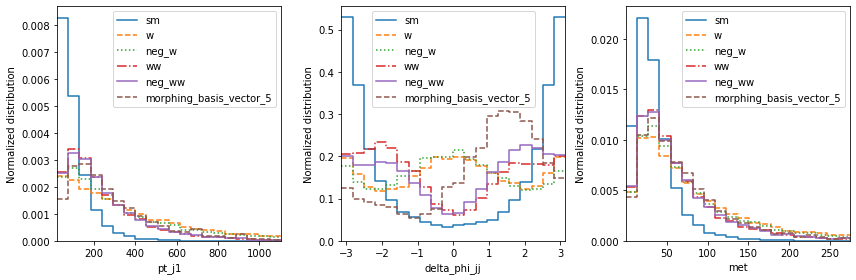

In [84]:
_ = plot_distributions(
    filename="data/lhe_data.h5",
    #parameter_points=["sm", np.array([10.0, 0.0])],
    parameter_points=None,
    #line_labels=["SM", "BSM"],
    line_labels=None,
    uncertainties="none",
    n_bins=20,
    n_cols=3,
    normalize=True,
    sample_only_from_closest_benchmark=True,
)

In [81]:
plot_distributions?

## 7. Combine and shuffle different samples

To reduce disk usage, you can generate several small event samples with the steps given above, and combine them now. Note that (for now) it is essential that all of them are generated with the same setup, including the same benchmark points / morphing basis!

This is generally good practice even if you use just one sample, since the events might have some inherent ordering (e.g. from sampling from different hypotheses). Later when we split the events into a training and test fraction, such an ordering could cause problems.

In [82]:
combine_and_shuffle(["data/lhe_data.h5"], "data/lhe_data_shuffled.h5")

17:12 madminer.sampling.co DEBUG   Combining and shuffling samples
17:12 madminer.sampling.co DEBUG   Copying setup from data/lhe_data.h5 to data/lhe_data_shuffled.h5
17:12 madminer.sampling.co DEBUG   Loading samples from file 1 / 1 at data/lhe_data.h5, multiplying weights with k factor 1.0
17:12 madminer.utils.inter ERROR   HDF5 file does not contain nuisance parameters information
17:12 madminer.utils.inter ERROR   HDF5 file does not contain finite difference information
17:12 madminer.utils.inter ERROR   HDF5 file does not contain systematic information
17:12 madminer.sampling.co DEBUG   Sampling benchmarks: [ 0 -1  0 ... -1 -1  0]
17:12 madminer.sampling.co DEBUG   Sampling benchmarks: [ 2 -1  3 ...  3 -1  3]
17:12 madminer.sampling.co DEBUG   Combined sampling benchmarks: [ 0 -1  0 ...  3 -1  3]
17:12 madminer.sampling.co DEBUG   Recalculated event numbers per benchmark: [49992 10000 10000  9999 10000     0], background: 30026
